# 🚂 TCC - Classificação de Dormentes Ferroviários

**Objetivo:** Avaliação da qualidade de dormentes de concreto baseado em visão computacional e redes neurais convolucionais.

**Classes:**
- `good` - Dormentes em bom estado
- `fair` - Dormentes em estado regular
- `poor` - Dormentes em mau estado

**Tratamentos de Pré-processamento:**
- 🔇 Redução de ruídos (filtros de suavização)
- ✂️ Eliminação de bordas desnecessárias (auto-crop)
- 💡 Ajuste de iluminação
- 📐 Redimensionamento para 224x224 pixels

**Técnicas de Multiplicação (Data Augmentation):**
- Rotações (90°, 180°, 270°)
- Espelhamento horizontal e vertical
- Variações de brilho e contraste

---

## 1. Configuração Inicial

In [ ]:
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/Drive')

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/Drive


In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import learning_curve, cross_validate
import pickle
import joblib
import os
import shutil
import random
import seaborn as sns
import pandas as pd
import numpy as np
import json
import warnings
from datetime import datetime
import matplotlib.pyplot as plt
from PIL import Image, ImageOps, ImageEnhance, ImageFilter
from pathlib import Path
from collections import Counter
import cv2
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, make_scorer, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
import time
import platform
from skimage.feature import hog
from skimage.color import rgb2gray
from sklearn.decomposition import PCA
from itertools import product
from sklearn.utils.class_weight import compute_sample_weight


# Configurações de visualização
plt.style.use('default')
%matplotlib inline

# TensorFlow e Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from tensorflow.keras.applications import (
    MobileNetV2,
    ResNet50,
    EfficientNetB0,
    InceptionV3,
    DenseNet121
)

# Scikit-learn para métricas
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_recall_fscore_support,
    precision_score,
    recall_score,
    f1_score
)

# Visualização
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Seed para reprodutibilidade
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

print(f"✅ TensorFlow versão: {tf.__version__}")
print("✅ Bibliotecas importadas com sucesso!")

✅ TensorFlow versão: 2.20.0
✅ Bibliotecas importadas com sucesso!


In [ ]:
# ========================================
# 📁 CONFIGURAÇÃO DOS CAMINHOS
# ========================================

# Caminho base do dataset original
BASE_PATH = '/content/Drive/MyDrive/Colab Notebooks/TCC2/FotosTCC'

# Caminho para salvar o dataset PROCESSADO E MULTIPLICADO
OUTPUT_PATH_AUGMENTED = '/content/Drive/MyDrive/Colab Notebooks/TCC2/dataset_final'

# Caminho do dataset processado (output do item anterior)
DATASET_PATH = '/content/Drive/MyDrive/Colab Notebooks/TCC2/dataset_final'

# Caminho para salvar os modelos treinados
MODELS_PATH = '/content/Drive/MyDrive/Colab Notebooks/TCC2/models'
os.makedirs(MODELS_PATH, exist_ok=True)

# Caminho para salvar resultados
RESULTS_PATH = '/content/Drive/MyDrive/Colab Notebooks/TCC2/results'
os.makedirs(RESULTS_PATH, exist_ok=True)

# Classes
CLASSES = ['fair', 'good', 'poor']
NUM_CLASSES = len(CLASSES)

# Declaração dos hiperparâmtros iniciais
IMG_SIZE = 224
BATCH_SIZE = 32
INITIAL_EPOCHS = 30  # Transfer learning
FINETUNE_EPOCHS = 20  # Fine-tuning
LEARNING_RATE_INITIAL = 1e-3
LEARNING_RATE_FINETUNE = 1e-4

# Proporção para validação (extraída do treino)
VAL_SPLIT = 0.25  # 25% do treino vira validação

# ========================================
# 🔧 CONFIGURAÇÃO DO PRÉ-PROCESSAMENTO
# ========================================

# Redução de ruído
APLICAR_REDUCAO_RUIDO = True
FORCA_REDUCAO_RUIDO = 7  # Tamanho do kernel (ímpar: 3, 5, 7, 9). Maior = mais suavização

# Eliminação de bordas
APLICAR_AUTO_CROP = True
MARGEM_CROP = 5  # Pixels de margem para não cortar demais
THRESHOLD_BORDA = 15  # Sensibilidade para detectar bordas escuras (0-255)

# Ajuste de iluminação (CLAHE - Contrast Limited Adaptive Histogram Equalization)
APLICAR_CLAHE = True
CLAHE_CLIP_LIMIT = 2.0  # Limite de contraste (1.0-4.0). Maior = mais contraste
CLAHE_GRID_SIZE = 8     # Tamanho da grade (8x8 é padrão)

# ========================================
# 🔄 CONFIGURAÇÃO DA MULTIPLICAÇÃO
# ========================================

MULTIPLICAR_TREINO = True   # Multiplicar apenas o treino
MULTIPLICAR_VAL = False     # NÃO multiplicar validação
MULTIPLICAR_TEST = False    # NÃO multiplicar teste

print(f"📂 Caminho base: {BASE_PATH}")
print(f"📂 Caminho saída: {OUTPUT_PATH_AUGMENTED}")
print(f"📁 Dataset final: {DATASET_PATH}")
print(f"🖼️ Tamanho das imagens: {IMG_SIZE}x{IMG_SIZE}")
print(f"💾 Modelos serão salvos em: {MODELS_PATH}")
print(f"📊 Resultados serão salvos em: {RESULTS_PATH}")
print(f"\n⚙️ Configurações:")
print(f"   • Tamanho da imagem: {IMG_SIZE}x{IMG_SIZE}")
print(f"   • Batch size: {BATCH_SIZE}")
print(f"   • Classes: {CLASSES}")
print(f"   • Épocas transfer learning: {INITIAL_EPOCHS}")
print(f"   • Épocas fine-tuning: {FINETUNE_EPOCHS}")
print(f"\n🔧 Pré-processamento:")
print(f"   Redução de ruído: {'SIM' if APLICAR_REDUCAO_RUIDO else 'NÃO'} (kernel={FORCA_REDUCAO_RUIDO})")
print(f"   Auto-crop bordas: {'SIM' if APLICAR_AUTO_CROP else 'NÃO'} (threshold={THRESHOLD_BORDA})")
print(f"   Ajuste iluminação (CLAHE): {'SIM' if APLICAR_CLAHE else 'NÃO'} (clip={CLAHE_CLIP_LIMIT})")
print(f"\n🔄 Multiplicação:")
print(f"   Treino: {'SIM (12x)' if MULTIPLICAR_TREINO else 'NÃO'}")
print(f"   Validação: {'SIM' if MULTIPLICAR_VAL else 'NÃO'}")
print(f"   Teste: {'SIM' if MULTIPLICAR_TEST else 'NÃO'}")

📂 Caminho base: /content/Drive/MyDrive/Colab Notebooks/TCC2/FotosTCC
📂 Caminho saída: /content/Drive/MyDrive/Colab Notebooks/TCC2/dataset_final
📁 Dataset final: /content/Drive/MyDrive/Colab Notebooks/TCC2/dataset_final
🖼️ Tamanho das imagens: 224x224
💾 Modelos serão salvos em: /content/Drive/MyDrive/Colab Notebooks/TCC2/models
📊 Resultados serão salvos em: /content/Drive/MyDrive/Colab Notebooks/TCC2/results

⚙️ Configurações:
   • Tamanho da imagem: 224x224
   • Batch size: 32
   • Classes: ['fair', 'good', 'poor']
   • Épocas transfer learning: 30
   • Épocas fine-tuning: 20

🔧 Pré-processamento:
   Redução de ruído: SIM (kernel=7)
   Auto-crop bordas: SIM (threshold=15)
   Ajuste iluminação (CLAHE): SIM (clip=2.0)

🔄 Multiplicação:
   Treino: SIM (12x)
   Validação: NÃO
   Teste: NÃO


## 2. Análise Exploratória do Dataset Original

In [ ]:
# Verificar estrutura do dataset
print("📁 Estrutura do dataset original:\n")

def analisar_pasta(path, nivel=0):
    """Analisa recursivamente a estrutura de pastas"""
    indent = "  " * nivel
    try:
        items = sorted(os.listdir(path))
        for item in items:
            item_path = os.path.join(path, item)
            if os.path.isdir(item_path):
                imgs = [f for f in os.listdir(item_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                print(f"{indent}📁 {item}/ ({len(imgs)} imagens)")
                if nivel < 2:
                    analisar_pasta(item_path, nivel + 1)
    except Exception as e:
        print(f"{indent}❌ Erro ao acessar: {e}")

analisar_pasta(BASE_PATH)

📁 Estrutura do dataset original:

📁 test/ (0 imagens)
  📁 fair/ (86 imagens)
  📁 good/ (93 imagens)
  📁 poor/ (108 imagens)
📁 train/ (0 imagens)
  📁 fair/ (159 imagens)
  📁 good/ (175 imagens)
  📁 poor/ (200 imagens)
📁 val/ (0 imagens)
  📁 fair/ (40 imagens)
  📁 good/ (43 imagens)
  📁 poor/ (51 imagens)


In [ ]:
# Função para coletar todas as imagens e suas informações
def coletar_info_imagens(base_path):
    info = {
        'train': {cls: [] for cls in CLASSES},
        'test': {cls: [] for cls in CLASSES}
    }

    for split in ['train', 'test']:
        split_path = os.path.join(base_path, split)
        if not os.path.exists(split_path):
            print(f"⚠️ Pasta não encontrada: {split_path}")
            continue

        for cls in CLASSES:
            cls_path = os.path.join(split_path, cls)
            if not os.path.exists(cls_path):
                print(f"⚠️ Classe não encontrada: {cls_path}")
                continue

            for img_name in os.listdir(cls_path):
                if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                    img_path = os.path.join(cls_path, img_name)
                    try:
                        with Image.open(img_path) as img:
                            info[split][cls].append({
                                'path': img_path,
                                'name': img_name,
                                'size': img.size,
                                'mode': img.mode
                            })
                    except Exception as e:
                        print(f"❌ Erro ao ler {img_path}: {e}")

    return info

print("🔍 Analisando imagens...")
dataset_info = coletar_info_imagens(BASE_PATH)
print("✅ Análise concluída!")

🔍 Analisando imagens...
✅ Análise concluída!


In [ ]:
# Resumo do banco de dados
print("\n" + "="*60)
print("📊 RESUMO DO DATASET ORIGINAL")
print("="*60)

total_geral = 0
for split in ['train', 'test']:
    print(f"\n📁 {split.upper()}:")
    total_split = 0
    for cls in CLASSES:
        qtd = len(dataset_info[split][cls])
        total_split += qtd
        print(f"   • {cls}: {qtd} imagens")
    print(f"   ─────────────────")
    print(f"   Total: {total_split} imagens")
    total_geral += total_split

print(f"\n{'='*60}")
print(f"📈 TOTAL GERAL: {total_geral} imagens")
print("="*60)


📊 RESUMO DO DATASET ORIGINAL

📁 TRAIN:
   • fair: 159 imagens
   • good: 175 imagens
   • poor: 200 imagens
   ─────────────────
   Total: 534 imagens

📁 TEST:
   • fair: 86 imagens
   • good: 93 imagens
   • poor: 108 imagens
   ─────────────────
   Total: 287 imagens

📈 TOTAL GERAL: 821 imagens


## 3. Funções de Pré-processamento

Aqui definimos as funções para:
1. **Redução de ruídos** - Filtro bilateral (preserva bordas)
2. **Eliminação de bordas** - Auto-crop inteligente
3. **Ajuste de iluminação** - CLAHE

In [ ]:
class ImagePreprocessor:
    """
    Classe para aplicar pré-processamento nas imagens.
    Inclui: redução de ruído, auto-crop de bordas e ajuste de iluminação.
    """

    def __init__(self, img_size=224,
                 aplicar_reducao_ruido=True, forca_ruido=7,
                 aplicar_auto_crop=True, margem_crop=5, threshold_borda=15,
                 aplicar_clahe=True, clahe_clip=2.0, clahe_grid=8):

        self.img_size = img_size

        # Configurações de redução de ruído
        self.aplicar_reducao_ruido = aplicar_reducao_ruido
        self.forca_ruido = forca_ruido

        # Configurações de auto-crop
        self.aplicar_auto_crop = aplicar_auto_crop
        self.margem_crop = margem_crop
        self.threshold_borda = threshold_borda

        # Configurações de CLAHE
        self.aplicar_clahe = aplicar_clahe
        self.clahe_clip = clahe_clip
        self.clahe_grid = clahe_grid

        # Criar objeto CLAHE
        if self.aplicar_clahe:
            self.clahe = cv2.createCLAHE(
                clipLimit=self.clahe_clip,
                tileGridSize=(self.clahe_grid, self.clahe_grid)
            )

    def carregar_imagem(self, img_path):
        """Carrega imagem usando OpenCV (BGR)"""
        img = cv2.imread(img_path)
        if img is None:
            # Fallback para PIL
            pil_img = Image.open(img_path).convert('RGB')
            img = cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)
        return img

    # ==========================================
    # 1. REDUÇÃO DE RUÍDO
    # ==========================================

    def reduzir_ruido(self, img):
        """
        Aplica redução de ruído usando filtro bilateral.
        O filtro bilateral preserva as bordas enquanto suaviza áreas uniformes.
        """
        # Filtro bilateral: preserva bordas, remove ruído
        # Parâmetros: (img, d, sigmaColor, sigmaSpace)
        # d = diâmetro do pixel vizinho
        # sigmaColor = filtro sigma no espaço de cor
        # sigmaSpace = filtro sigma no espaço de coordenadas
        img_denoised = cv2.bilateralFilter(
            img,
            d=self.forca_ruido,
            sigmaColor=75,
            sigmaSpace=75
        )
        return img_denoised

    def reduzir_ruido_nlm(self, img):
        """
        Alternativa: Non-Local Means Denoising.
        Mais lento, mas geralmente melhor qualidade.
        """
        img_denoised = cv2.fastNlMeansDenoisingColored(
            img,
            None,
            h=10,           # Força do filtro (maior = mais suavização)
            hColor=10,      # Força do filtro para componentes de cor
            templateWindowSize=7,
            searchWindowSize=21
        )
        return img_denoised

    # ==========================================
    # 2. ELIMINAÇÃO DE BORDAS (AUTO-CROP)
    # ==========================================

    def auto_crop(self, img):
        """
        Remove bordas escuras/desnecessárias automaticamente.
        Detecta a região de interesse e recorta.
        """
        # Converter para escala de cinza
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Aplicar threshold para encontrar região não-preta
        _, thresh = cv2.threshold(gray, self.threshold_borda, 255, cv2.THRESH_BINARY)

        # Encontrar contornos
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if len(contours) == 0:
            return img  # Retorna original se não encontrar contornos

        # Encontrar bounding box que engloba todos os contornos
        x_min, y_min = img.shape[1], img.shape[0]
        x_max, y_max = 0, 0

        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            x_min = min(x_min, x)
            y_min = min(y_min, y)
            x_max = max(x_max, x + w)
            y_max = max(y_max, y + h)

        # Adicionar margem de segurança
        x_min = max(0, x_min - self.margem_crop)
        y_min = max(0, y_min - self.margem_crop)
        x_max = min(img.shape[1], x_max + self.margem_crop)
        y_max = min(img.shape[0], y_max + self.margem_crop)

        # Verificar se o crop é válido (não muito pequeno)
        crop_width = x_max - x_min
        crop_height = y_max - y_min

        # Se o crop for muito pequeno (menos de 50% da imagem), retorna original
        if crop_width < img.shape[1] * 0.5 or crop_height < img.shape[0] * 0.5:
            return img

        # Recortar imagem
        img_cropped = img[y_min:y_max, x_min:x_max]

        return img_cropped

    def auto_crop_smart(self, img):
        """
        Auto-crop mais inteligente usando detecção de bordas.
        Detecta bordas uniformes (pretas, brancas ou de cor sólida).
        """
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        h, w = gray.shape

        # Calcular média e desvio padrão das bordas
        def is_border_uniform(strip, threshold=20):
            return np.std(strip) < threshold

        # Encontrar bordas uniformes
        top, bottom, left, right = 0, h, 0, w

        # Verificar topo
        for i in range(min(h//4, 50)):  # Verificar até 25% ou 50 pixels
            if is_border_uniform(gray[i, :]):
                top = i + 1
            else:
                break

        # Verificar base
        for i in range(h-1, max(h*3//4, h-50), -1):
            if is_border_uniform(gray[i, :]):
                bottom = i
            else:
                break

        # Verificar esquerda
        for i in range(min(w//4, 50)):
            if is_border_uniform(gray[:, i]):
                left = i + 1
            else:
                break

        # Verificar direita
        for i in range(w-1, max(w*3//4, w-50), -1):
            if is_border_uniform(gray[:, i]):
                right = i
            else:
                break

        # Adicionar margem
        top = max(0, top - self.margem_crop)
        bottom = min(h, bottom + self.margem_crop)
        left = max(0, left - self.margem_crop)
        right = min(w, right + self.margem_crop)

        # Verificar se o crop é válido
        if (right - left) < w * 0.5 or (bottom - top) < h * 0.5:
            return img

        return img[top:bottom, left:right]

    # ==========================================
    # 3. AJUSTE DE ILUMINAÇÃO (CLAHE)
    # ==========================================

    def ajustar_iluminacao_clahe(self, img):
        """
        Aplica CLAHE (Contrast Limited Adaptive Histogram Equalization).
        Melhora o contraste local sem amplificar ruído.
        """
        # Converter para LAB (Luminância + canais de cor)
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

        # Separar canais
        l, a, b = cv2.split(lab)

        # Aplicar CLAHE apenas no canal L (luminância)
        l_clahe = self.clahe.apply(l)

        # Juntar canais novamente
        lab_clahe = cv2.merge([l_clahe, a, b])

        # Converter de volta para BGR
        img_clahe = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

        return img_clahe

    def ajustar_iluminacao_gamma(self, img, gamma=1.0):
        """
        Alternativa: Correção gamma para ajuste de brilho.
        gamma < 1: clareia a imagem
        gamma > 1: escurece a imagem
        """
        # Calcular gamma automaticamente baseado na luminosidade média
        if gamma == 1.0:  # Auto-gamma
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            mean_brightness = np.mean(gray)

            # Alvo: luminosidade média de 127 (meio-termo)
            if mean_brightness < 100:  # Imagem escura
                gamma = 0.7  # Clarear
            elif mean_brightness > 160:  # Imagem clara
                gamma = 1.3  # Escurecer
            else:
                return img  # Já está ok

        # Criar tabela de lookup para correção gamma
        inv_gamma = 1.0 / gamma
        table = np.array([
            ((i / 255.0) ** inv_gamma) * 255
            for i in np.arange(0, 256)
        ]).astype("uint8")

        return cv2.LUT(img, table)

    # ==========================================
    # 4. REDIMENSIONAMENTO
    # ==========================================

    def redimensionar_com_padding(self, img):
        """
        Redimensiona mantendo proporção e adiciona padding preto.
        """
        h, w = img.shape[:2]

        # Calcular escala
        scale = min(self.img_size / w, self.img_size / h)
        new_w = int(w * scale)
        new_h = int(h * scale)

        # Redimensionar
        img_resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_LANCZOS4)

        # Criar imagem com padding preto
        img_padded = np.zeros((self.img_size, self.img_size, 3), dtype=np.uint8)

        # Centralizar
        x_offset = (self.img_size - new_w) // 2
        y_offset = (self.img_size - new_h) // 2
        img_padded[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = img_resized

        return img_padded

    # ==========================================
    # PROCEDIMENTO COMPLETO
    # ==========================================

    def processar(self, img_path):
        """
        Aplica todo o pipeline de pré-processamento.
        Ordem: Carregar → Ruído → Auto-crop → CLAHE → Redimensionar
        """
        # 1. Carregar imagem
        img = self.carregar_imagem(img_path)

        # 2. Redução de ruído (antes do crop para melhor detecção)
        if self.aplicar_reducao_ruido:
            img = self.reduzir_ruido(img)

        # 3. Auto-crop de bordas
        if self.aplicar_auto_crop:
            img = self.auto_crop_smart(img)

        # 4. Ajuste de iluminação (CLAHE)
        if self.aplicar_clahe:
            img = self.ajustar_iluminacao_clahe(img)

        # 5. Redimensionar com padding
        img = self.redimensionar_com_padding(img)

        return img

    def processar_para_pil(self, img_path):
        """
        Processa e retorna como imagem PIL (para data augmentation).
        """
        img_cv = self.processar(img_path)
        # Converter BGR para RGB e depois para PIL
        img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
        return Image.fromarray(img_rgb)


# Instanciar o preprocessador
preprocessor = ImagePreprocessor(
    img_size=IMG_SIZE,
    aplicar_reducao_ruido=APLICAR_REDUCAO_RUIDO,
    forca_ruido=FORCA_REDUCAO_RUIDO,
    aplicar_auto_crop=APLICAR_AUTO_CROP,
    margem_crop=MARGEM_CROP,
    threshold_borda=THRESHOLD_BORDA,
    aplicar_clahe=APLICAR_CLAHE,
    clahe_clip=CLAHE_CLIP_LIMIT,
    clahe_grid=CLAHE_GRID_SIZE
)

print("✅ ImagePreprocessor criado com sucesso!")

✅ ImagePreprocessor criado com sucesso!


🔍 Demonstração do pré-processamento:



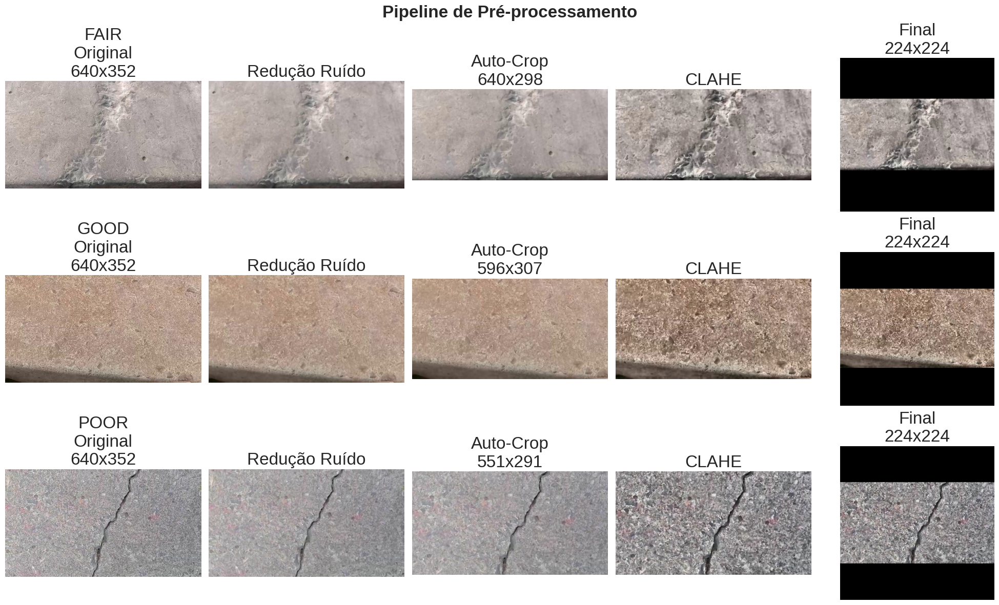


💾 Demonstração salva em: /content/pipeline_preprocessamento.png


In [ ]:
# Demonstração do pré-processamento em uma imagem
print("🔍 Demonstração do pré-processamento:\n")

# Pegar uma imagem de exemplo de cada classe
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
fig.suptitle('Pipeline de Pré-processamento', fontsize=24, fontweight='bold')

colunas = ['Original', 'Redução Ruído', 'Auto-Crop', 'CLAHE', 'Final']

for row, cls in enumerate(CLASSES):
    # Pegar uma imagem
    img_info = dataset_info['train'][cls][0]
    img_path = img_info['path']

    # 1. Original
    img_original = cv2.imread(img_path)
    img_original_rgb = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)
    axes[row, 0].imshow(img_original_rgb)
    axes[row, 0].set_title(f'{cls.upper()}\n{colunas[0]}\n{img_original.shape[1]}x{img_original.shape[0]}', fontsize=24)
    axes[row, 0].axis('off')

    # 2. Após redução de ruído
    img_denoised = preprocessor.reduzir_ruido(img_original.copy())
    axes[row, 1].imshow(cv2.cvtColor(img_denoised, cv2.COLOR_BGR2RGB))
    axes[row, 1].set_title(colunas[1], fontsize=24)
    axes[row, 1].axis('off')

    # 3. Após auto-crop
    img_cropped = preprocessor.auto_crop_smart(img_denoised.copy())
    axes[row, 2].imshow(cv2.cvtColor(img_cropped, cv2.COLOR_BGR2RGB))
    axes[row, 2].set_title(f'{colunas[2]}\n{img_cropped.shape[1]}x{img_cropped.shape[0]}', fontsize=24)
    axes[row, 2].axis('off')

    # 4. Após CLAHE
    img_clahe = preprocessor.ajustar_iluminacao_clahe(img_cropped.copy())
    axes[row, 3].imshow(cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB))
    axes[row, 3].set_title(colunas[3], fontsize=24)
    axes[row, 3].axis('off')

    # 5. Final (redimensionado)
    img_final = preprocessor.redimensionar_com_padding(img_clahe)
    axes[row, 4].imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
    axes[row, 4].set_title(f'{colunas[4]}\n{IMG_SIZE}x{IMG_SIZE}', fontsize=24)
    axes[row, 4].axis('off')

plt.tight_layout()
plt.savefig('/content/pipeline_preprocessamento.png', dpi=150, bbox_inches='tight')
plt.show()
print("\n💾 Demonstração salva em: /content/pipeline_preprocessamento.png")

🔍 Comparação detalhada (várias amostras):



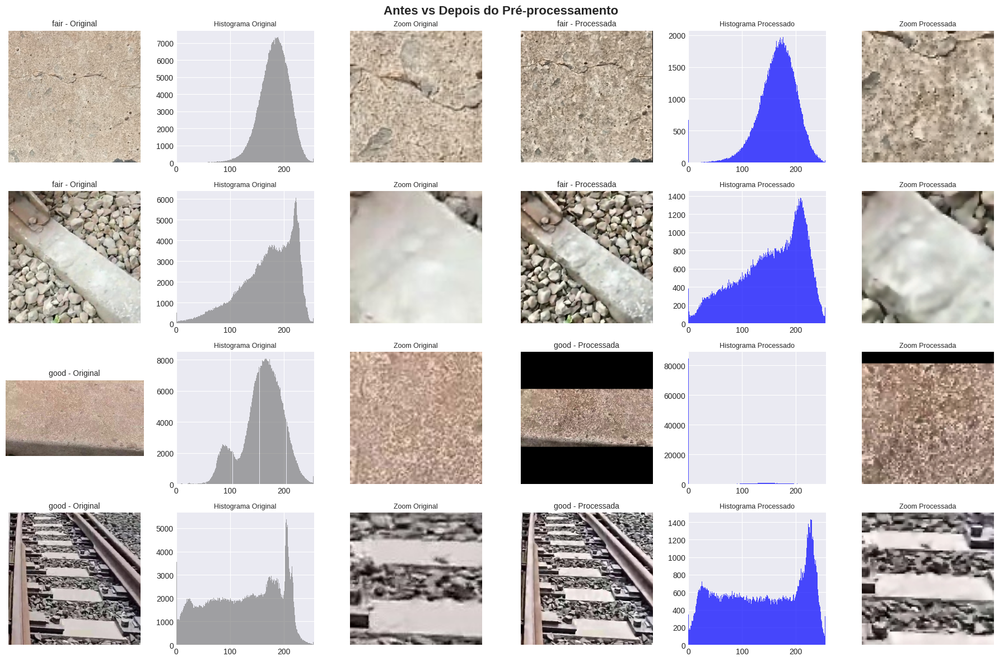


💾 Comparação salva em: /content/comparacao_antes_depois.png


In [ ]:
# Comparação detalhada: Antes vs Depois
print("🔍 Comparação detalhada (várias amostras):\n")

fig, axes = plt.subplots(4, 6, figsize=(18, 12))
fig.suptitle('Antes vs Depois do Pré-processamento', fontsize=16, fontweight='bold')

# Mostrar 4 imagens de cada vez
sample_imgs = []
for cls in CLASSES:
    samples = random.sample(dataset_info['train'][cls], min(2, len(dataset_info['train'][cls])))
    for s in samples:
        sample_imgs.append((cls, s))

# Limitar a 4 imagens
sample_imgs = sample_imgs[:4]

for row, (cls, img_info) in enumerate(sample_imgs):
    img_path = img_info['path']

    # Original
    img_original = cv2.imread(img_path)
    img_original_rgb = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    # Processada
    img_processed = preprocessor.processar(img_path)
    img_processed_rgb = cv2.cvtColor(img_processed, cv2.COLOR_BGR2RGB)

    # Mostrar original
    axes[row, 0].imshow(img_original_rgb)
    axes[row, 0].set_title(f'{cls} - Original', fontsize=10)
    axes[row, 0].axis('off')

    # Mostrar histograma original
    axes[row, 1].hist(img_original_rgb.ravel(), bins=256, color='gray', alpha=0.7)
    axes[row, 1].set_title('Histograma Original', fontsize=9)
    axes[row, 1].set_xlim([0, 256])

    # Zoom em região (original)
    h, w = img_original.shape[:2]
    crop_orig = img_original_rgb[h//4:h//4+100, w//4:w//4+100]
    axes[row, 2].imshow(crop_orig)
    axes[row, 2].set_title('Zoom Original', fontsize=9)
    axes[row, 2].axis('off')

    # Mostrar processada
    axes[row, 3].imshow(img_processed_rgb)
    axes[row, 3].set_title(f'{cls} - Processada', fontsize=10)
    axes[row, 3].axis('off')

    # Mostrar histograma processado
    axes[row, 4].hist(img_processed_rgb.ravel(), bins=256, color='blue', alpha=0.7)
    axes[row, 4].set_title('Histograma Processado', fontsize=9)
    axes[row, 4].set_xlim([0, 256])

    # Zoom em região (processada)
    crop_proc = img_processed_rgb[IMG_SIZE//4:IMG_SIZE//4+80, IMG_SIZE//4:IMG_SIZE//4+80]
    axes[row, 5].imshow(crop_proc)
    axes[row, 5].set_title('Zoom Processada', fontsize=9)
    axes[row, 5].axis('off')

plt.tight_layout()
plt.savefig('/content/comparacao_antes_depois.png', dpi=150, bbox_inches='tight')
plt.show()
print("\n💾 Comparação salva em: /content/comparacao_antes_depois.png")

## 4. Funções de Data Augmentation (Multiplicação)

In [ ]:
class DataAugmentor:
    """
    Classe para aplicar transformações de data augmentation em imagens.
    """

    # ==========================================
    # TRANSFORMAÇÕES GEOMÉTRICAS
    # ==========================================

    def rotacao_90(self, img):
        return img.rotate(-90, expand=False)

    def rotacao_180(self, img):
        return img.rotate(180, expand=False)

    def rotacao_270(self, img):
        return img.rotate(-270, expand=False)

    def flip_horizontal(self, img):
        return ImageOps.mirror(img)

    def flip_vertical(self, img):
        return ImageOps.flip(img)

    # ==========================================
    # TRANSFORMAÇÕES DE COR/BRILHO
    # ==========================================

    def brilho_aumentado(self, img, fator=1.2):
        enhancer = ImageEnhance.Brightness(img)
        return enhancer.enhance(fator)

    def brilho_reduzido(self, img, fator=0.8):
        enhancer = ImageEnhance.Brightness(img)
        return enhancer.enhance(fator)

    def contraste_aumentado(self, img, fator=1.3):
        enhancer = ImageEnhance.Contrast(img)
        return enhancer.enhance(fator)

    def contraste_reduzido(self, img, fator=0.8):
        enhancer = ImageEnhance.Contrast(img)
        return enhancer.enhance(fator)

    # ==========================================
    # TRANSFORMAÇÕES COMBINADAS
    # ==========================================

    def flip_h_rot90(self, img):
        return self.rotacao_90(self.flip_horizontal(img))

    def flip_v_rot90(self, img):
        return self.rotacao_90(self.flip_vertical(img))

    # ==========================================
    # MÉTODO PRINCIPAL
    # ==========================================

    def gerar_todas_variacoes(self, img):
        """
        Gera todas as variações de uma imagem (12 no total).
        """
        variacoes = {
            'original': img,
            'rot90': self.rotacao_90(img),
            'rot180': self.rotacao_180(img),
            'rot270': self.rotacao_270(img),
            'flip_h': self.flip_horizontal(img),
            'flip_v': self.flip_vertical(img),
            'flip_h_rot90': self.flip_h_rot90(img),
            'flip_v_rot90': self.flip_v_rot90(img),
            'brilho_up': self.brilho_aumentado(img),
            'brilho_down': self.brilho_reduzido(img),
            'contraste_up': self.contraste_aumentado(img),
            'contraste_down': self.contraste_reduzido(img),
        }
        return variacoes


augmentor = DataAugmentor()
print("✅ DataAugmentor criado!")
print("   Variações: original, rot90, rot180, rot270, flip_h, flip_v,")
print("              flip_h_rot90, flip_v_rot90, brilho_up, brilho_down,")
print("              contraste_up, contraste_down")
print("   Total: 12 variações por imagem")

✅ DataAugmentor criado!
   Variações: original, rot90, rot180, rot270, flip_h, flip_v,
              flip_h_rot90, flip_v_rot90, brilho_up, brilho_down,
              contraste_up, contraste_down
   Total: 12 variações por imagem


🔍 Demonstração das transformações de augmentation:



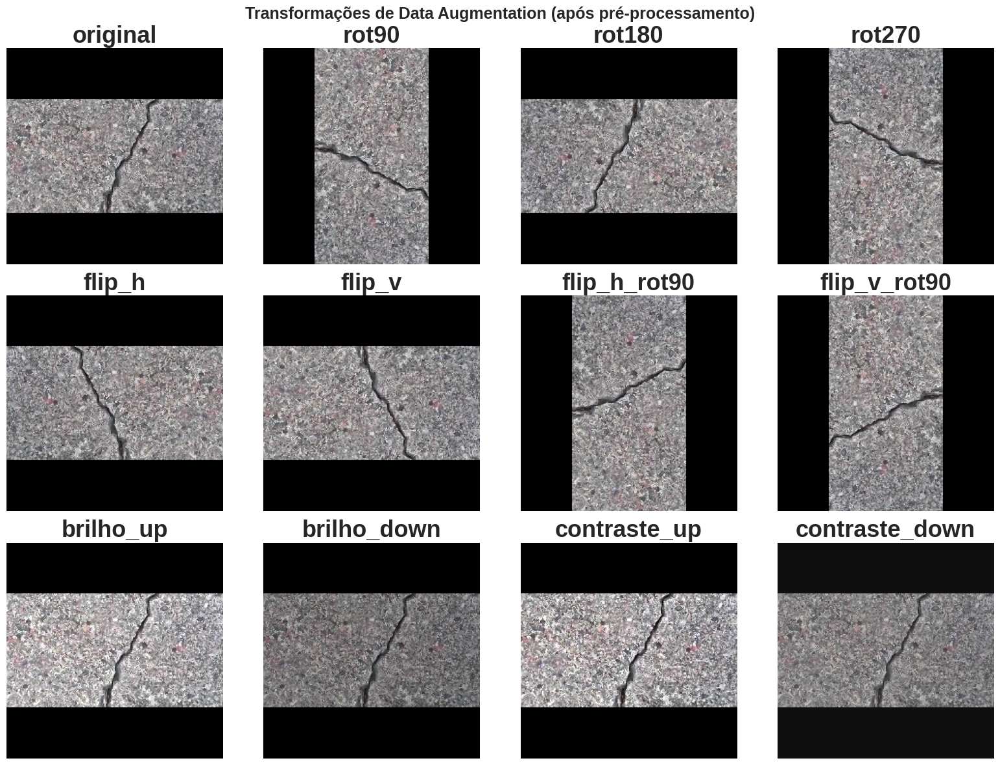

In [ ]:
# Demonstração das transformações
print("🔍 Demonstração das transformações de augmentation:\n")

# Pegar uma imagem processada
exemplo_path = dataset_info['train']['poor'][0]['path']
img_processada = preprocessor.processar_para_pil(exemplo_path)

# Gerar variações
variacoes = augmentor.gerar_todas_variacoes(img_processada)

# Visualizar
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle('Transformações de Data Augmentation (após pré-processamento)', fontsize=18, fontweight='bold')

for idx, (nome, img) in enumerate(variacoes.items()):
    row = idx // 4
    col = idx % 4
    axes[row, col].imshow(img)
    axes[row, col].set_title(nome, fontsize=26, fontweight='bold')
    axes[row, col].axis('off')

plt.tight_layout()
plt.savefig('/content/demonstracao_augmentation.png', dpi=150, bbox_inches='tight')
plt.show()

## 5. Divisão Treino/Validação

In [ ]:
# Dividir treino em treino + validação
def dividir_train_val(dataset_info, val_split=0.3):
    divisao = {
        'train': {cls: [] for cls in CLASSES},
        'val': {cls: [] for cls in CLASSES},
        'test': dataset_info['test']
    }

    print("📊 Dividindo treino em treino + validação:\n")

    for cls in CLASSES:
        imgs = dataset_info['train'][cls].copy()
        random.shuffle(imgs)
        n_val = int(len(imgs) * val_split)

        divisao['val'][cls] = imgs[:n_val]
        divisao['train'][cls] = imgs[n_val:]

        print(f"   {cls}: {len(dataset_info['train'][cls])} → "
              f"treino: {len(divisao['train'][cls])}, val: {len(divisao['val'][cls])}")

    return divisao

dataset_dividido = dividir_train_val(dataset_info, VAL_SPLIT)

📊 Dividindo treino em treino + validação:

   fair: 159 → treino: 120, val: 39
   good: 175 → treino: 132, val: 43
   poor: 200 → treino: 150, val: 50


In [ ]:
# Calcular tamanho esperado após multiplicação
print("\n" + "="*60)
print("📊 PROJEÇÃO DO DATASET FINAL")
print("="*60)

n_variacoes = 12  # Número de variações por imagem

print(f"\n{'Split':<10} {'Classe':<10} {'Original':<12} {'Multiplicado':<12} {'Fator'}")
print("-" * 55)

total_original = 0
total_final = 0

for split in ['train', 'val', 'test']:
    multiplicar = (split == 'train' and MULTIPLICAR_TREINO) or \
                  (split == 'val' and MULTIPLICAR_VAL) or \
                  (split == 'test' and MULTIPLICAR_TEST)

    for cls in CLASSES:
        original = len(dataset_dividido[split][cls])
        final = original * n_variacoes if multiplicar else original
        fator = n_variacoes if multiplicar else 1

        total_original += original
        total_final += final

        print(f"{split:<10} {cls:<10} {original:<12} {final:<12} {fator}x")
    print("-" * 55)

print(f"\n{'TOTAL':<10} {'':<10} {total_original:<12} {total_final:<12}")
print(f"\n📈 Aumento total: {total_original} → {total_final} ({total_final/total_original:.1f}x)")


📊 PROJEÇÃO DO DATASET FINAL

Split      Classe     Original     Multiplicado Fator
-------------------------------------------------------
train      fair       120          1440         12x
train      good       132          1584         12x
train      poor       150          1800         12x
-------------------------------------------------------
val        fair       39           39           1x
val        good       43           43           1x
val        poor       50           50           1x
-------------------------------------------------------
test       fair       86           86           1x
test       good       93           93           1x
test       poor       108          108          1x
-------------------------------------------------------

TOTAL                 821          5243        

📈 Aumento total: 821 → 5243 (6.4x)


## 6. Processamento e Multiplicação do Dataset

In [ ]:
# Criar estrutura de pastas
def criar_estrutura_pastas(output_path):
    if os.path.exists(output_path):
        print(f"⚠️ Removendo pasta existente: {output_path}")
        shutil.rmtree(output_path)

    for split in ['train', 'val', 'test']:
        for cls in CLASSES:
            path = os.path.join(output_path, split, cls)
            os.makedirs(path, exist_ok=True)

    print(f"✅ Estrutura criada em: {output_path}")

print("📁 Criando estrutura de pastas...")
criar_estrutura_pastas(OUTPUT_PATH_AUGMENTED)

📁 Criando estrutura de pastas...
⚠️ Removendo pasta existente: /content/Drive/MyDrive/Colab Notebooks/TCC2/dataset_final
✅ Estrutura criada em: /content/Drive/MyDrive/Colab Notebooks/TCC2/dataset_final


In [ ]:
def processar_e_multiplicar_dataset(dataset_dividido, output_path, preprocessor, augmentor,
                                     multiplicar_train=True, multiplicar_val=False, multiplicar_test=False):
    """
    Pipeline completo: pré-processamento + multiplicação.
    """

    stats = {
        'train': {'original': 0, 'geradas': 0, 'erros': 0},
        'val': {'original': 0, 'geradas': 0, 'erros': 0},
        'test': {'original': 0, 'geradas': 0, 'erros': 0}
    }

    multiplicar_config = {
        'train': multiplicar_train,
        'val': multiplicar_val,
        'test': multiplicar_test
    }

    for split in ['train', 'val', 'test']:
        print(f"\n{'='*60}")
        print(f"📁 Processando {split.upper()}...")
        multiplicar = multiplicar_config[split]
        print(f"   Pré-processamento: Ruído + Auto-crop + CLAHE + Resize")
        print(f"   Multiplicação: {'ATIVADA (12x)' if multiplicar else 'DESATIVADA (1x)'}")
        print(f"{'='*60}")

        for cls in CLASSES:
            imgs = dataset_dividido[split][cls]
            output_dir = os.path.join(output_path, split, cls)

            print(f"\n   🏷️ Classe: {cls} ({len(imgs)} imagens originais)")

            for img_info in tqdm(imgs, desc=f"      {cls}", leave=True):
                try:
                    # 1. Pré-processar imagem (ruído, crop, CLAHE, resize)
                    img_processada = preprocessor.processar_para_pil(img_info['path'])

                    nome_base = os.path.splitext(img_info['name'])[0]

                    if multiplicar:
                        # 2. Gerar todas as variações
                        variacoes = augmentor.gerar_todas_variacoes(img_processada)

                        for nome_var, img_var in variacoes.items():
                            nome_arquivo = f"{nome_base}_{nome_var}.jpg"
                            caminho_saida = os.path.join(output_dir, nome_arquivo)
                            img_var.save(caminho_saida, 'JPEG', quality=95)

                            if nome_var == 'original':
                                stats[split]['original'] += 1
                            else:
                                stats[split]['geradas'] += 1
                    else:
                        # Salvar apenas a imagem processada
                        nome_arquivo = f"{nome_base}.jpg"
                        caminho_saida = os.path.join(output_dir, nome_arquivo)
                        img_processada.save(caminho_saida, 'JPEG', quality=95)
                        stats[split]['original'] += 1

                except Exception as e:
                    print(f"\n      ❌ Erro em {img_info['name']}: {e}")
                    stats[split]['erros'] += 1

            total_classe = len([f for f in os.listdir(output_dir) if f.endswith('.jpg')])
            print(f"      ✓ {total_classe} imagens salvas")

    return stats


print("🔄 Iniciando processamento completo do dataset...")
print(f"\n📋 Pipeline:")
print(f"   1. Redução de ruído (filtro bilateral)")
print(f"   2. Auto-crop de bordas")
print(f"   3. Ajuste de iluminação (CLAHE)")
print(f"   4. Redimensionamento para {IMG_SIZE}x{IMG_SIZE}")
print(f"   5. Multiplicação (12 variações) - apenas treino")

stats = processar_e_multiplicar_dataset(
    dataset_dividido,
    OUTPUT_PATH_AUGMENTED,
    preprocessor,
    augmentor,
    multiplicar_train=MULTIPLICAR_TREINO,
    multiplicar_val=MULTIPLICAR_VAL,
    multiplicar_test=MULTIPLICAR_TEST
)

🔄 Iniciando processamento completo do dataset...

📋 Pipeline:
   1. Redução de ruído (filtro bilateral)
   2. Auto-crop de bordas
   3. Ajuste de iluminação (CLAHE)
   4. Redimensionamento para 224x224
   5. Multiplicação (12 variações) - apenas treino

📁 Processando TRAIN...
   Pré-processamento: Ruído + Auto-crop + CLAHE + Resize
   Multiplicação: ATIVADA (12x)

   🏷️ Classe: fair (120 imagens originais)


      fair: 100%|██████████| 120/120 [00:19<00:00,  6.17it/s]


      ✓ 1440 imagens salvas

   🏷️ Classe: good (132 imagens originais)


      good: 100%|██████████| 132/132 [00:25<00:00,  5.25it/s]


      ✓ 1584 imagens salvas

   🏷️ Classe: poor (150 imagens originais)


      poor: 100%|██████████| 150/150 [00:28<00:00,  5.31it/s]


      ✓ 1800 imagens salvas

📁 Processando VAL...
   Pré-processamento: Ruído + Auto-crop + CLAHE + Resize
   Multiplicação: DESATIVADA (1x)

   🏷️ Classe: fair (39 imagens originais)


      fair: 100%|██████████| 39/39 [00:04<00:00,  8.42it/s]


      ✓ 39 imagens salvas

   🏷️ Classe: good (43 imagens originais)


      good: 100%|██████████| 43/43 [00:02<00:00, 18.42it/s]


      ✓ 43 imagens salvas

   🏷️ Classe: poor (50 imagens originais)


      poor: 100%|██████████| 50/50 [00:03<00:00, 12.53it/s]


      ✓ 50 imagens salvas

📁 Processando TEST...
   Pré-processamento: Ruído + Auto-crop + CLAHE + Resize
   Multiplicação: DESATIVADA (1x)

   🏷️ Classe: fair (86 imagens originais)


      fair: 100%|██████████| 86/86 [00:04<00:00, 18.60it/s]


      ✓ 86 imagens salvas

   🏷️ Classe: good (93 imagens originais)


      good: 100%|██████████| 93/93 [00:08<00:00, 11.07it/s]


      ✓ 93 imagens salvas

   🏷️ Classe: poor (108 imagens originais)


      poor: 100%|██████████| 108/108 [00:09<00:00, 11.12it/s]

      ✓ 108 imagens salvas


In [ ]:
# Resumo do processamento
print("\n" + "="*60)
print("📊 RESUMO DO PROCESSAMENTO")
print("="*60)

for split in ['train', 'val', 'test']:
    total = stats[split]['original'] + stats[split]['geradas']
    print(f"\n📁 {split.upper()}:")
    print(f"   • Imagens originais processadas: {stats[split]['original']}")
    print(f"   • Imagens geradas (augmentation): {stats[split]['geradas']}")
    print(f"   • Erros: {stats[split]['erros']}")
    print(f"   ─────────────────────")
    print(f"   • TOTAL: {total}")


📊 RESUMO DO PROCESSAMENTO

📁 TRAIN:
   • Imagens originais processadas: 402
   • Imagens geradas (augmentation): 4422
   • Erros: 0
   ─────────────────────
   • TOTAL: 4824

📁 VAL:
   • Imagens originais processadas: 132
   • Imagens geradas (augmentation): 0
   • Erros: 0
   ─────────────────────
   • TOTAL: 132

📁 TEST:
   • Imagens originais processadas: 287
   • Imagens geradas (augmentation): 0
   • Erros: 0
   ─────────────────────
   • TOTAL: 287


## 7. Verificação do Dataset Final

In [ ]:
# Verificar dataset processado
def verificar_dataset(output_path):
    print("\n" + "="*60)
    print("📊 DATASET FINAL - VERIFICAÇÃO")
    print("="*60)

    info = {}
    total_geral = 0

    for split in ['train', 'val', 'test']:
        print(f"\n📁 {split.upper()}:")
        total_split = 0
        info[split] = {}

        for cls in CLASSES:
            cls_path = os.path.join(output_path, split, cls)
            if os.path.exists(cls_path):
                imgs = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                qtd = len(imgs)
            else:
                imgs = []
                qtd = 0

            total_split += qtd
            info[split][cls] = imgs
            print(f"   • {cls}: {qtd} imagens")

        print(f"   ─────────────────")
        print(f"   Total: {total_split} imagens")
        total_geral += total_split

    print(f"\n{'='*60}")
    print(f"📈 TOTAL GERAL: {total_geral} imagens")
    print("="*60)

    return info

info_final = verificar_dataset(OUTPUT_PATH_AUGMENTED)


📊 DATASET FINAL - VERIFICAÇÃO

📁 TRAIN:
   • fair: 1440 imagens
   • good: 1584 imagens
   • poor: 1800 imagens
   ─────────────────
   Total: 4824 imagens

📁 VAL:
   • fair: 39 imagens
   • good: 43 imagens
   • poor: 50 imagens
   ─────────────────
   Total: 132 imagens

📁 TEST:
   • fair: 86 imagens
   • good: 93 imagens
   • poor: 108 imagens
   ─────────────────
   Total: 287 imagens

📈 TOTAL GERAL: 5243 imagens


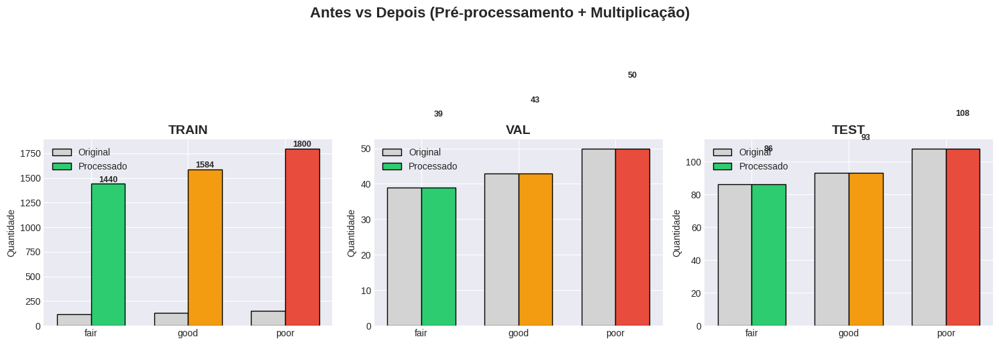

In [ ]:
# Gráfico comparativo
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

colors = ['#2ecc71', '#f39c12', '#e74c3c']
x = np.arange(len(CLASSES))
width = 0.35

for idx, split in enumerate(['train', 'val', 'test']):
    antes = [len(dataset_dividido[split][cls]) for cls in CLASSES]
    depois = [len(info_final[split][cls]) for cls in CLASSES]

    bars1 = axes[idx].bar(x - width/2, antes, width, label='Original', color='lightgray', edgecolor='black')
    bars2 = axes[idx].bar(x + width/2, depois, width, label='Processado', color=colors, edgecolor='black')

    axes[idx].set_title(f'{split.upper()}', fontsize=14, fontweight='bold')
    axes[idx].set_ylabel('Quantidade')
    axes[idx].set_xticks(x)
    axes[idx].set_xticklabels(CLASSES)
    axes[idx].legend()

    for bar, val in zip(bars2, depois):
        axes[idx].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20,
                      str(val), ha='center', fontweight='bold', fontsize=9)

plt.suptitle('Antes vs Depois (Pré-processamento + Multiplicação)', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('/content/comparacao_final.png', dpi=150, bbox_inches='tight')
plt.show()

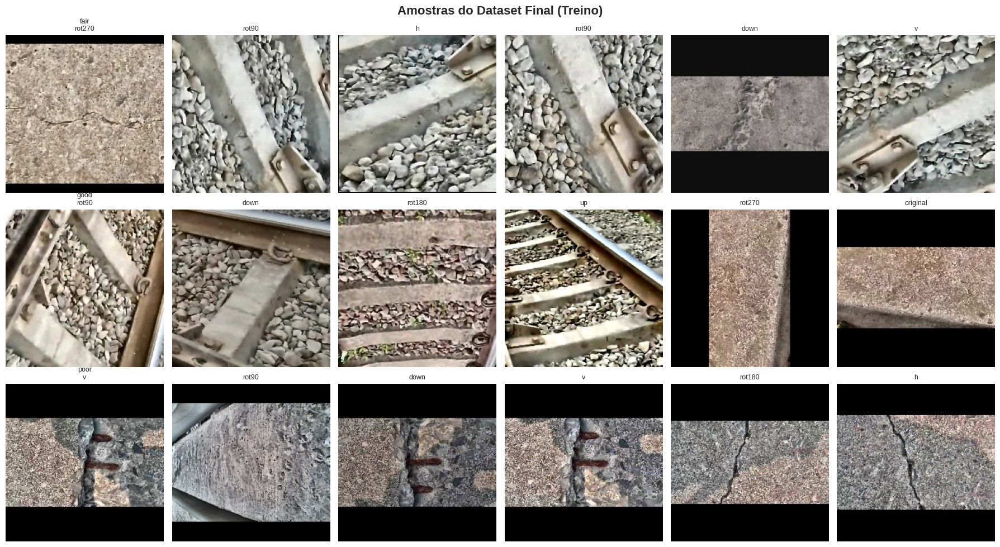

In [ ]:
# Visualizar amostras do dataset final
fig, axes = plt.subplots(3, 6, figsize=(18, 10))
fig.suptitle('Amostras do Dataset Final (Treino)', fontsize=16, fontweight='bold')

for row, cls in enumerate(CLASSES):
    cls_path = os.path.join(OUTPUT_PATH_AUGMENTED, 'train', cls)
    samples = random.sample(info_final['train'][cls], min(6, len(info_final['train'][cls])))

    for col, img_name in enumerate(samples):
        img_path = os.path.join(cls_path, img_name)
        img = Image.open(img_path)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')

        partes = img_name.rsplit('_', 1)
        transform = partes[1].replace('.jpg', '') if len(partes) > 1 else 'original'
        title = f"{cls}" if col == 0 else ""
        axes[row, col].set_title(f"{title}\n{transform}", fontsize=9)

plt.tight_layout()
plt.savefig('/content/amostras_finais.png', dpi=150, bbox_inches='tight')
plt.show()

## 8. Salvar Informações do Dataset

In [ ]:
# Criar resumo completo
dataset_summary = {
    'data_processamento': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
    'tamanho_imagem': f'{IMG_SIZE}x{IMG_SIZE}',
    'classes': CLASSES,
    'preprocessamento': {
        'reducao_ruido': {
            'aplicado': APLICAR_REDUCAO_RUIDO,
            'metodo': 'Filtro Bilateral',
            'forca': FORCA_REDUCAO_RUIDO
        },
        'auto_crop': {
            'aplicado': APLICAR_AUTO_CROP,
            'metodo': 'Detecção de bordas uniformes',
            'margem': MARGEM_CROP,
            'threshold': THRESHOLD_BORDA
        },
        'ajuste_iluminacao': {
            'aplicado': APLICAR_CLAHE,
            'metodo': 'CLAHE (Contrast Limited Adaptive Histogram Equalization)',
            'clip_limit': CLAHE_CLIP_LIMIT,
            'grid_size': CLAHE_GRID_SIZE
        }
    },
    'multiplicacao': {
        'train': MULTIPLICAR_TREINO,
        'val': MULTIPLICAR_VAL,
        'test': MULTIPLICAR_TEST,
        'transformacoes': [
            'original', 'rot90', 'rot180', 'rot270',
            'flip_h', 'flip_v', 'flip_h_rot90', 'flip_v_rot90',
            'brilho_up', 'brilho_down', 'contraste_up', 'contraste_down'
        ],
        'fator': 12
    },
    'dataset_original': {
        'train': {cls: len(dataset_dividido['train'][cls]) for cls in CLASSES},
        'val': {cls: len(dataset_dividido['val'][cls]) for cls in CLASSES},
        'test': {cls: len(dataset_dividido['test'][cls]) for cls in CLASSES}
    },
    'dataset_final': {
        'train': {cls: len(info_final['train'][cls]) for cls in CLASSES},
        'val': {cls: len(info_final['val'][cls]) for cls in CLASSES},
        'test': {cls: len(info_final['test'][cls]) for cls in CLASSES}
    },
    'totais': {
        'train': sum(len(info_final['train'][cls]) for cls in CLASSES),
        'val': sum(len(info_final['val'][cls]) for cls in CLASSES),
        'test': sum(len(info_final['test'][cls]) for cls in CLASSES)
    },
    'caminho_dataset': OUTPUT_PATH_AUGMENTED
}

# Salvar JSON
json_path = os.path.join(OUTPUT_PATH_AUGMENTED, 'dataset_info.json')
with open(json_path, 'w', encoding='utf-8') as f:
    json.dump(dataset_summary, f, indent=2, ensure_ascii=False)

print("📄 Informações salvas em:")
print(f"   {json_path}")
print("\n" + "="*60)
print(json.dumps(dataset_summary, indent=2, ensure_ascii=False))

📄 Informações salvas em:
   /content/Drive/MyDrive/Colab Notebooks/TCC2/dataset_final/dataset_info.json

{
  "data_processamento": "2026-09-11 13:54:10",
  "tamanho_imagem": "224x224",
  "classes": [
    "fair",
    "good",
    "poor"
  ],
  "preprocessamento": {
    "reducao_ruido": {
      "aplicado": true,
      "metodo": "Filtro Bilateral",
      "forca": 7
    },
    "auto_crop": {
      "aplicado": true,
      "metodo": "Detecção de bordas uniformes",
      "margem": 5,
      "threshold": 15
    },
    "ajuste_iluminacao": {
      "aplicado": true,
      "metodo": "CLAHE (Contrast Limited Adaptive Histogram Equalization)",
      "clip_limit": 2.0,
      "grid_size": 8
    }
  },
  "multiplicacao": {
    "train": true,
    "val": false,
    "test": false,
    "transformacoes": [
      "original",
      "rot90",
      "rot180",
      "rot270",
      "flip_h",
      "flip_v",
      "flip_h_rot90",
      "flip_v_rot90",
      "brilho_up",
      "brilho_down",
      "contraste_up",
  

---

## ✅ Resumo das etapas de análise e processamento da base de dados

### Pipeline de Pré-processamento Aplicado:

1. **🔇 Redução de Ruído** (Filtro Bilateral)
   - Suaviza áreas uniformes
   - Preserva bordas importantes (defeitos)

2. **✂️ Eliminação de Bordas** (Auto-Crop Inteligente)
   - Remove bordas escuras/uniformes
   - Foca na região de interesse

3. **💡 Ajuste de Iluminação** (CLAHE)
   - Equalização adaptativa de histograma
   - Melhora contraste local
   - Realça detalhes em áreas escuras/claras

4. **📐 Redimensionamento** (224x224 com padding)

### Multiplicação (Data Augmentation Offline):
- 12 variações por imagem no treino
- Validação e teste mantidos sem multiplicação

### Estrutura Final:
```
dataset_final/
├── train/          (PROCESSADO + MULTIPLICADO 12x)
├── val/            (PROCESSADO, sem multiplicação)
├── test/           (PROCESSADO, sem multiplicação)
└── dataset_info.json
```

## 10. Preparação dos dados - DataSet final

---

In [ ]:
# Criar geradores de dados
# Como já fizemos augmentation, aqui só normalizamos

train_datagen = ImageDataGenerator(
    rescale=1./255,
    # Augmentation leve adicional em tempo real (opcional)
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True
)

# Validação e teste: apenas normalização
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Generators
train_generator = train_datagen.flow_from_directory(
    os.path.join(DATASET_PATH, 'train'),
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

val_generator = val_test_datagen.flow_from_directory(
    os.path.join(DATASET_PATH, 'val'),
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    os.path.join(DATASET_PATH, 'test'),
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

print(f"\n✅ Geradores criados:")
print(f"   • Train: {train_generator.samples} imagens")
print(f"   • Val: {val_generator.samples} imagens")
print(f"   • Test: {test_generator.samples} imagens")
print(f"\n📋 Mapeamento de classes: {train_generator.class_indices}")

Found 4824 images belonging to 3 classes.
Found 132 images belonging to 3 classes.
Found 287 images belonging to 3 classes.

✅ Geradores criados:
   • Train: 4824 imagens
   • Val: 132 imagens
   • Test: 287 imagens

📋 Mapeamento de classes: {'fair': 0, 'good': 1, 'poor': 2}


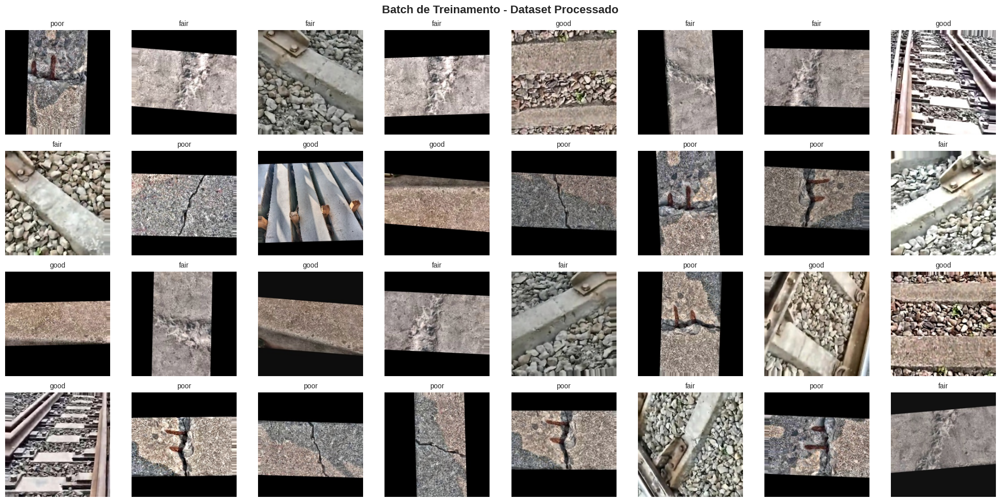

In [ ]:
# Visualizar batch de treino
fig, axes = plt.subplots(4, 8, figsize=(20, 10))
fig.suptitle('Batch de Treinamento - Dataset Processado', fontsize=16, fontweight='bold')

batch_x, batch_y = next(train_generator)

for i in range(min(32, len(batch_x))):
    ax = axes[i // 8, i % 8]
    ax.imshow(batch_x[i])
    class_idx = np.argmax(batch_y[i])
    class_name = list(train_generator.class_indices.keys())[class_idx]
    ax.set_title(f'{class_name}', fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_PATH, 'training_batch_sample.png'), dpi=150, bbox_inches='tight')
plt.show()

## 11. Definição das Arquiteturas dos Modelos

---

In [ ]:
def create_model(base_model_name, input_shape=(224, 224, 3), num_classes=3):
    """
    Cria um modelo com transfer learning.

    Args:
        base_model_name: Nome do modelo base (str)
        input_shape: Formato da entrada (tuple)
        num_classes: Número de classes (int)

    Returns:
        model: Modelo Keras compilado
    """

    # Dicionário de modelos base
    base_models = {
        'MobileNetV2': MobileNetV2,
        'ResNet50': ResNet50,
        'EfficientNetB0': EfficientNetB0,
        'InceptionV3': InceptionV3,
        'DenseNet121': DenseNet121
    }

    if base_model_name not in base_models:
        raise ValueError(f"Modelo {base_model_name} não encontrado!")

    # Carregar modelo base pré-treinado (sem topo)
    base_model = base_models[base_model_name](
        include_top=False,
        weights='imagenet',
        input_shape=input_shape
    )

    # Congelar camadas do modelo base (transfer learning)
    base_model.trainable = False

    # Criar modelo completo
    inputs = keras.Input(shape=input_shape)

    # Pré-processamento específico do modelo (se necessário)
    if base_model_name == 'InceptionV3':
        x = tf.keras.applications.inception_v3.preprocess_input(inputs)
    elif base_model_name == 'ResNet50':
        x = tf.keras.applications.resnet50.preprocess_input(inputs)
    elif base_model_name == 'MobileNetV2':
        x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
    elif base_model_name == 'EfficientNetB0':
        x = tf.keras.applications.efficientnet.preprocess_input(inputs)
    elif base_model_name == 'DenseNet121':
        x = tf.keras.applications.densenet.preprocess_input(inputs)
    else:
        x = inputs

    # Base model
    x = base_model(x, training=False)

    # Cabeçalho de classificação
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs=inputs, outputs=outputs, name=base_model_name)

    return model, base_model

In [ ]:
# Criar todos os modelos
MODEL_NAMES = ['MobileNetV2', 'ResNet50', 'EfficientNetB0', 'InceptionV3', 'DenseNet121']
models_dict = {}
base_models_dict = {}

print("🏗️ Criando modelos...\n")

for model_name in MODEL_NAMES:
    print(f"Criando {model_name}...")
    model, base_model = create_model(
        model_name,
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
        num_classes=NUM_CLASSES
    )
    models_dict[model_name] = model
    base_models_dict[model_name] = base_model

    # Resumo do modelo
    total_params = model.count_params()
    trainable_params = sum([tf.size(w).numpy() for w in model.trainable_weights])
    non_trainable_params = total_params - trainable_params

    print(f"   ✅ Total de parâmetros: {total_params:,}")
    print(f"   🔒 Não treináveis: {non_trainable_params:,}")
    print(f"   🔓 Treináveis: {trainable_params:,}")
    print()

print("✅ Todos os modelos criados com sucesso!")

🏗️ Criando modelos...

Criando MobileNetV2...
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
   ✅ Total de parâmetros: 3,051,075
   🔒 Não treináveis: 2,260,544
   🔓 Treináveis: 790,531

Criando ResNet50...
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
   ✅ Total de parâmetros: 24,777,091
   🔒 Não treináveis: 23,591,808
   🔓 Treináveis: 1,185,283

Criando EfficientNetB0...
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
   ✅ Total de parâmetros: 4,842,662
   🔒 Não treináveis: 4,052,131
   🔓 Treináveis: 790,531

Criando InceptionV3...
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
   ✅ Total de parâmetros: 22,992,163
   🔒 Não treináveis: 21,806,880
   🔓 Treináveis: 1,185,283

Criando DenseNet121...
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
   ✅ Total de parâmetros: 7,698,499
   🔒 Não treináveis: 7,039,552
   🔓 Treináveis: 658,947

✅ Todos os modelos criados com sucesso!


## 12. Funções de Treinamento e Avaliação

---

In [ ]:
def train_model(model, model_name, train_gen, val_gen, test_gen, initial_epochs=30, finetune_epochs=20):
    """
    Treina um modelo em duas fases: transfer learning e fine-tuning.
    CORRIGIDO: Avalia Fase 1 antes de fine-tuning e compara resultados.

    Args:
        model: Modelo Keras
        model_name: Nome do modelo (str)
        train_gen: Gerador de treino
        val_gen: Gerador de validação
        test_gen: Gerador de teste (NOVO!)
        initial_epochs: Épocas para transfer learning
        finetune_epochs: Épocas para fine-tuning

    Returns:
        history: Histórico de treinamento
        model: Modelo treinado
        best_phase: Fase do melhor modelo ('phase1' ou 'phase2')
    """

    print(f"\n{'='*80}")
    print(f"🚀 TREINAMENTO: {model_name}")
    print(f"{'='*80}\n")

    # Criar diretório para o modelo
    model_dir = os.path.join(MODELS_PATH, model_name)
    os.makedirs(model_dir, exist_ok=True)

    # ========================================
    # FASE 1: TRANSFER LEARNING
    # ========================================
    print("\n" + "─"*80)
    print("📚 FASE 1: TRANSFER LEARNING (camadas convolucionais congeladas)")
    print("─"*80 + "\n")

    # Compilar modelo
    model.compile(
        optimizer=optimizers.Adam(learning_rate=LEARNING_RATE_INITIAL),
        loss='categorical_crossentropy',
        metrics=['accuracy', 'precision', 'recall']
    )

    # Caminho específico para Fase 1
    phase1_model_path = os.path.join(model_dir, f'{model_name}_phase1_best.keras') # Changed to .keras

    # Callbacks Fase 1
    callbacks_phase1 = [
        EarlyStopping(
            monitor='val_accuracy',  # Mudado de val_loss para val_accuracy
            patience=10,
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-7,
            verbose=1
        ),
        ModelCheckpoint(
            phase1_model_path,  # Caminho específico
            monitor='val_accuracy',
            save_best_only=True,
            mode='max',
            verbose=1
        )
    ]

    # Treinar Fase 1
    history_phase1 = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=initial_epochs,
        callbacks=callbacks_phase1,
        verbose=1
    )

    print(f"\n✅ Fase 1 concluída! Melhor modelo salvo em: {phase1_model_path}")

    # ========================================
    # AVALIAÇÃO DA FASE 1 NO TESTE
    # ========================================
    print("\n" + "─"*80)
    print("📊 AVALIAÇÃO DA FASE 1 NO CONJUNTO DE TESTE")
    print("─"*80 + "\n")

    # Carregar melhor modelo da Fase 1
    best_model_phase1 = keras.models.load_model(phase1_model_path)

    # Avaliar no teste
    print("Avaliando Fase 1 no teste...")
    test_gen.reset()
    test_results_phase1 = best_model_phase1.evaluate(test_gen, verbose=0)
    test_acc_phase1 = test_results_phase1[1]  # accuracy

    print(f"\n📊 RESULTADOS FASE 1 NO TESTE:")
    print(f"   • Test Accuracy:  {test_acc_phase1*100:.2f}%")
    print(f"   • Test Loss:      {test_results_phase1[0]:.4f}")
    print(f"   • Test Precision: {test_results_phase1[2]:.4f}")
    print(f"   • Test Recall:    {test_results_phase1[3]:.4f}")

    # ========================================
    # DECISÃO: FAZER FINE-TUNING?
    # ========================================
    print("\n" + "─"*80)
    print("🤔 DECIDINDO SE VALE A PENA FAZER FINE-TUNING...")
    print("─"*80 + "\n")

    # Critérios de decisão
    THRESHOLD_EXCELENTE = 0.90
    THRESHOLD_BOM = 0.80

    do_finetune = True  # Padrão: fazer fine-tuning

    if test_acc_phase1 >= THRESHOLD_EXCELENTE:
        print(f"✅ Test accuracy ({test_acc_phase1*100:.2f}%) é EXCELENTE!")
        print("💡 Fase 1 já alcançou resultado muito bom.")
        print("   Fine-tuning pode trazer ganho marginal (1-2%).")
        print("   ⚠️  Mas também há risco de piorar o modelo.")
        print("\n🔄 Tentaremos fine-tuning com muito cuidado...")

    elif test_acc_phase1 >= THRESHOLD_BOM:
        print(f"✅ Test accuracy ({test_acc_phase1*100:.2f}%) é BOM!")
        print("💡 Fine-tuning pode melhorar em 2-4%.")
        print("   Vale a pena tentar.")

    else:
        print(f"⚠️  Test accuracy ({test_acc_phase1*100:.2f}%) está abaixo do esperado.")
        print("💡 Fine-tuning provavelmente não vai resolver o problema.")
        print("   O ideal seria revisar dataset, augmentation ou hiperparâmetros.")
        print("\n❓ Mas vamos tentar fine-tuning mesmo assim...")

    if not do_finetune:
        print("\n✅ USANDO MODELO DA FASE 1 COMO FINAL!")
        # Copiar para nome final
        import shutil
        final_path = os.path.join(model_dir, f'{model_name}_final.keras') # Changed to .keras
        shutil.copy(phase1_model_path, final_path)
        print(f"💾 Modelo final: {final_path}")
        return history_phase1.history, best_model_phase1, 'phase1'

    # ========================================
    # FASE 2: FINE-TUNING
    # ========================================
    print("\n" + "─"*80)
    print("🎯 FASE 2: FINE-TUNING (descongelando últimas camadas)")
    print("─"*80 + "\n")

    # IMPORTANTE: Recarregar melhor modelo da Fase 1
    print("📂 Recarregando melhor modelo da Fase 1...")
    model = keras.models.load_model(phase1_model_path)
    print("✅ Modelo da Fase 1 carregado\n")

    # Descongelar últimas camadas do base_model
    global base_models_dict
    base_model = base_models_dict[model_name]
    base_model.trainable = True

    # MUDANÇA: Descongelar MENOS camadas (10% ao invés de 25%)
    fine_tune_at = int(len(base_model.layers) * 0.90)  # Era 0.75
    for layer in base_model.layers[:fine_tune_at]:
        layer.trainable = False

    trainable_layers = len(base_model.layers) - fine_tune_at
    print(f"📊 Base model tem {len(base_model.layers)} camadas")
    print(f"🔓 Descongelando a partir da camada {fine_tune_at}")
    print(f"🔓 Camadas treináveis: {trainable_layers} ({trainable_layers/len(base_model.layers)*100:.1f}%)\n")

    # MUDANÇA: Learning rate MENOR (1e-5 ao invés de 1e-4)
    lr_finetune = LEARNING_RATE_FINETUNE / 10  # 1e-4 / 10 = 1e-5

    print(f"⚙️  Learning rate fine-tuning: {lr_finetune}")
    print("   (10x menor que Fase 1 para evitar 'catastrophic forgetting')\n")

    # Recompilar com learning rate menor
    model.compile(
        optimizer=optimizers.Adam(learning_rate=lr_finetune),
        loss='categorical_crossentropy',
        metrics=['accuracy', 'precision', 'recall']
    )

    # Caminho específico para Fase 2
    phase2_model_path = os.path.join(model_dir, f'{model_name}_phase2_best.keras') # Changed to .keras

    # Callbacks fase 2
    callbacks_phase2 = [
        EarlyStopping(
            monitor='val_accuracy',  # Mudado de val_loss
            patience=8,
            restore_best_weights=False,  # NÃO restaurar automaticamente
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=4,
            min_lr=1e-8,
            verbose=1
        ),
        ModelCheckpoint(
            phase2_model_path,  # Caminho DIFERENTE da Fase 1
            monitor='val_accuracy',
            save_best_only=True,
            mode='max',
            verbose=1
        )
    ]

    # MUDANÇA: Menos épocas no fine-tuning (15 ao invés de 20)
    finetune_epochs_adjusted = min(finetune_epochs, 15)

    # Continuar treinamento
    print(f"🔄 Iniciando fine-tuning por {finetune_epochs_adjusted} épocas...\n")

    history_phase2 = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=initial_epochs + finetune_epochs_adjusted,
        initial_epoch=len(history_phase1.history['loss']),
        callbacks=callbacks_phase2,
        verbose=1
    )

    print(f"\n✅ Fase 2 concluída! Melhor modelo salvo em: {phase2_model_path}")

    # ========================================
    # COMPARAR FASE 1 vs FASE 2 NO TESTE
    # ========================================
    print("\n" + "─"*80)
    print("📊 COMPARAÇÃO FINAL: FASE 1 vs FASE 2")
    print("─"*80 + "\n")

    # Carregar melhor modelo da Fase 2
    best_model_phase2 = keras.models.load_model(phase2_model_path)

    # Avaliar Fase 2 no teste
    print("Avaliando Fase 2 no teste...")
    test_gen.reset()
    test_results_phase2 = best_model_phase2.evaluate(test_gen, verbose=0)
    test_acc_phase2 = test_results_phase2[1]

    print(f"\n📊 RESULTADOS FASE 2 NO TESTE:")
    print(f"   • Test Accuracy:  {test_acc_phase2*100:.2f}%")
    print(f"   • Test Loss:      {test_results_phase2[0]:.4f}")
    print(f"   • Test Precision: {test_results_phase2[2]:.4f}")
    print(f"   • Test Recall:    {test_results_phase2[3]:.4f}")

    # Comparação lado a lado
    print("\n" + "="*80)
    print("🏆 COMPARAÇÃO DE DESEMPENHO")
    print("="*80)
    print(f"\n{'Métrica':<20} {'Fase 1':<15} {'Fase 2':<15} {'Diferença':<15}")
    print("─"*70)
    print(f"{'Test Accuracy':<20} {test_acc_phase1*100:>6.2f}%        {test_acc_phase2*100:>6.2f}%        {(test_acc_phase2-test_acc_phase1)*100:>+6.2f}%")
    print(f"{'Test Loss':<20} {test_results_phase1[0]:>6.4f}         {test_results_phase2[0]:>6.4f}         {(test_results_phase2[0]-test_results_phase1[0]):>+6.4f}")
    print(f"{'Test Precision':<20} {test_results_phase1[2]:>6.4f}         {test_results_phase2[2]:>6.4f}         {(test_results_phase2[2]-test_results_phase1[2]):>+6.4f}")
    print(f"{'Test Recall':<20} {test_results_phase1[3]:>6.4f}         {test_results_phase2[3]:>6.4f}         {(test_results_phase2[3]-test_results_phase1[3]):>+6.4f}")

    # Decidir qual modelo usar
    print("\n" + "="*80)

    if test_acc_phase2 > test_acc_phase1 + 0.01:  # Melhoria de pelo menos 1%
        melhoria = (test_acc_phase2 - test_acc_phase1) * 100
        print(f"🎉 FASE 2 MELHOROU! (+{melhoria:.2f}%)")
        print(f"✅ MODELO FINAL: Fase 2 - {phase2_model_path}")
        best_model = best_model_phase2
        best_phase = 'phase2'
        best_model_path = phase2_model_path

    elif test_acc_phase1 > test_acc_phase2 + 0.01:  # Piora de mais de 1%
        piora = (test_acc_phase1 - test_acc_phase2) * 100
        print(f"⚠️  FASE 2 PIOROU! (-{piora:.2f}%)")
        print(f"✅ MODELO FINAL: Fase 1 - {phase1_model_path}")
        best_model = best_model_phase1
        best_phase = 'phase1'
        best_model_path = phase1_model_path

    else:  # Diferença menor que 1%
        print("🤝 EMPATE! Diferença menor que 1%")
        print(f"✅ MODELO FINAL: Fase 1 - {phase1_model_path}")
        print("   (Preferindo Fase 1 por ser mais simples)")
        best_model = best_model_phase1
        best_phase = 'phase1'
        best_model_path = phase1_model_path

    # Copiar melhor modelo para nome final
    import shutil
    final_model_path = os.path.join(model_dir, f'{model_name}_final.keras') # Changed to .keras
    shutil.copy(best_model_path, final_model_path)

    print(f"\n💾 Modelo final copiado para: {final_model_path}")
    print(f"📊 Accuracy final no teste: {max(test_acc_phase1, test_acc_phase2)*100:.2f}%")

    print("\n" + "="*80)
    print("✅ TREINAMENTO COMPLETO!")
    print("="*80 + "\n")

    # Combinar históricos
    history_combined = {}
    for key in history_phase1.history.keys():
        history_combined[key] = history_phase1.history[key] + history_phase2.history[key]

    return history_combined, best_model, best_phase

In [ ]:
def evaluate_model(model, model_name, test_gen, best_phase=None):
    """
    Avalia o modelo no conjunto de teste.
    ATUALIZADO: Mostra qual fase foi melhor (se fornecido).

    Args:
        model: Modelo treinado (ou caminho .h5)
        model_name: Nome do modelo
        test_gen: Gerador de teste
        best_phase: 'phase1' ou 'phase2' (opcional)

    Returns:
        results_dict: Dicionário com métricas
    """

    print(f"\n{'='*80}")
    print(f"📊 AVALIAÇÃO NO TESTE: {model_name}")
    if best_phase:
        print(f"   (Usando melhor modelo: {best_phase.upper()})")
    print(f"{'='*80}\n")

    # Se recebeu caminho ao invés de modelo, carregar
    if isinstance(model, str):
        print(f"📂 Carregando modelo de: {model}")
        model = keras.models.load_model(model)
        print("✅ Modelo carregado\n")

    # Predições
    print("🔮 Gerando predições...")
    test_gen.reset()
    predictions = model.predict(test_gen, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    print("✅ Predições geradas\n")

    # Labels verdadeiros
    true_classes = test_gen.classes
    class_labels = list(test_gen.class_indices.keys())

    # Métricas
    accuracy = accuracy_score(true_classes, predicted_classes)
    precision, recall, f1, _ = precision_recall_fscore_support(
        true_classes, predicted_classes, average='weighted'
    )

    # Confusion Matrix
    cm = confusion_matrix(true_classes, predicted_classes)

    # Classification Report
    report = classification_report(
        true_classes,
        predicted_classes,
        target_names=class_labels,
        output_dict=True
    )

    # Exibir métricas gerais
    print(f"📈 MÉTRICAS GERAIS:")
    print(f"   • Accuracy:  {accuracy:.4f} ({accuracy*100:.2f}%)")
    print(f"   • Precision: {precision:.4f} ({precision*100:.2f}%)")
    print(f"   • Recall:    {recall:.4f} ({recall*100:.2f}%)")
    print(f"   • F1-Score:  {f1:.4f}")

    # Exibir métricas por classe com contagem de acertos
    print(f"\n📋 MÉTRICAS POR CLASSE:\n")
    for i, cls in enumerate(class_labels):
        total = int(report[cls]['support'])
        corretos = int(cm[i, i])
        acc_classe = (corretos / total * 100) if total > 0 else 0

        print(f"   {cls.upper()}:")
        print(f"      Acertos:   {corretos}/{total} ({acc_classe:.2f}%)")
        print(f"      Precision: {report[cls]['precision']:.4f}")
        print(f"      Recall:    {report[cls]['recall']:.4f}")
        print(f"      F1-Score:  {report[cls]['f1-score']:.4f}")

    # Plotar Confusion Matrix
    print(f"\n📊 Gerando Confusion Matrix...")

    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_labels,
        yticklabels=class_labels,
        cbar_kws={'label': 'Contagem'}
    )

    title = f'Confusion Matrix - {model_name}\nTest Accuracy: {accuracy*100:.2f}%'
    if best_phase:
        title += f' (Melhor: {best_phase.upper()})'

    plt.title(title, fontsize=14, fontweight='bold')
    plt.ylabel('Classe Verdadeira', fontsize=12)
    plt.xlabel('Classe Predita', fontsize=12)
    plt.tight_layout()

    save_path = os.path.join(RESULTS_PATH, f'{model_name}_confusion_matrix.png')
    plt.savefig(save_path, dpi=150)
    print(f"✅ Confusion Matrix salva em: {save_path}")
    plt.show()

    # Retornar resultados
    results_dict = {
        'model_name': model_name,
        'accuracy': float(accuracy),
        'precision': float(precision),
        'recall': float(recall),
        'f1_score': float(f1),
        'confusion_matrix': cm.tolist(),
        'classification_report': report
    }

    if best_phase:
        results_dict['best_phase'] = best_phase

    print(f"\n{'='*80}")
    print("✅ AVALIAÇÃO CONCLUÍDA!")
    print(f"{'='*80}\n")

    return results_dict

In [ ]:
def plot_training_history(history, model_name, best_phase=None):
    """
    Plota histórico de treinamento.
    ATUALIZADO: Marca divisão entre Fase 1 e Fase 2.

    Args:
        history: Histórico de treinamento (dict ou History object)
        model_name: Nome do modelo
        best_phase: 'phase1' ou 'phase2' (opcional)
    """

    # Se recebeu History object, extrair dict
    if hasattr(history, 'history'):
        history = history.history

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    title = f'Histórico de Treinamento - {model_name}'
    if best_phase:
        title += f' (Melhor: {best_phase.upper()})'

    fig.suptitle(title, fontsize=18, fontweight='bold')

    # Determinar onde está a divisão entre Fase 1 e Fase 2
    # Assumindo que Fase 1 tem ~30 épocas
    total_epochs = len(history['accuracy'])
    phase1_epochs = 30  # Ajuste conforme necessário

    has_phase2 = total_epochs > phase1_epochs

    # ========================================
    # ACCURACY
    # ========================================
    axes[0, 0].plot(history['accuracy'], label='Train', linewidth=2, alpha=0.8)
    axes[0, 0].plot(history['val_accuracy'], label='Validation', linewidth=2, alpha=0.8)
    axes[0, 0].set_ylim(0, 1.00)

    if has_phase2:
        # Linha vertical marcando início do fine-tuning
        axes[0, 0].axvline(
            x=phase1_epochs,
            color='red',
            linestyle='--',
            linewidth=1.5,
            alpha=0.7,
            label='Início Fine-tuning'
        )

        # Destacar qual fase foi melhor
        if best_phase == 'phase1':
            axes[0, 0].axvspan(0, phase1_epochs, alpha=0.1, color='green', label='Fase Vencedora')
        elif best_phase == 'phase2':
            axes[0, 0].axvspan(phase1_epochs, total_epochs, alpha=0.1, color='green', label='Fase Vencedora')

    axes[0, 0].set_title('Accuracy', fontsize=18, fontweight='bold')
    axes[0, 0].set_xlabel('Época', fontsize=18, fontweight='bold')
    axes[0, 0].set_ylabel('Accuracy',fontsize=18, fontweight='bold')
    axes[0, 0].legend(loc='best',fontsize=18)
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].tick_params(axis='both', labelsize=14)

    # ========================================
    # LOSS
    # ========================================
    axes[0, 1].plot(history['loss'], label='Train', linewidth=2, alpha=0.8)
    axes[0, 1].plot(history['val_loss'], label='Validation', linewidth=2, alpha=0.8)
    axes[0, 1].set_ylim(0, 1.00)

    if has_phase2:
        axes[0, 1].axvline(
            x=phase1_epochs,
            color='red',
            linestyle='--',
            linewidth=1.5,
            alpha=0.7,
            label='Início Fine-tuning'
        )

        if best_phase == 'phase1':
            axes[0, 1].axvspan(0, phase1_epochs, alpha=0.1, color='green', label='Fase Vencedora')
        elif best_phase == 'phase2':
            axes[0, 1].axvspan(phase1_epochs, total_epochs, alpha=0.1, color='green', label='Fase Vencedora')

    axes[0, 1].set_title('Loss', fontsize=18, fontweight='bold')
    axes[0, 1].set_xlabel('Época',fontsize=18, fontweight='bold')
    axes[0, 1].set_ylabel('Loss',fontsize=18, fontweight='bold')
    axes[0, 1].legend(loc='best',fontsize=18)
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].tick_params(axis='both', labelsize=14)

    # ========================================
    # PRECISION
    # ========================================
    axes[1, 0].plot(history['precision'], label='Train', linewidth=2, alpha=0.8)
    axes[1, 0].plot(history['val_precision'], label='Validation', linewidth=2, alpha=0.8)
    axes[1, 0].set_ylim(0, 1.00)

    if has_phase2:
        axes[1, 0].axvline(
            x=phase1_epochs,
            color='red',
            linestyle='--',
            linewidth=1.5,
            alpha=0.7,
            label='Início Fine-tuning'
        )

        if best_phase == 'phase1':
            axes[1, 0].axvspan(0, phase1_epochs, alpha=0.1, color='green', label='Fase Vencedora')
        elif best_phase == 'phase2':
            axes[1, 0].axvspan(phase1_epochs, total_epochs, alpha=0.1, color='green', label='Fase Vencedora')

    axes[1, 0].set_title('Precision', fontsize=18, fontweight='bold')
    axes[1, 0].set_xlabel('Época',fontsize=18, fontweight='bold')
    axes[1, 0].set_ylabel('Precision',fontsize=18, fontweight='bold')
    axes[1, 0].legend(loc='best',fontsize=18)
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].tick_params(axis='both', labelsize=14)

    # ========================================
    # RECALL
    # ========================================
    axes[1, 1].plot(history['recall'], label='Train', linewidth=2, alpha=0.8)
    axes[1, 1].plot(history['val_recall'], label='Validation', linewidth=2, alpha=0.8)
    axes[1, 1].set_ylim(0, 1.00)

    if has_phase2:
        axes[1, 1].axvline(
            x=phase1_epochs,
            color='red',
            linestyle='--',
            linewidth=1.5,
            alpha=0.7,
            label='Início Fine-tuning'
        )

        if best_phase == 'phase1':
            axes[1, 1].axvspan(0, phase1_epochs, alpha=0.1, color='green', label='Fase Vencedora')
        elif best_phase == 'phase2':
            axes[1, 1].axvspan(phase1_epochs, total_epochs, alpha=0.1, color='green', label='Fase Vencedora')

    axes[1, 1].set_title('Recall', fontsize=18, fontweight='bold')
    axes[1, 1].set_xlabel('Época',fontsize=18, fontweight='bold')
    axes[1, 1].set_ylabel('Recall',fontsize=18, fontweight='bold')
    axes[1, 1].legend(loc='best',fontsize=18)
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].tick_params(axis='both', labelsize=14)

    plt.tight_layout()

    save_path = os.path.join(RESULTS_PATH, f'{model_name}_training_history.png')
    plt.savefig(save_path, dpi=150)
    print(f"💾 Histórico de treinamento salvo em: {save_path}")
    plt.show()

## 13. Treinamento dos 5 Modelos

---

In [ ]:
# Dicionário para armazenar resultados
all_histories = {}
all_results = {}

print("\n" + "="*80)
print("🚀 INICIANDO TREINAMENTO DE TODOS OS MODELOS")
print("="*80)
print(f"\n⏰ Início: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print(f"\n📋 Modelos a treinar: {', '.join(MODEL_NAMES)}\n")


🚀 INICIANDO TREINAMENTO DE TODOS OS MODELOS

⏰ Início: 2026-06-21 21:07:56

📋 Modelos a treinar: MobileNetV2, ResNet50, EfficientNetB0, InceptionV3, DenseNet121



### 13.1 MobileNetV2 (Eficiência)


🚀 TREINAMENTO: MobileNetV2


────────────────────────────────────────────────────────────────────────────────
📚 FASE 1: TRANSFER LEARNING (camadas convolucionais congeladas)
────────────────────────────────────────────────────────────────────────────────

Epoch 1/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 594ms/step - accuracy: 0.9796 - loss: 0.0631 - precision: 0.9805 - recall: 0.9793
Epoch 1: val_accuracy improved from None to 0.95455, saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/MobileNetV2/MobileNetV2_phase1_best.keras

Epoch 1: finished saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/MobileNetV2/MobileNetV2_phase1_best.keras
151/151 ━━━━━━━━━━━━━━━━━━━━ 114s 672ms/step - accuracy: 0.9751 - loss: 0.0813 - precision: 0.9765 - recall: 0.9747 - val_accuracy: 0.9545 - val_loss: 0.2195 - val_precision: 0.9545 - val_recall: 0.9545 - learning_rate: 0.0010
Epoch 2/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 560ms/step - accuracy: 0.9693 - loss: 0.1104 - precision: 

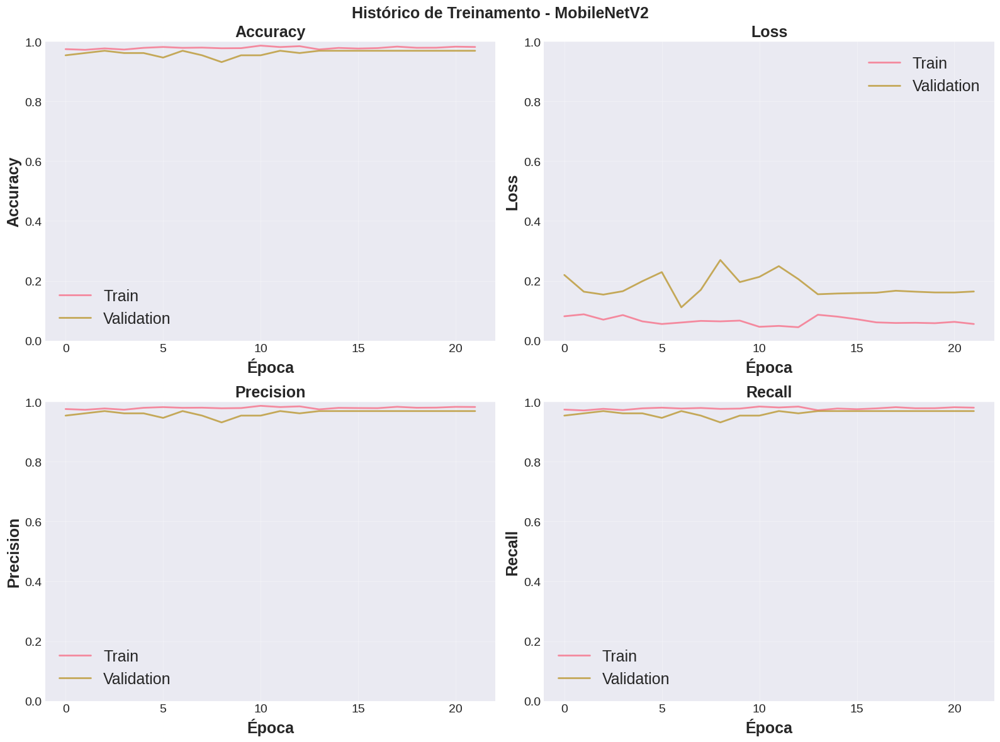


📊 AVALIAÇÃO NO TESTE: MobileNetV2

🔮 Gerando predições...
✅ Predições geradas

📈 MÉTRICAS GERAIS:
   • Accuracy:  0.9721 (97.21%)
   • Precision: 0.9727 (97.27%)
   • Recall:    0.9721 (97.21%)
   • F1-Score:  0.9721

📋 MÉTRICAS POR CLASSE:

   FAIR:
      Acertos:   84/86 (97.67%)
      Precision: 0.9333
      Recall:    0.9767
      F1-Score:  0.9545
   GOOD:
      Acertos:   87/93 (93.55%)
      Precision: 0.9775
      Recall:    0.9355
      F1-Score:  0.9560
   POOR:
      Acertos:   108/108 (100.00%)
      Precision: 1.0000
      Recall:    1.0000
      F1-Score:  1.0000

📊 Gerando Confusion Matrix...
✅ Confusion Matrix salva em: /content/Drive/MyDrive/Colab Notebooks/TCC2/results/MobileNetV2_confusion_matrix.png


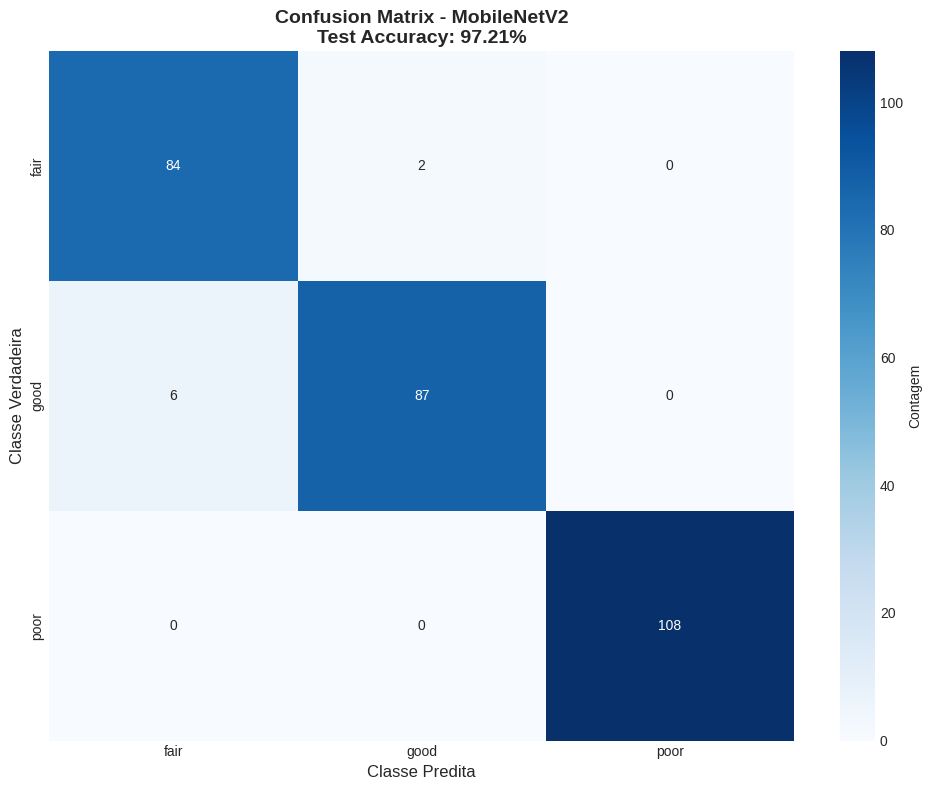


✅ AVALIAÇÃO CONCLUÍDA!


🚀 Tempo de processamento

⏰ Tempo total: 1873.03 segundos


In [ ]:
# Treinar MobileNetV2
start_time = time.time()
model_name = 'MobileNetV2'


history, trained_model, best_phase = train_model(  # ← Falta best_phase!
    models_dict[model_name],
    model_name,
    train_generator,
    val_generator,
    test_gen=test_generator,
    initial_epochs=INITIAL_EPOCHS,
    finetune_epochs=FINETUNE_EPOCHS
)

all_histories[model_name] = history
models_dict[model_name] = trained_model

# Plotar histórico
plot_training_history(history, model_name)

# Avaliar no teste
results = evaluate_model(trained_model, model_name, test_generator)
all_results[model_name] = results
evaluation_time = time.time() - start_time

print("\n" + "="*80)
print("🚀 Tempo de processamento")
print("="*80)
print(f"\n⏰ Tempo total: {evaluation_time:.2f} segundos")

# Limpar memória
tf.keras.backend.clear_session()

### 13.2 ResNet50 (Arquitetura Clássica)


🚀 TREINAMENTO: ResNet50


────────────────────────────────────────────────────────────────────────────────
📚 FASE 1: TRANSFER LEARNING (camadas convolucionais congeladas)
────────────────────────────────────────────────────────────────────────────────

Epoch 1/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 554ms/step - accuracy: 0.9620 - loss: 0.1262 - precision: 0.9628 - recall: 0.9612
Epoch 1: val_accuracy improved from None to 0.96970, saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/ResNet50/ResNet50_phase1_best.keras

Epoch 1: finished saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/ResNet50/ResNet50_phase1_best.keras
151/151 ━━━━━━━━━━━━━━━━━━━━ 110s 622ms/step - accuracy: 0.9633 - loss: 0.1119 - precision: 0.9649 - recall: 0.9619 - val_accuracy: 0.9697 - val_loss: 0.1392 - val_precision: 0.9695 - val_recall: 0.9621 - learning_rate: 0.0010
Epoch 2/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 562ms/step - accuracy: 0.9598 - loss: 0.1202 - precision: 0.9616 - recall

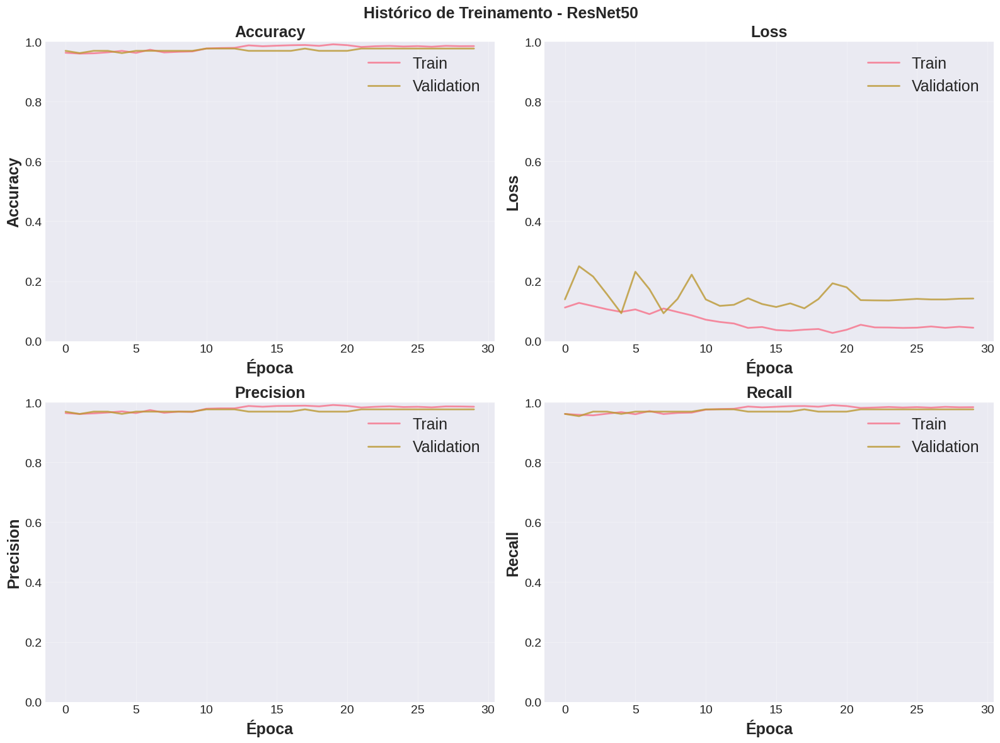


📊 AVALIAÇÃO NO TESTE: ResNet50

🔮 Gerando predições...
✅ Predições geradas

📈 MÉTRICAS GERAIS:
   • Accuracy:  0.9686 (96.86%)
   • Precision: 0.9688 (96.88%)
   • Recall:    0.9686 (96.86%)
   • F1-Score:  0.9687

📋 MÉTRICAS POR CLASSE:

   FAIR:
      Acertos:   83/86 (96.51%)
      Precision: 0.9540
      Recall:    0.9651
      F1-Score:  0.9595
   GOOD:
      Acertos:   89/93 (95.70%)
      Precision: 0.9570
      Recall:    0.9570
      F1-Score:  0.9570
   POOR:
      Acertos:   106/108 (98.15%)
      Precision: 0.9907
      Recall:    0.9815
      F1-Score:  0.9860

📊 Gerando Confusion Matrix...
✅ Confusion Matrix salva em: /content/Drive/MyDrive/Colab Notebooks/TCC2/results/ResNet50_confusion_matrix.png


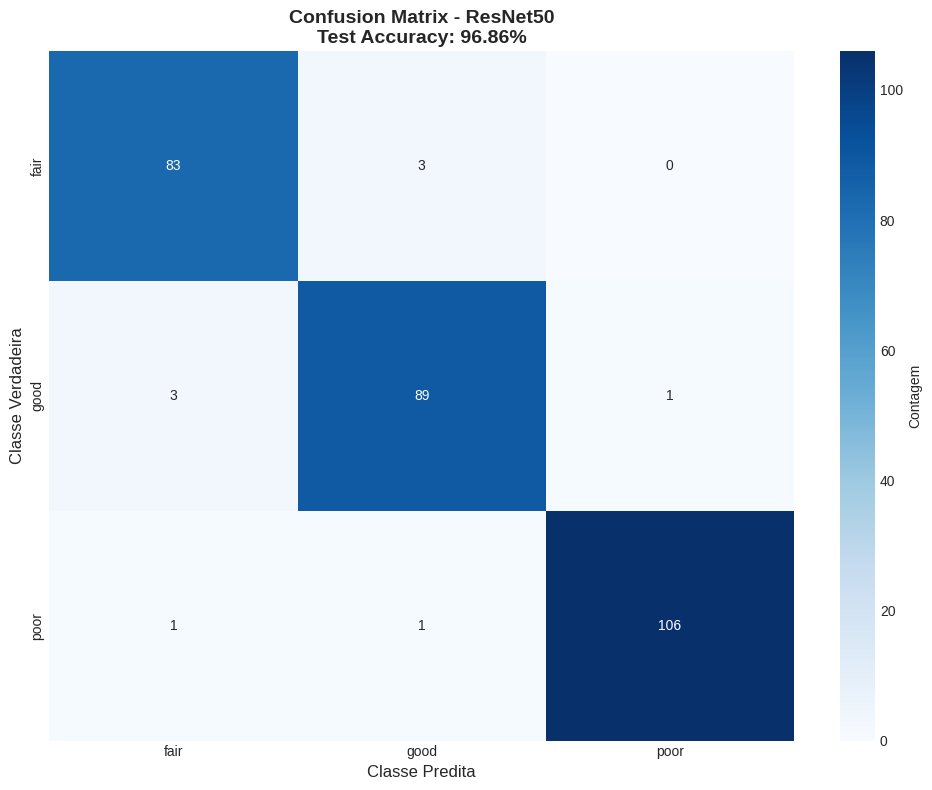


✅ AVALIAÇÃO CONCLUÍDA!


🚀 Tempo de processamento

⏰ Tempo total: 2470.32 segundos


In [ ]:
# Treinar ResNet50
start_time = time.time()
model_name = 'ResNet50'
history, trained_model, best_phase = train_model(  # ← Falta best_phase!
    models_dict[model_name],
    model_name,
    train_generator,
    val_generator,
    test_gen=test_generator,
    initial_epochs=INITIAL_EPOCHS,
    finetune_epochs=FINETUNE_EPOCHS
)

all_histories[model_name] = history
models_dict[model_name] = trained_model

# Plotar histórico
plot_training_history(history, model_name)

# Avaliar no teste
results = evaluate_model(trained_model, model_name, test_generator)
all_results[model_name] = results

evaluation_time = time.time() - start_time

print("\n" + "="*80)
print("🚀 Tempo de processamento")
print("="*80)
print(f"\n⏰ Tempo total: {evaluation_time:.2f} segundos")

# Limpar memória
tf.keras.backend.clear_session()

### 13.3 EfficientNetB0 (Balanceamento Otimizado)


🚀 TREINAMENTO: EfficientNetB0


────────────────────────────────────────────────────────────────────────────────
📚 FASE 1: TRANSFER LEARNING (camadas convolucionais congeladas)
────────────────────────────────────────────────────────────────────────────────

Epoch 1/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 590ms/step - accuracy: 0.5174 - loss: 0.9782 - precision: 0.5776 - recall: 0.3142
Epoch 1: val_accuracy improved from None to 0.68939, saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/EfficientNetB0/EfficientNetB0_phase1_best.keras

Epoch 1: finished saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/EfficientNetB0/EfficientNetB0_phase1_best.keras
151/151 ━━━━━━━━━━━━━━━━━━━━ 132s 691ms/step - accuracy: 0.5060 - loss: 0.9940 - precision: 0.5577 - recall: 0.2825 - val_accuracy: 0.6894 - val_loss: 0.8853 - val_precision: 0.8571 - val_recall: 0.2273 - learning_rate: 0.0010
Epoch 2/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 503ms/step - accuracy: 0.4968 - loss: 0.991

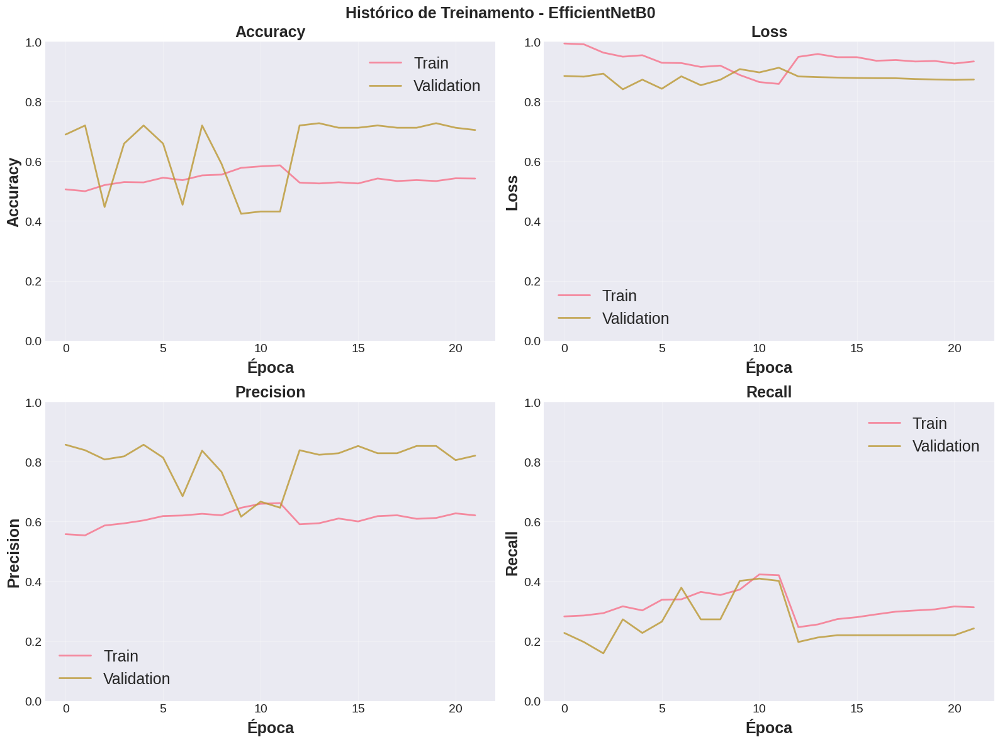


📊 AVALIAÇÃO NO TESTE: EfficientNetB0

🔮 Gerando predições...
✅ Predições geradas

📈 MÉTRICAS GERAIS:
   • Accuracy:  0.7422 (74.22%)
   • Precision: 0.7676 (76.76%)
   • Recall:    0.7422 (74.22%)
   • F1-Score:  0.7278

📋 MÉTRICAS POR CLASSE:

   FAIR:
      Acertos:   35/86 (40.70%)
      Precision: 0.8140
      Recall:    0.4070
      F1-Score:  0.5426
   GOOD:
      Acertos:   79/93 (84.95%)
      Precision: 0.6077
      Recall:    0.8495
      F1-Score:  0.7085
   POOR:
      Acertos:   99/108 (91.67%)
      Precision: 0.8684
      Recall:    0.9167
      F1-Score:  0.8919

📊 Gerando Confusion Matrix...
✅ Confusion Matrix salva em: /content/Drive/MyDrive/Colab Notebooks/TCC2/results/EfficientNetB0_confusion_matrix.png


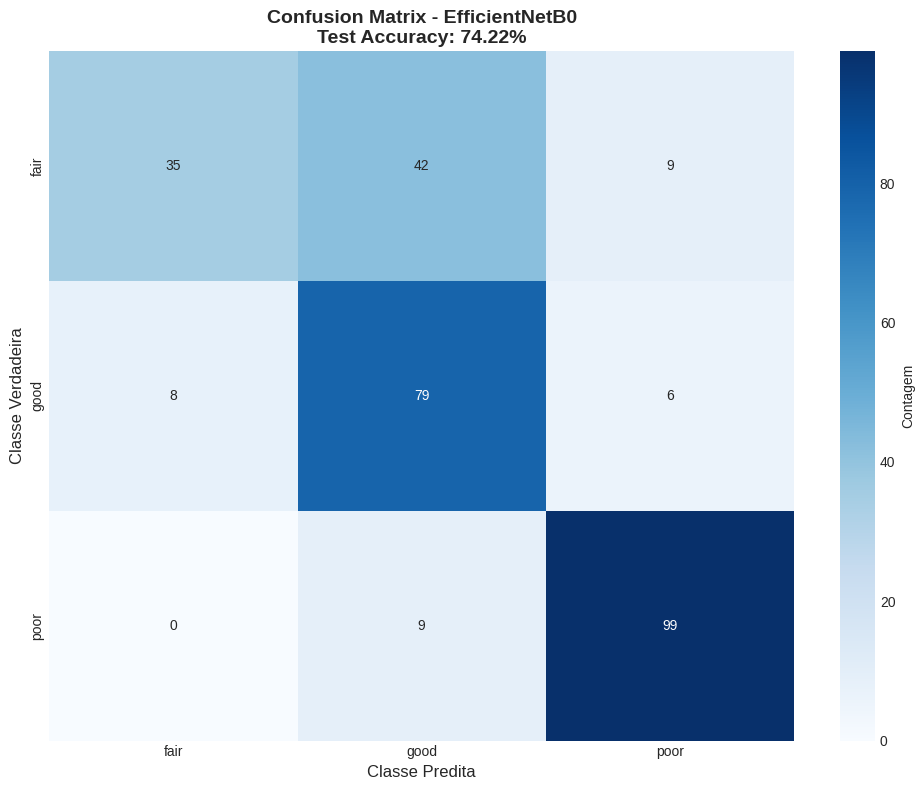


✅ AVALIAÇÃO CONCLUÍDA!


🚀 Tempo de processamento

⏰ Tempo total: 1998.44 segundos


In [ ]:
# Treinar EfficientNetB0
start_time = time.time()
model_name = 'EfficientNetB0'
history, trained_model, best_phase = train_model(  # ← Falta best_phase!
    models_dict[model_name],
    model_name,
    train_generator,
    val_generator,
    test_gen=test_generator,
    initial_epochs=INITIAL_EPOCHS,
    finetune_epochs=FINETUNE_EPOCHS
)

all_histories[model_name] = history
models_dict[model_name] = trained_model

# Plotar histórico
plot_training_history(history, model_name)

# Avaliar no teste
results = evaluate_model(trained_model, model_name, test_generator)
all_results[model_name] = results

evaluation_time = time.time() - start_time

print("\n" + "="*80)
print("🚀 Tempo de processamento")
print("="*80)
print(f"\n⏰ Tempo total: {evaluation_time:.2f} segundos")

# Limpar memória
tf.keras.backend.clear_session()

### 13.4 InceptionV3 (Multi-escala)


🚀 TREINAMENTO: InceptionV3


────────────────────────────────────────────────────────────────────────────────
📚 FASE 1: TRANSFER LEARNING (camadas convolucionais congeladas)
────────────────────────────────────────────────────────────────────────────────

Epoch 1/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - accuracy: 0.7206 - loss: 0.8429 - precision: 0.7331 - recall: 0.7059
Epoch 1: val_accuracy improved from None to 0.87121, saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/InceptionV3/InceptionV3_phase1_best.keras

Epoch 1: finished saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/InceptionV3/InceptionV3_phase1_best.keras
151/151 ━━━━━━━━━━━━━━━━━━━━ 140s 783ms/step - accuracy: 0.7966 - loss: 0.6135 - precision: 0.8070 - recall: 0.7863 - val_accuracy: 0.8712 - val_loss: 0.4509 - val_precision: 0.9417 - val_recall: 0.7348 - learning_rate: 0.0010
Epoch 2/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 551ms/step - accuracy: 0.8538 - loss: 0.4199 - precision: 

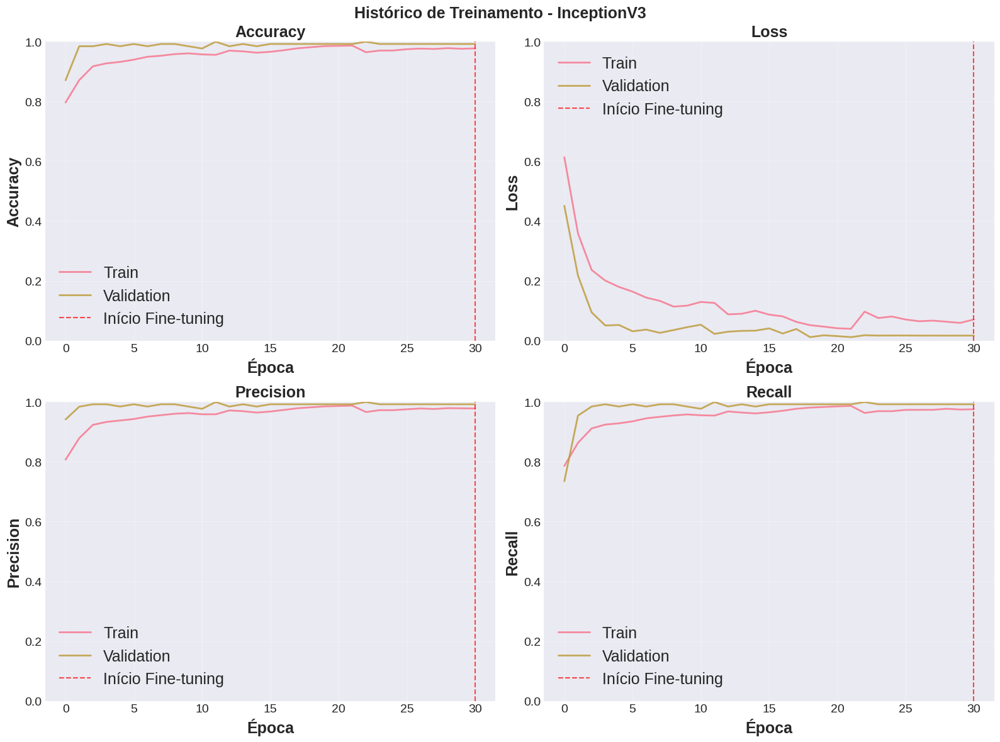


📊 AVALIAÇÃO NO TESTE: InceptionV3

🔮 Gerando predições...
✅ Predições geradas

📈 MÉTRICAS GERAIS:
   • Accuracy:  0.9756 (97.56%)
   • Precision: 0.9758 (97.58%)
   • Recall:    0.9756 (97.56%)
   • F1-Score:  0.9757

📋 MÉTRICAS POR CLASSE:

   FAIR:
      Acertos:   84/86 (97.67%)
      Precision: 0.9545
      Recall:    0.9767
      F1-Score:  0.9655
   GOOD:
      Acertos:   90/93 (96.77%)
      Precision: 0.9890
      Recall:    0.9677
      F1-Score:  0.9783
   POOR:
      Acertos:   106/108 (98.15%)
      Precision: 0.9815
      Recall:    0.9815
      F1-Score:  0.9815

📊 Gerando Confusion Matrix...
✅ Confusion Matrix salva em: /content/Drive/MyDrive/Colab Notebooks/TCC2/results/InceptionV3_confusion_matrix.png


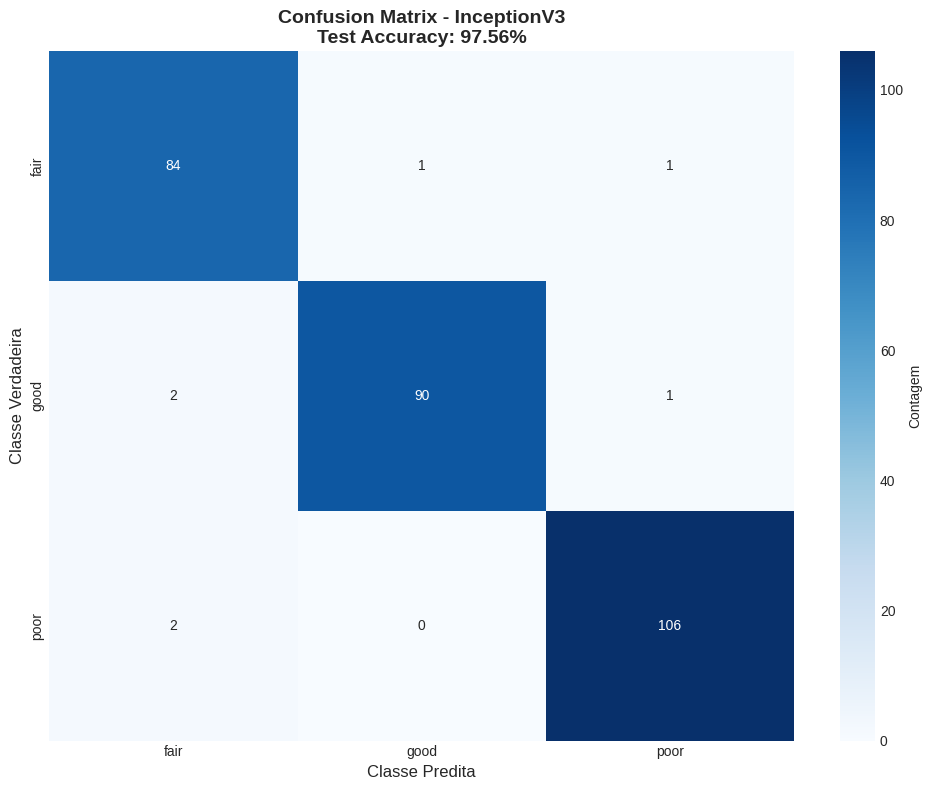


✅ AVALIAÇÃO CONCLUÍDA!


🚀 Tempo de processamento

⏰ Tempo total: 2758.58 segundos


In [ ]:
# Treinar InceptionV3
start_time = time.time()
model_name = 'InceptionV3'
history, trained_model, best_phase = train_model(  # ← Falta best_phase!
    models_dict[model_name],
    model_name,
    train_generator,
    val_generator,
    test_gen=test_generator,
    initial_epochs=INITIAL_EPOCHS,
    finetune_epochs=FINETUNE_EPOCHS
)

all_histories[model_name] = history
models_dict[model_name] = trained_model

# Plotar histórico
plot_training_history(history, model_name)

# Avaliar no teste
results = evaluate_model(trained_model, model_name, test_generator)
all_results[model_name] = results

evaluation_time = time.time() - start_time

print("\n" + "="*80)
print("🚀 Tempo de processamento")
print("="*80)
print(f"\n⏰ Tempo total: {evaluation_time:.2f} segundos")

# Limpar memória
tf.keras.backend.clear_session()

### 13.5 DenseNet121 (Reuso de Features)


🚀 TREINAMENTO: DenseNet121


────────────────────────────────────────────────────────────────────────────────
📚 FASE 1: TRANSFER LEARNING (camadas convolucionais congeladas)
────────────────────────────────────────────────────────────────────────────────

Epoch 1/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 637ms/step - accuracy: 0.7509 - loss: 0.5702 - precision: 0.7837 - recall: 0.7156
Epoch 1: val_accuracy improved from None to 0.71970, saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/DenseNet121/DenseNet121_phase1_best.keras

Epoch 1: finished saving model to /content/Drive/MyDrive/Colab Notebooks/TCC2/models/DenseNet121/DenseNet121_phase1_best.keras
151/151 ━━━━━━━━━━━━━━━━━━━━ 176s 969ms/step - accuracy: 0.8317 - loss: 0.4170 - precision: 0.8507 - recall: 0.8126 - val_accuracy: 0.7197 - val_loss: 0.7140 - val_precision: 0.7946 - val_recall: 0.6742 - learning_rate: 0.0010
Epoch 2/30
151/151 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.9190 - loss: 0.2273 - precision: 

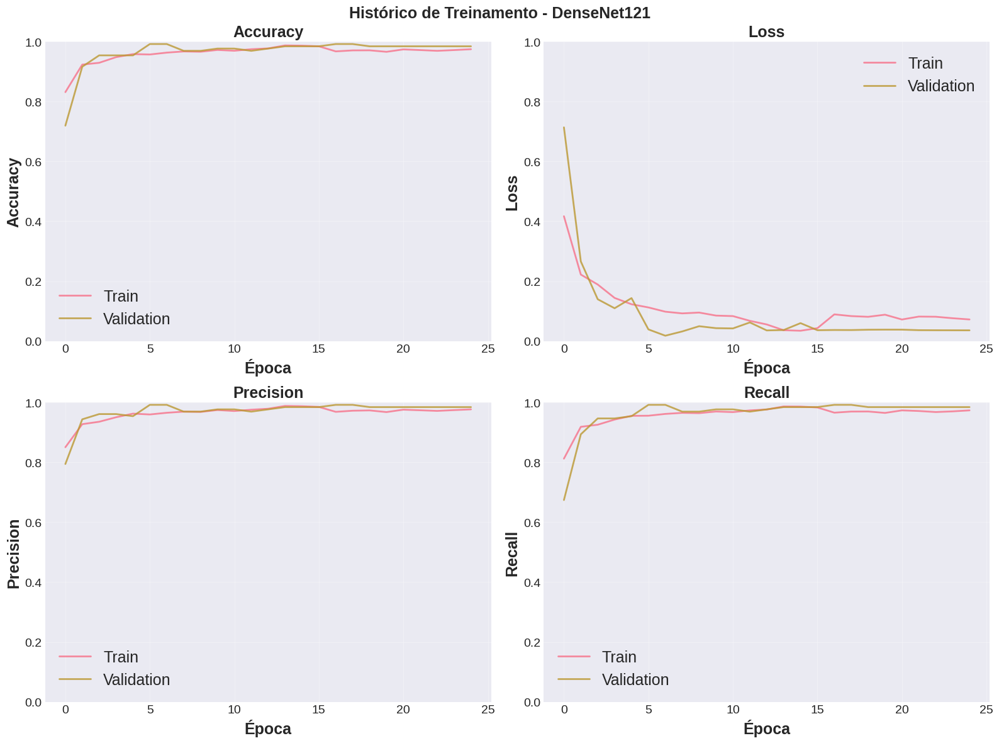


📊 AVALIAÇÃO NO TESTE: DenseNet121

🔮 Gerando predições...
✅ Predições geradas

📈 MÉTRICAS GERAIS:
   • Accuracy:  0.9408 (94.08%)
   • Precision: 0.9458 (94.58%)
   • Recall:    0.9408 (94.08%)
   • F1-Score:  0.9404

📋 MÉTRICAS POR CLASSE:

   FAIR:
      Acertos:   85/86 (98.84%)
      Precision: 0.8673
      Recall:    0.9884
      F1-Score:  0.9239
   GOOD:
      Acertos:   79/93 (84.95%)
      Precision: 0.9875
      Recall:    0.8495
      F1-Score:  0.9133
   POOR:
      Acertos:   106/108 (98.15%)
      Precision: 0.9725
      Recall:    0.9815
      F1-Score:  0.9770

📊 Gerando Confusion Matrix...
✅ Confusion Matrix salva em: /content/Drive/MyDrive/Colab Notebooks/TCC2/results/DenseNet121_confusion_matrix.png


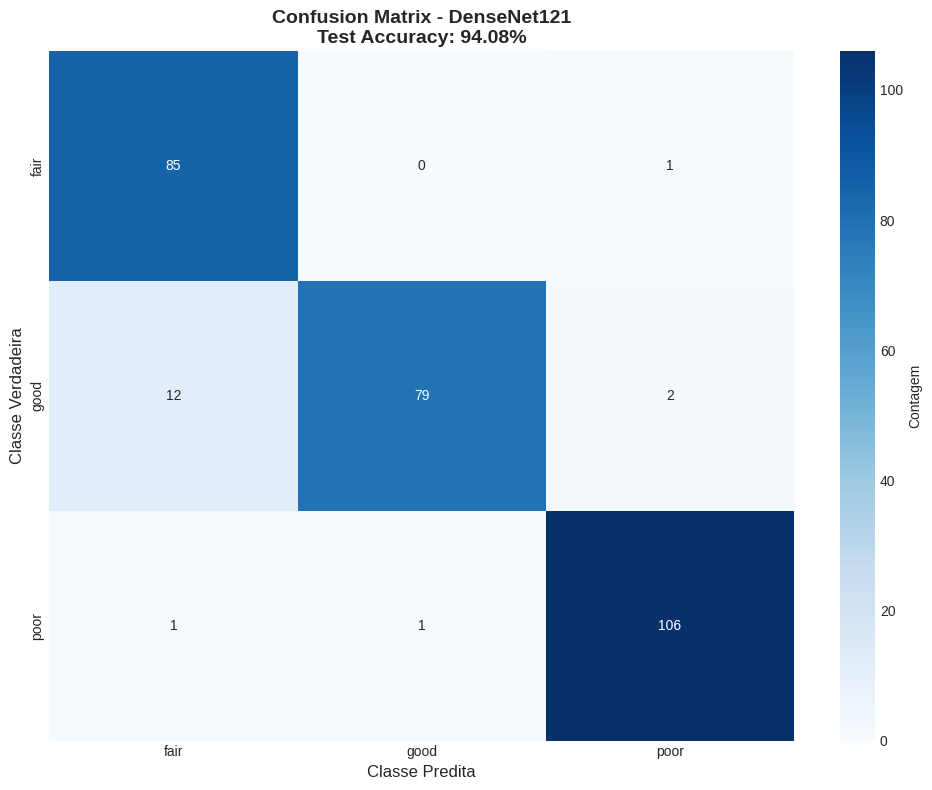


✅ AVALIAÇÃO CONCLUÍDA!


🚀 Tempo de processamento

⏰ Tempo total: 2393.24 segundos

⏰ Término: 2026-05-21 19:10:23

✅ TREINAMENTO DE TODOS OS MODELOS CONCLUÍDO!


In [ ]:
# Treinar DenseNet121
start_time = time.time()
model_name = 'DenseNet121'
history, trained_model, best_phase = train_model(  # ← Falta best_phase!
    models_dict[model_name],
    model_name,
    train_generator,
    val_generator,
    test_gen=test_generator,
    initial_epochs=INITIAL_EPOCHS,
    finetune_epochs=FINETUNE_EPOCHS
)

all_histories[model_name] = history
models_dict[model_name] = trained_model

# Plotar histórico
plot_training_history(history, model_name)

# Avaliar no teste
results = evaluate_model(trained_model, model_name, test_generator)
all_results[model_name] = results

evaluation_time = time.time() - start_time

print("\n" + "="*80)
print("🚀 Tempo de processamento")
print("="*80)
print(f"\n⏰ Tempo total: {evaluation_time:.2f} segundos")

# Limpar memória
tf.keras.backend.clear_session()

print(f"\n⏰ Término: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("\n✅ TREINAMENTO DE TODOS OS MODELOS CONCLUÍDO!")

# 14. Treinamento com modelos clássicos

## Preparando os dados para os modelos clássicos

In [ ]:
# ============================================================================
# FUNÇÃO PARA EXTRAIR TODOS OS DADOS DOS GENERATORS
# ============================================================================

def get_all_data_from_generator(generator):
    """
    Extrai todas as imagens e labels de um ImageDataGenerator.
    """

    all_images = []
    all_labels = []

    for i in tqdm(range(len(generator)), desc="Extraindo dados"):

        batch_images, batch_labels = generator[i]

        all_images.append(batch_images)
        all_labels.append(batch_labels)

    # Concatenar batches
    return np.vstack(all_images), np.vstack(all_labels)


# ============================================================================
# EXTRAIR IMAGENS E LABELS
# ============================================================================

print("\n🔄 Extraindo dados do train_generator...")
X_train, y_train = get_all_data_from_generator(train_generator)

print("\n🔄 Extraindo dados do val_generator...")
X_val, y_val = get_all_data_from_generator(val_generator)

print("\n🔄 Extraindo dados do test_generator...")
X_test, y_test = get_all_data_from_generator(test_generator)

print(f"\n✅ X_train shape: {X_train.shape}")
print(f"✅ X_val shape: {X_val.shape}")
print(f"✅ X_test shape: {X_test.shape}")


# ============================================================================
# FUNÇÃO DE EXTRAÇÃO CLÁSSICA DE FEATURES (HOG)
# ============================================================================

def extract_hog_features(images):

    """
    Extrai features clássicas usando HOG
    (Histogram of Oriented Gradients)
    """

    features_list = []

    for img in tqdm(images, desc="Extraindo HOG"):

        # Converter RGB para grayscale
        gray = rgb2gray(img)

        # Extrair HOG
        hog_features = hog(
            gray,
            orientations=9,
            pixels_per_cell=(16, 16),
            cells_per_block=(2, 2),
            block_norm='L2-Hys',
            visualize=False
        )

        features_list.append(hog_features)

    return np.array(features_list)


# ============================================================================
# EXTRAÇÃO DE FEATURES CLÁSSICAS
# ============================================================================

print("\n🔄 Extraindo HOG - TREINAMENTO...")
X_train_features = extract_hog_features(X_train)

print("\n🔄 Extraindo HOG - VALIDAÇÃO...")
X_val_features = extract_hog_features(X_val)

print("\n🔄 Extraindo HOG - TESTE...")
X_test_features = extract_hog_features(X_test)

print(f"\n📊 Shape original HOG: {X_train_features.shape}")


# ============================================================================
# NORMALIZAÇÃO DAS FEATURES
# ============================================================================

print("\n🔄 Normalizando features...")

scaler_features = StandardScaler()

X_train_features = scaler_features.fit_transform(X_train_features)

X_val_features = scaler_features.transform(X_val_features)

X_test_features = scaler_features.transform(X_test_features)


# ============================================================================
# PCA PARA REDUÇÃO DIMENSIONAL
# ============================================================================

print("\n🔄 Aplicando PCA...")

pca = PCA(
    n_components=0.85,  # mantém 95% da variância
    random_state=42
)

X_train_features = pca.fit_transform(X_train_features)

X_val_features = pca.transform(X_val_features)

X_test_features = pca.transform(X_test_features)

print(f"✅ Shape após PCA: {X_train_features.shape}")


# ============================================================================
# CONVERTER LABELS ONE-HOT PARA ÍNDICES
# ============================================================================

y_train_indices = np.argmax(y_train, axis=1)

y_val_indices = np.argmax(y_val, axis=1)

y_test_indices = np.argmax(y_test, axis=1)


# ============================================================================
# RESUMO FINAL
# ============================================================================

print("\n" + "="*70)
print("✅ PREPARAÇÃO DE DADOS CONCLUÍDA")
print("="*70)

print(f"X_train_features shape: {X_train_features.shape}")
print(f"X_val_features shape: {X_val_features.shape}")
print(f"X_test_features shape: {X_test_features.shape}")

print(f"y_train_indices shape: {y_train_indices.shape}")

print("="*70)
print("✅ FEATURES EXTRAÍDAS COM MÉTODO CLÁSSICO (HOG + PCA)")
print("="*70)


🔄 Extraindo dados do train_generator...


Extraindo dados: 100%|██████████| 151/151 [01:08<00:00,  2.21it/s]



🔄 Extraindo dados do val_generator...


Extraindo dados: 100%|██████████| 5/5 [00:00<00:00, 12.63it/s]



🔄 Extraindo dados do test_generator...


Extraindo dados: 100%|██████████| 9/9 [00:00<00:00, 10.91it/s]



✅ X_train shape: (4824, 224, 224, 3)
✅ X_val shape: (132, 224, 224, 3)
✅ X_test shape: (287, 224, 224, 3)

🔄 Extraindo HOG - TREINAMENTO...


Extraindo HOG: 100%|██████████| 4824/4824 [00:42<00:00, 113.01it/s]



🔄 Extraindo HOG - VALIDAÇÃO...


Extraindo HOG: 100%|██████████| 132/132 [00:01<00:00, 78.88it/s]



🔄 Extraindo HOG - TESTE...


Extraindo HOG: 100%|██████████| 287/287 [00:02<00:00, 121.43it/s]



📊 Shape original HOG: (4824, 6084)

🔄 Normalizando features...

🔄 Aplicando PCA...
✅ Shape após PCA: (4824, 417)

✅ PREPARAÇÃO DE DADOS CONCLUÍDA
X_train_features shape: (4824, 417)
X_val_features shape: (132, 417)
X_test_features shape: (287, 417)
y_train_indices shape: (4824,)
✅ FEATURES EXTRAÍDAS COM MÉTODO CLÁSSICO (HOG + PCA)


In [ ]:
print("\n" + "="*70)
print("TREINAMENTO DE MODELOS CLÁSSICOS DE MACHINE LEARNING")
print("="*70)

# Dicionário para armazenar modelos e resultados
classical_models = {}
classical_results = []


TREINAMENTO DE MODELOS CLÁSSICOS DE MACHINE LEARNING


## 14.1 Random Forest

In [ ]:
from sklearn.model_selection import ParameterSampler

print("=" * 70)
print("RANDOM FOREST - VERSÃO OTIMIZADA E REGULARIZADA")
print("=" * 70)


# =====================================================================
# ESPAÇO DE BUSCA
# Foco: redução do overfitting e melhoria da generalização
# =====================================================================

param_grid = {

    # Controle da profundidade das árvores
    "max_depth": [4, 6, 8, 10, 12, 15],

    # Número mínimo de amostras necessário para dividir um nó
    "min_samples_split": [5, 10, 15, 20, 30],

    # Número mínimo de amostras em cada folha
    "min_samples_leaf": [2, 4, 6, 8, 10, 15],

    # Número de características consideradas em cada divisão
    "max_features": ["sqrt", 0.3, 0.5, 0.7],

    # Limita a quantidade de folhas das árvores
    "max_leaf_nodes": [None, 30, 50, 75, 100],

    # Percentual de amostras utilizado por cada árvore
    "max_samples": [0.6, 0.7, 0.8, 0.9],

    # Poda de complexidade das árvores
    "ccp_alpha": [0.0, 0.0001, 0.0005, 0.001, 0.005, 0.01]

}


# =====================================================================
# NÚMERO DE COMBINAÇÕES
# =====================================================================

total_combinacoes = np.prod([
    len(v) for v in param_grid.values()
])

# Quantidade de configurações que serão efetivamente testadas
N_ITER = 50

print(f"\nEspaço total de busca: {total_combinacoes:,} combinações")
print(f"Configurações avaliadas aleatoriamente: {N_ITER}\n")


# =====================================================================
# GERAÇÃO DAS CONFIGURAÇÕES
# =====================================================================

random_configs = list(
    ParameterSampler(
        param_grid,
        n_iter=N_ITER,
        random_state=42
    )
)


# =====================================================================
# VARIÁVEIS PARA ARMAZENAR O MELHOR MODELO
# =====================================================================

best_model = None
best_params = None
best_score = -1

results_search = []


# =====================================================================
# BUSCA DOS HIPERPARÂMETROS
# =====================================================================

for contador, params in enumerate(random_configs, start=1):

    print(
        f"[{contador}/{N_ITER}] "
        f"Testando configuração..."
    )

    # ---------------------------------------------------------------
    # RANDOM FOREST
    # ---------------------------------------------------------------

    rf = RandomForestClassifier(

        # Mais árvores -> maior estabilidade do ensemble
        n_estimators=100,

        max_depth=params["max_depth"],

        min_samples_split=params["min_samples_split"],

        min_samples_leaf=params["min_samples_leaf"],

        max_features=params["max_features"],

        max_leaf_nodes=params["max_leaf_nodes"],

        max_samples=params["max_samples"],

        ccp_alpha=params["ccp_alpha"],

        bootstrap=True,

        class_weight="balanced",

        random_state=42,

        n_jobs=-1

    )


    # ---------------------------------------------------------------
    # TREINAMENTO
    # ---------------------------------------------------------------

    rf.fit(
        X_train_features,
        y_train_indices
    )


    # ---------------------------------------------------------------
    # PREDIÇÕES - TREINAMENTO
    # ---------------------------------------------------------------

    pred_train = rf.predict(
        X_train_features
    )


    # ---------------------------------------------------------------
    # PREDIÇÕES - VALIDAÇÃO
    # ---------------------------------------------------------------

    pred_val = rf.predict(
        X_val_features
    )


    # ===============================================================
    # MÉTRICAS DE TREINAMENTO
    # ===============================================================

    f1_train = f1_score(
        y_train_indices,
        pred_train,
        average="weighted"
    )


    acc_train = accuracy_score(
        y_train_indices,
        pred_train
    )


    # ===============================================================
    # MÉTRICAS DE VALIDAÇÃO
    # ===============================================================

    acc_val = accuracy_score(
        y_val_indices,
        pred_val
    )

    precision_val = precision_score(
        y_val_indices,
        pred_val,
        average="weighted",
        zero_division=0
    )

    recall_val = recall_score(
        y_val_indices,
        pred_val,
        average="weighted",
        zero_division=0
    )

    f1_val = f1_score(
        y_val_indices,
        pred_val,
        average="weighted"
    )


    # ===============================================================
    # GAP DE F1
    # Indicador auxiliar de overfitting
    # ===============================================================

    f1_gap = f1_train - f1_val


    # ===============================================================
    # ARMAZENAMENTO DOS RESULTADOS
    # ===============================================================

    results_search.append({

        "max_depth":
            params["max_depth"],

        "min_samples_split":
            params["min_samples_split"],

        "min_samples_leaf":
            params["min_samples_leaf"],

        "max_features":
            params["max_features"],

        "max_leaf_nodes":
            params["max_leaf_nodes"],

        "max_samples":
            params["max_samples"],

        "ccp_alpha":
            params["ccp_alpha"],

        "n_estimators":
            300,

        "Accuracy_Treino":
            acc_train,

        "F1_Treino":
            f1_train,

        "Accuracy_Val":
            acc_val,

        "Precision_Val":
            precision_val,

        "Recall_Val":
            recall_val,

        "F1_Val":
            f1_val,

        "F1_Gap":
            f1_gap

    })


    # ===============================================================
    # EXIBIÇÃO
    # ===============================================================

    print(
        f"    F1 Treino:     {f1_train:.4f}"
    )

    print(
        f"    F1 Validação:  {f1_val:.4f}"
    )

    print(
        f"    Gap F1:        {f1_gap:.4f}"
    )


    # ===============================================================
    # SELEÇÃO DO MELHOR MODELO
    #
    # CRITÉRIO PRINCIPAL:
    # F1-Score no conjunto de validação
    # ===============================================================

    if f1_val > best_score:

        best_score = f1_val

        best_model = rf

        best_params = params.copy()


    print()


# =====================================================================
# MODELO FINAL SELECIONADO
# =====================================================================

rf_model = best_model


print("=" * 70)
print("MELHOR CONFIGURAÇÃO")
print("=" * 70)

print(best_params)

print(
    f"\nMelhor F1-Score de Validação: "
    f"{best_score:.4f}"
)


# =====================================================================
# MÉTRICAS DO MELHOR MODELO
# =====================================================================

pred_train = rf_model.predict(
    X_train_features
)

pred_val = rf_model.predict(
    X_val_features
)


# ---------------------------------------------------------------------
# TREINAMENTO
# ---------------------------------------------------------------------

acc_train = accuracy_score(
    y_train_indices,
    pred_train
)

precision_train = precision_score(
    y_train_indices,
    pred_train,
    average="weighted",
    zero_division=0
)

recall_train = recall_score(
    y_train_indices,
    pred_train,
    average="weighted",
    zero_division=0
)

f1_train = f1_score(
    y_train_indices,
    pred_train,
    average="weighted"
)


# ---------------------------------------------------------------------
# VALIDAÇÃO
# ---------------------------------------------------------------------

acc_val = accuracy_score(
    y_val_indices,
    pred_val
)

precision_val = precision_score(
    y_val_indices,
    pred_val,
    average="weighted",
    zero_division=0
)

recall_val = recall_score(
    y_val_indices,
    pred_val,
    average="weighted",
    zero_division=0
)

f1_val = f1_score(
    y_val_indices,
    pred_val,
    average="weighted"
)


# ---------------------------------------------------------------------
# GAP
# ---------------------------------------------------------------------

f1_gap = f1_train - f1_val


# =====================================================================
# RESULTADOS - TREINAMENTO
# =====================================================================

print("\n" + "=" * 70)
print("MÉTRICAS - CONJUNTO DE TREINO")
print("=" * 70)

print(f"Acurácia Treino:     {acc_train:.2%}")
print(f"Precision Treino:    {precision_train:.2%}")
print(f"Recall Treino:       {recall_train:.2%}")
print(f"F1-Score Treino:     {f1_train:.2%}")


# =====================================================================
# RESULTADOS - VALIDAÇÃO
# =====================================================================

print("\n" + "=" * 70)
print("MÉTRICAS - CONJUNTO DE VALIDAÇÃO")
print("=" * 70)

print(f"Acurácia Validação:  {acc_val:.2%}")
print(f"Precision Validação: {precision_val:.2%}")
print(f"Recall Validação:    {recall_val:.2%}")
print(f"F1-Score Validação:  {f1_val:.2%}")

RANDOM FOREST - VERSÃO OTIMIZADA E REGULARIZADA

Espaço total de busca: 86,400 combinações
Configurações avaliadas aleatoriamente: 50

[1/50] Testando configuração...
    F1 Treino:     0.8226
    F1 Validação:  0.7963
    Gap F1:        0.0263

[2/50] Testando configuração...
    F1 Treino:     0.8070
    F1 Validação:  0.7893
    Gap F1:        0.0177

[3/50] Testando configuração...
    F1 Treino:     0.7981
    F1 Validação:  0.8111
    Gap F1:        -0.0130

[4/50] Testando configuração...
    F1 Treino:     0.9521
    F1 Validação:  0.8797
    Gap F1:        0.0724

[5/50] Testando configuração...
    F1 Treino:     0.9355
    F1 Validação:  0.8719
    Gap F1:        0.0636

[6/50] Testando configuração...
    F1 Treino:     0.8208
    F1 Validação:  0.8261
    Gap F1:        -0.0053

[7/50] Testando configuração...
    F1 Treino:     0.9626
    F1 Validação:  0.8945
    Gap F1:        0.0682

[8/50] Testando configuração...
    F1 Treino:     0.8110
    F1 Validação:  0.7963
  


1️⃣  RANDOM FOREST - VERSÃO OTIMIZADA

🔄 Treinando Random Forest...

🔍 Gerando predições...

📊 MÉTRICAS - CONJUNTO DE TREINO
   Acurácia Treino:   96.35%
   Precision Treino:  96.38%
   Recall Treino:     96.35%
   F1-Score Treino:   96.35%

📊 MÉTRICAS - CONJUNTO DE VALIDAÇÃO
   Acurácia Validação:   90.15%
   Precision Validação:  90.53%
   Recall Validação:     90.15%
   F1-Score Validação:   90.27%

📊 MÉTRICAS - CONJUNTO DE TESTE
   Acurácia Teste:   89.90%
   Precision Teste:  89.88%
   Recall Teste:     89.90%
   F1-Score Teste:   89.88%

⏱️  Tempo de Treinamento: 74.39s

📋 RELATÓRIO DE CLASSIFICAÇÃO DETALHADO - CONJUNTO DE TESTE
              precision    recall  f1-score   support

        FAIR     0.9048    0.8837    0.8941        86
        GOOD     0.8602    0.8602    0.8602        93
        POOR     0.9273    0.9444    0.9358       108

    accuracy                         0.8990       287
   macro avg     0.8974    0.8961    0.8967       287
weighted avg     0.8988    0.8

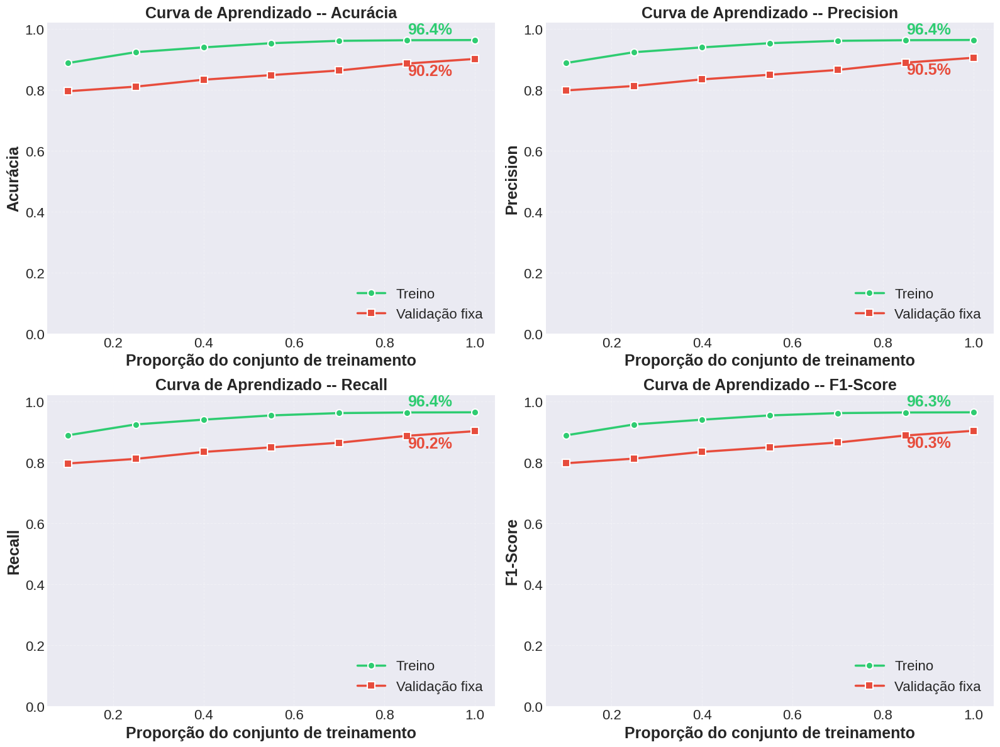

✅ Gráfico salvo: /content/Drive/MyDrive/Colab Notebooks/TCC2/random_forest_saved/random_forest_learning_curves_fixed_validation.png

💾 SALVANDO CURVA DE APRENDIZADO

✅ Gráfico salvo: /content/Drive/MyDrive/Colab Notebooks/TCC2/random_forest_saved/random_forest_learning_curves.png
✅ Dados de curva salvosa: /content/Drive/MyDrive/Colab Notebooks/TCC2/random_forest_saved/random_forest_learning_curves.json


<Figure size 640x480 with 0 Axes>


✅ RANDOM FOREST - TUDO CONCLUÍDO E SALVO!

📊 RESUMO:
   ✅ Modelo treinado
   ✅ 13 métricas calculadas
   ✅ Curvas de aprendizado geradas
   ✅ Tudo salvo no Google Drive

📁 Localização:
   /content/Drive/MyDrive/Colab Notebooks/TCC2/random_forest_saved

💾 Arquivos salvos:
   ✅ random_forest_metrics.csv
   ✅ random_forest_metrics.json
   ✅ random_forest_metrics.pkl
   ✅ random_forest_model.joblib
   ✅ random_forest_model.pkl
   ✅ random_forest_learning_curves.png
   ✅ random_forest_learning_curves.json
   ✅ metadata.json

🔄 Para carregar depois (sem retreinar):
   import pandas as pd
   df = pd.read_csv('/content/Drive/MyDrive/Colab Notebooks/TCC2/random_forest_saved/random_forest_metrics.csv')
   import joblib
   model = joblib.load('/content/Drive/MyDrive/Colab Notebooks/TCC2/random_forest_saved/random_forest_model.joblib')



In [ ]:
from sklearn.base import clone

print("\n" + "="*70)
print("1️⃣  RANDOM FOREST - VERSÃO OTIMIZADA")
print("="*70)

start_time = time.time()

print("\n🔄 Treinando Random Forest...")
rf_model.fit(X_train_features, y_train_indices)

# Predições
print("\n🔍 Gerando predições...")
rf_train_pred = rf_model.predict(X_train_features)
rf_val_pred = rf_model.predict(X_val_features)
rf_test_pred = rf_model.predict(X_test_features)

# Métricas - TREINO
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE TREINO")
print("="*70)

rf_train_acc = accuracy_score(y_train_indices, rf_train_pred)
rf_train_precision = precision_score(y_train_indices, rf_train_pred, average='weighted')
rf_train_recall = recall_score(y_train_indices, rf_train_pred, average='weighted')
rf_train_f1 = f1_score(y_train_indices, rf_train_pred, average='weighted')

print(f"   Acurácia Treino:   {rf_train_acc*100:.2f}%")
print(f"   Precision Treino:  {rf_train_precision*100:.2f}%")
print(f"   Recall Treino:     {rf_train_recall*100:.2f}%")
print(f"   F1-Score Treino:   {rf_train_f1*100:.2f}%")

# Métricas - VALIDAÇÃO
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE VALIDAÇÃO")
print("="*70)

rf_val_acc = accuracy_score(y_val_indices, rf_val_pred)
rf_val_precision = precision_score(y_val_indices, rf_val_pred, average='weighted')
rf_val_recall = recall_score(y_val_indices, rf_val_pred, average='weighted')
rf_val_f1 = f1_score(y_val_indices, rf_val_pred, average='weighted')

print(f"   Acurácia Validação:   {rf_val_acc*100:.2f}%")
print(f"   Precision Validação:  {rf_val_precision*100:.2f}%")
print(f"   Recall Validação:     {rf_val_recall*100:.2f}%")
print(f"   F1-Score Validação:   {rf_val_f1*100:.2f}%")

# Métricas - TESTE
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE TESTE")
print("="*70)

rf_test_acc = accuracy_score(y_test_indices, rf_test_pred)
rf_test_precision = precision_score(y_test_indices, rf_test_pred, average='weighted')
rf_test_recall = recall_score(y_test_indices, rf_test_pred, average='weighted')
rf_test_f1 = f1_score(y_test_indices, rf_test_pred, average='weighted')

print(f"   Acurácia Teste:   {rf_test_acc*100:.2f}%")
print(f"   Precision Teste:  {rf_test_precision*100:.2f}%")
print(f"   Recall Teste:     {rf_test_recall*100:.2f}%")
print(f"   F1-Score Teste:   {rf_test_f1*100:.2f}%")

# Tempo de treinamento
training_time = time.time() - start_time

print(f"\n⏱️  Tempo de Treinamento: {training_time:.2f}s")

# Relatório de classificação detalhado
print("\n" + "="*70)
print("📋 RELATÓRIO DE CLASSIFICAÇÃO DETALHADO - CONJUNTO DE TESTE")
print("="*70)

class_names = ['FAIR', 'GOOD', 'POOR']
print(classification_report(y_test_indices, rf_test_pred,
                           target_names=class_names, digits=4))

# ============================================================================
# SALVAR RESULTADOS
# ============================================================================

print("\n" + "="*70)
print("💾 SALVANDO RESULTADOS")
print("="*70 + "\n")

# Definir diretório
DRIVE_DIR = '/content/Drive/MyDrive/Colab Notebooks/TCC2'
SAVE_DIR = os.path.join(DRIVE_DIR, 'random_forest_saved')
os.makedirs(SAVE_DIR, exist_ok=True)

# ============================================================
# SALVAR PIPELINE DE PRÉ-PROCESSAMENTO - RANDOM FOREST
# ============================================================

joblib.dump(
    scaler_features,
    os.path.join(
        SAVE_DIR,
        "hog_scaler.joblib"
    )
)

joblib.dump(
    pca,
    os.path.join(
        SAVE_DIR,
        "pca.joblib"
    )
)

# Criar dicionário com resultados
rf_results = {
    'Modelo': 'RandomForest',
    'Train_Accuracy': rf_train_acc,
    'Train_Precision': rf_train_precision,
    'Train_Recall': rf_train_recall,
    'Train_F1': rf_train_f1,
    'Val_Accuracy': rf_val_acc,
    'Val_Precision': rf_val_precision,
    'Val_Recall': rf_val_recall,
    'Val_F1': rf_val_f1,
    'Test_Accuracy': rf_test_acc,
    'Test_Precision': rf_test_precision,
    'Test_Recall': rf_test_recall,
    'Test_F1': rf_test_f1,
    'Training_Time': training_time
}

# Salvar em CSV
csv_path = os.path.join(SAVE_DIR, 'random_forest_metrics.csv')
df_rf = pd.DataFrame([rf_results])
df_rf.to_csv(csv_path, index=False)
print(f"✅ CSV salvo: {csv_path}")

np.save(os.path.join(SAVE_DIR, "X_test_features.npy"), X_test_features)
np.save(os.path.join(SAVE_DIR, "y_test_indices.npy"), y_test_indices)

# Salvar em JSON
json_path = os.path.join(SAVE_DIR, 'random_forest_metrics.json')
with open(json_path, 'w') as f:
    json.dump(rf_results, f, indent=4)
print(f"✅ JSON salvo: {json_path}")

# Salvar em Pickle
pickle_path = os.path.join(SAVE_DIR, 'random_forest_metrics.pkl')
with open(pickle_path, 'wb') as f:
    pickle.dump(rf_results, f)
print(f"✅ Pickle salvo: {pickle_path}")

# Salvar modelo treinado
model_joblib_path = os.path.join(SAVE_DIR, 'random_forest_model.joblib')
joblib.dump(rf_model, model_joblib_path)
print(f"✅ Modelo (Joblib) salvo: {model_joblib_path}")

# Salvar modelo em Pickle também
model_pickle_path = os.path.join(SAVE_DIR, 'random_forest_model.pkl')
with open(model_pickle_path, 'wb') as f:
    pickle.dump(rf_model, f)
print(f"✅ Modelo (Pickle) salvo: {model_pickle_path}")

# Salvar metadados
metadata = {
    'data_salvamento': pd.Timestamp.now().isoformat(),
    'modelo': 'RandomForest',
    'configuracao': {
        'n_estimators': 200,
        'max_depth': 30,
        'min_samples_split': 5,
        'random_state': 42
    },
    'metricas': list(rf_results.keys()),
    'diretorio': SAVE_DIR
}

metadata_path = os.path.join(SAVE_DIR, 'metadata.json')
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=4)
print(f"✅ Metadados salvos: {metadata_path}")

print(f"\n📁 Diretório de salvamento: {SAVE_DIR}\n")

print("\n" + "="*70)
print("✅ RANDOM FOREST - TREINAMENTO E SALVAMENTO CONCLUÍDO")
print("="*70)

# ============================================================================
# CURVAS DE APRENDIZADO - RANDOM FOREST COM VALIDAÇÃO FIXA
# ============================================================================

print("\n" + "="*70)
print("📈 GERANDO CURVA DE APRENDIZADO - RANDOM FOREST")
print("="*70)

print("\n🔎 Estratégia:")
print("   - Treina com proporções crescentes do conjunto de treino")
print("   - Avalia sempre no mesmo conjunto de validação fixo")
print("   - Mantém aleatoriedade controlada com seed fixa")
print("   - Evita criar novas divisões internas com cross-validation\n")

curva_start = time.time()

train_sizes = np.linspace(0.1, 1.0, 7)

train_mean = {'accuracy': [], 'precision': [], 'recall': [], 'f1': []}
val_mean = {'accuracy': [], 'precision': [], 'recall': [], 'f1': []}

rng = np.random.default_rng(42)
all_indices = rng.permutation(len(X_train_features))

for i, train_size in enumerate(train_sizes):

    print(f"  [{i+1}/{len(train_sizes)}] Calculando para {train_size*100:.0f}% do treino...", end=" ")

    n_samples = int(len(X_train_features) * train_size)

    if train_size < 1.0:
        subset_idx = all_indices[:n_samples]
        X_subset = X_train_features[subset_idx]
        y_subset = y_train_indices[subset_idx]
    else:
        X_subset = X_train_features
        y_subset = y_train_indices

    rf_curve = clone(rf_model)

    rf_curve.fit(X_subset, y_subset)

    y_train_pred = rf_curve.predict(X_subset)
    y_val_pred = rf_curve.predict(X_val_features)

    train_mean['accuracy'].append(
        accuracy_score(y_subset, y_train_pred)
    )
    train_mean['precision'].append(
        precision_score(y_subset, y_train_pred, average='weighted', zero_division=0)
    )
    train_mean['recall'].append(
        recall_score(y_subset, y_train_pred, average='weighted', zero_division=0)
    )
    train_mean['f1'].append(
        f1_score(y_subset, y_train_pred, average='weighted', zero_division=0)
    )

    val_mean['accuracy'].append(
        accuracy_score(y_val_indices, y_val_pred)
    )
    val_mean['precision'].append(
        precision_score(y_val_indices, y_val_pred, average='weighted', zero_division=0)
    )
    val_mean['recall'].append(
        recall_score(y_val_indices, y_val_pred, average='weighted', zero_division=0)
    )
    val_mean['f1'].append(
        f1_score(y_val_indices, y_val_pred, average='weighted', zero_division=0)
    )

    print("✓")

curva_time = time.time() - curva_start
print(f"\n✅ Curva de aprendizado calculada em {curva_time:.1f}s")

for metric in train_mean.keys():
    train_mean[metric] = np.array(train_mean[metric])
    val_mean[metric] = np.array(val_mean[metric])

train_std = {metric: np.zeros_like(train_mean[metric]) for metric in train_mean.keys()}
val_std = {metric: np.zeros_like(val_mean[metric]) for metric in val_mean.keys()}

# ============================================================================
# VISUALIZAÇÃO - 4 GRÁFICOS (Acurácia, Precision, Recall, F1)
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

color_train = '#2ecc71'
color_val = '#e74c3c'

metrics_info = [
    (axes[0, 0], 'accuracy', 'Acurácia'),
    (axes[0, 1], 'precision', 'Precision'),
    (axes[1, 0], 'recall', 'Recall'),
    (axes[1, 1], 'f1', 'F1-Score')
]

for ax, metric, title in metrics_info:

    ax.plot(
        train_sizes,
        train_mean[metric],
        'o-',
        color=color_train,
        linewidth=2.5,
        markersize=8,
        label='Treino',
        markeredgewidth=1.5,
        markeredgecolor='white'
    )

    ax.plot(
        train_sizes,
        val_mean[metric],
        's-',
        color=color_val,
        linewidth=2.5,
        markersize=8,
        label='Validação fixa',
        markeredgewidth=1.5,
        markeredgecolor='white'
    )

    ax.grid(True, alpha=0.3, linestyle='--')

    ax.set_xlabel(
        'Proporção do conjunto de treinamento',
        fontweight='bold',
        fontsize=18
    )

    ax.set_ylabel(
        title,
        fontweight='bold',
        fontsize=18
    )

    ax.set_title(
        f'Curva de Aprendizado -- {title}',
        fontweight='bold',
        fontsize=18
    )

    ax.set_ylim([0, 1.02])

    ax.legend(
        loc='lower right',
        fontsize=16
    )

    ax.tick_params(
        axis='both',
        which='major',
        labelsize=16
    )

    ax.text(
        0.95,
        train_mean[metric][-1] + 0.01,
        f'{train_mean[metric][-1]*100:.1f}%',
        ha='right',
        va='bottom',
        fontsize=18,
        fontweight='bold',
        color=color_train
    )

    ax.text(
        0.95,
        val_mean[metric][-1] - 0.015,
        f'{val_mean[metric][-1]*100:.1f}%',
        ha='right',
        va='top',
        fontsize=18,
        fontweight='bold',
        color=color_val
    )

plt.tight_layout()

# ============================================================================
# SALVAR CURVA DE APRENDIZADO
# ============================================================================

graph_path = os.path.join(
    SAVE_DIR,
    'random_forest_learning_curves_fixed_validation.png'
)

plt.savefig(
    graph_path,
    dpi=300,
    bbox_inches='tight'
)

plt.show()

print(f"✅ Gráfico salvo: {graph_path}")

# ============================================================================
# SALVAR CURVA DE APRENDIZADO
# ============================================================================

print("\n" + "="*70)
print("💾 SALVANDO CURVA DE APRENDIZADO")
print("="*70 + "\n")

# Salvar gráfico
graph_path = os.path.join(SAVE_DIR, 'random_forest_learning_curves.png')
plt.savefig(graph_path, dpi=300, bbox_inches='tight')
print(f"✅ Gráfico salvo: {graph_path}")

# Salvar dados das curvas
curve_data = {
    'train_sizes': train_sizes.tolist(),
    'metrics': {
        'accuracy': {
            'train_mean': train_mean['accuracy'].tolist(),
            'train_std': train_std['accuracy'].tolist(),
            'val_mean': val_mean['accuracy'].tolist(),
            'val_std': val_std['accuracy'].tolist()
        },
        'precision': {
            'train_mean': train_mean['precision'].tolist(),
            'train_std': train_std['precision'].tolist(),
            'val_mean': val_mean['precision'].tolist(),
            'val_std': val_std['precision'].tolist()
        },
        'recall': {
            'train_mean': train_mean['recall'].tolist(),
            'train_std': train_std['recall'].tolist(),
            'val_mean': val_mean['recall'].tolist(),
            'val_std': val_std['recall'].tolist()
        },
        'f1': {
            'train_mean': train_mean['f1'].tolist(),
            'train_std': train_std['f1'].tolist(),
            'val_mean': val_mean['f1'].tolist(),
            'val_std': val_std['f1'].tolist()
        }
    }
}

curve_json_path = os.path.join(SAVE_DIR, 'random_forest_learning_curves.json')
with open(curve_json_path, 'w') as f:
    json.dump(curve_data, f, indent=4)
print(f"✅ Dados de curva salvosa: {curve_json_path}")

plt.show()

print("\n" + "="*70)
print("✅ RANDOM FOREST - TUDO CONCLUÍDO E SALVO!")
print("="*70)

print(f"""
📊 RESUMO:
   ✅ Modelo treinado
   ✅ 13 métricas calculadas
   ✅ Curvas de aprendizado geradas
   ✅ Tudo salvo no Google Drive

📁 Localização:
   {SAVE_DIR}

💾 Arquivos salvos:
   ✅ random_forest_metrics.csv
   ✅ random_forest_metrics.json
   ✅ random_forest_metrics.pkl
   ✅ random_forest_model.joblib
   ✅ random_forest_model.pkl
   ✅ random_forest_learning_curves.png
   ✅ random_forest_learning_curves.json
   ✅ metadata.json

🔄 Para carregar depois (sem retreinar):
   import pandas as pd
   df = pd.read_csv('{csv_path}')
   import joblib
   model = joblib.load('{model_joblib_path}')
""")

## 14.3 SVM

In [ ]:
# ============================================================================
# FUNÇÃO PARA EXTRAIR TODOS OS DADOS DOS GENERATORS
# ============================================================================

def get_all_data_from_generator(generator):
    """
    Extrai todas as imagens e labels de um ImageDataGenerator.
    """

    all_images = []
    all_labels = []

    for i in tqdm(range(len(generator)), desc="Extraindo dados"):

        batch_images, batch_labels = generator[i]

        all_images.append(batch_images)
        all_labels.append(batch_labels)

    # Concatenar batches
    return np.vstack(all_images), np.vstack(all_labels)


# ============================================================================
# EXTRAIR IMAGENS E LABELS
# ============================================================================

print("\n🔄 Extraindo dados do train_generator...")
X_train, y_train = get_all_data_from_generator(train_generator)

print("\n🔄 Extraindo dados do val_generator...")
X_val, y_val = get_all_data_from_generator(val_generator)

print("\n🔄 Extraindo dados do test_generator...")
X_test, y_test = get_all_data_from_generator(test_generator)

print(f"\n✅ X_train shape: {X_train.shape}")
print(f"✅ X_val shape: {X_val.shape}")
print(f"✅ X_test shape: {X_test.shape}")


# ============================================================================
# FUNÇÃO DE EXTRAÇÃO CLÁSSICA DE FEATURES (HOG)
# ============================================================================

def extract_hog_features(images):

    """
    Extrai features clássicas usando HOG
    (Histogram of Oriented Gradients)
    """

    features_list = []

    for img in tqdm(images, desc="Extraindo HOG"):

        # Converter RGB para grayscale
        gray = rgb2gray(img)

        # Extrair HOG
        hog_features = hog(
            gray,
            orientations=9,
            pixels_per_cell=(16, 16),
            cells_per_block=(2, 2),
            block_norm='L2-Hys',
            visualize=False
        )

        features_list.append(hog_features)

    return np.array(features_list)


# ============================================================================
# EXTRAÇÃO DE FEATURES CLÁSSICAS
# ============================================================================

print("\n🔄 Extraindo HOG - TREINAMENTO...")
X_train_features = extract_hog_features(X_train)

print("\n🔄 Extraindo HOG - VALIDAÇÃO...")
X_val_features = extract_hog_features(X_val)

print("\n🔄 Extraindo HOG - TESTE...")
X_test_features = extract_hog_features(X_test)

print(f"\n📊 Shape original HOG: {X_train_features.shape}")


# ============================================================================
# NORMALIZAÇÃO DAS FEATURES
# ============================================================================

print("\n🔄 Normalizando features...")

scaler_features = StandardScaler()

X_train_features = scaler_features.fit_transform(X_train_features)

X_val_features = scaler_features.transform(X_val_features)

X_test_features = scaler_features.transform(X_test_features)


# ============================================================================
# PCA PARA REDUÇÃO DIMENSIONAL
# ============================================================================

print("\n🔄 Aplicando PCA...")

pca = PCA(
    n_components=0.90,  # mantém 95% da variância
    random_state=42
)

X_train_features = pca.fit_transform(X_train_features)

X_val_features = pca.transform(X_val_features)

X_test_features = pca.transform(X_test_features)

print(f"✅ Shape após PCA: {X_train_features.shape}")


# ============================================================================
# CONVERTER LABELS ONE-HOT PARA ÍNDICES
# ============================================================================

y_train_indices = np.argmax(y_train, axis=1)

y_val_indices = np.argmax(y_val, axis=1)

y_test_indices = np.argmax(y_test, axis=1)


# ============================================================================
# RESUMO FINAL
# ============================================================================

print("\n" + "="*70)
print("✅ PREPARAÇÃO DE DADOS CONCLUÍDA")
print("="*70)

print(f"X_train_features shape: {X_train_features.shape}")
print(f"X_val_features shape: {X_val_features.shape}")
print(f"X_test_features shape: {X_test_features.shape}")

print(f"y_train_indices shape: {y_train_indices.shape}")

print("="*70)
print("✅ FEATURES EXTRAÍDAS COM MÉTODO CLÁSSICO (HOG + PCA)")
print("="*70)


🔄 Extraindo dados do train_generator...


Extraindo dados: 100%|██████████| 151/151 [00:42<00:00,  3.53it/s]



🔄 Extraindo dados do val_generator...


Extraindo dados: 100%|██████████| 5/5 [00:00<00:00, 21.61it/s]



🔄 Extraindo dados do test_generator...


Extraindo dados: 100%|██████████| 9/9 [00:00<00:00, 17.00it/s]



✅ X_train shape: (4824, 224, 224, 3)
✅ X_val shape: (132, 224, 224, 3)
✅ X_test shape: (287, 224, 224, 3)

🔄 Extraindo HOG - TREINAMENTO...


Extraindo HOG: 100%|██████████| 4824/4824 [00:31<00:00, 152.39it/s]



🔄 Extraindo HOG - VALIDAÇÃO...


Extraindo HOG: 100%|██████████| 132/132 [00:00<00:00, 150.51it/s]



🔄 Extraindo HOG - TESTE...


Extraindo HOG: 100%|██████████| 287/287 [00:01<00:00, 151.47it/s]



📊 Shape original HOG: (4824, 6084)

🔄 Normalizando features...

🔄 Aplicando PCA...
✅ Shape após PCA: (4824, 641)

✅ PREPARAÇÃO DE DADOS CONCLUÍDA
X_train_features shape: (4824, 641)
X_val_features shape: (132, 641)
X_test_features shape: (287, 641)
y_train_indices shape: (4824,)
✅ FEATURES EXTRAÍDAS COM MÉTODO CLÁSSICO (HOG + PCA)


In [ ]:
print("="*70)
print("BUSCA DE HIPERPARÂMETROS - SVM COM VALIDAÇÃO FIXA")
print("="*70)

param_grid = {
    "C": [0.1, 1, 2, 5, 10, 20],
    "gamma": ["scale", 0.0005, 0.1, 0.01, 0.001],
    "kernel": ["rbf"]
}

best_model = None
best_params = None
best_score = -1
results_search = []

total_models = (
    len(param_grid["C"]) *
    len(param_grid["gamma"]) *
    len(param_grid["kernel"])
)

print(f"\nSerão treinados {total_models} modelos.\n")

contador = 1

for C, gamma, kernel in product(
    param_grid["C"],
    param_grid["gamma"],
    param_grid["kernel"]
):

    print(f"[{contador}/{total_models}] C={C}, gamma={gamma}, kernel={kernel}")

    start = time.time()

    svm = SVC(
        kernel=kernel,
        C=C,
        gamma=gamma,
        class_weight="balanced",
        random_state=42,
        verbose=0
    )

    svm.fit(X_train_features, y_train_indices)

    pred_val = svm.predict(X_val_features)

    val_acc = accuracy_score(y_val_indices, pred_val)
    val_f1 = f1_score(y_val_indices, pred_val, average="weighted", zero_division=0)

    elapsed = time.time() - start

    results_search.append({
        "kernel": kernel,
        "C": C,
        "gamma": gamma,
        "class_weight": "balanced",
        "Val_Accuracy": val_acc,
        "Val_F1": val_f1,
        "Tempo_s": elapsed
    })

    print(f"   Val Accuracy = {val_acc:.4f} | Val F1 = {val_f1:.4f} | Tempo = {elapsed:.1f}s")

    if val_f1 > best_score:
        best_score = val_f1
        best_model = svm
        best_params = {
            "kernel": kernel,
            "C": C,
            "gamma": gamma,
            "class_weight": "balanced"
        }

    contador += 1

search_df = pd.DataFrame(results_search).sort_values("Val_F1", ascending=False)

print("\n" + "="*70)
print("MELHORES CONFIGURAÇÕES")
print("="*70)
print(search_df.head(10))

print("\n" + "="*70)
print("MELHOR CONFIGURAÇÃO SVM")
print("="*70)
print(best_params)
print(f"Melhor F1 validação: {best_score:.4f}")

svm_model = best_model

BUSCA DE HIPERPARÂMETROS - SVM COM VALIDAÇÃO FIXA

Serão treinados 30 modelos.

[1/30] C=0.1, gamma=scale, kernel=rbf
   Val Accuracy = 0.8106 | Val F1 = 0.8090 | Tempo = 3.1s
[2/30] C=0.1, gamma=0.0005, kernel=rbf
   Val Accuracy = 0.7348 | Val F1 = 0.7263 | Tempo = 4.0s
[3/30] C=0.1, gamma=0.1, kernel=rbf
   Val Accuracy = 0.2955 | Val F1 = 0.1348 | Tempo = 6.6s
[4/30] C=0.1, gamma=0.01, kernel=rbf
   Val Accuracy = 0.2955 | Val F1 = 0.1348 | Tempo = 5.9s
[5/30] C=0.1, gamma=0.001, kernel=rbf
   Val Accuracy = 0.7348 | Val F1 = 0.7263 | Tempo = 5.2s
[6/30] C=1, gamma=scale, kernel=rbf
   Val Accuracy = 0.9697 | Val F1 = 0.9699 | Tempo = 2.3s
[7/30] C=1, gamma=0.0005, kernel=rbf
   Val Accuracy = 0.9470 | Val F1 = 0.9470 | Tempo = 4.0s
[8/30] C=1, gamma=0.1, kernel=rbf
   Val Accuracy = 0.3788 | Val F1 = 0.2081 | Tempo = 6.5s
[9/30] C=1, gamma=0.01, kernel=rbf
   Val Accuracy = 0.3788 | Val F1 = 0.2081 | Tempo = 5.5s
[10/30] C=1, gamma=0.001, kernel=rbf
   Val Accuracy = 0.8939 | Val 


2️⃣  SUPPORT VECTOR MACHINE (SVM) - VERSÃO OTIMIZADA

🔄 Treinando SVM...

🔍 Gerando predições...

📊 MÉTRICAS - CONJUNTO DE TREINO
   Acurácia Treino:   99.19%
   Precision Treino:  99.19%
   Recall Treino:     99.19%
   F1-Score Treino:   99.19%

📊 MÉTRICAS - CONJUNTO DE VALIDAÇÃO
   Acurácia Validação:   96.97%
   Precision Validação:  97.08%
   Recall Validação:     96.97%
   F1-Score Validação:   96.99%

📊 MÉTRICAS - CONJUNTO DE TESTE
   Acurácia Teste:   95.12%
   Precision Teste:  95.30%
   Recall Teste:     95.12%
   F1-Score Teste:   95.11%

⏱️  Tempo de Treinamento: 8.39s

📋 RELATÓRIO DE CLASSIFICAÇÃO DETALHADO - CONJUNTO DE TESTE
              precision    recall  f1-score   support

        FAIR     0.9043    0.9884    0.9444        86
        GOOD     0.9651    0.8925    0.9274        93
        POOR     0.9813    0.9722    0.9767       108

    accuracy                         0.9512       287
   macro avg     0.9502    0.9510    0.9495       287
weighted avg     0.9530   

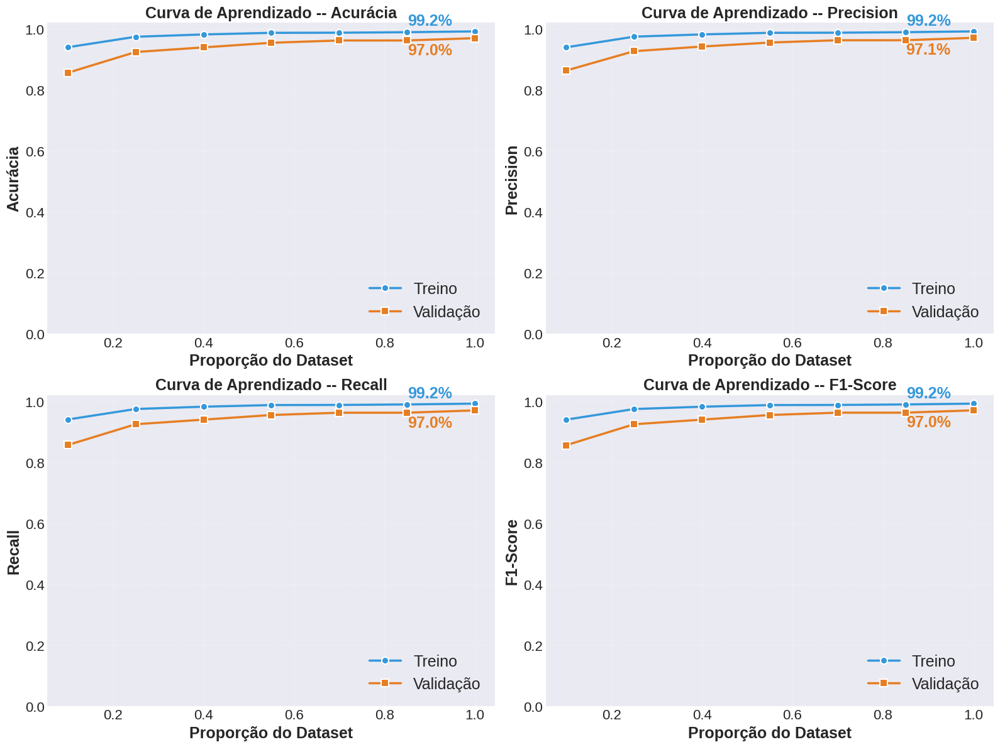

In [ ]:
print("\n" + "="*70)
print("2️⃣  SUPPORT VECTOR MACHINE (SVM) - VERSÃO OTIMIZADA")
print("="*70)

start_time = time.time()

print("\n🔄 Treinando SVM...")
svm_model.fit(X_train_features, y_train_indices)

# Predições
print("\n🔍 Gerando predições...")
svm_train_pred = svm_model.predict(X_train_features)
svm_val_pred = svm_model.predict(X_val_features)
svm_test_pred = svm_model.predict(X_test_features)

# Métricas - TREINO
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE TREINO")
print("="*70)

svm_train_acc = accuracy_score(y_train_indices, svm_train_pred)
svm_train_precision = precision_score(y_train_indices, svm_train_pred, average='weighted')
svm_train_recall = recall_score(y_train_indices, svm_train_pred, average='weighted')
svm_train_f1 = f1_score(y_train_indices, svm_train_pred, average='weighted')

print(f"   Acurácia Treino:   {svm_train_acc*100:.2f}%")
print(f"   Precision Treino:  {svm_train_precision*100:.2f}%")
print(f"   Recall Treino:     {svm_train_recall*100:.2f}%")
print(f"   F1-Score Treino:   {svm_train_f1*100:.2f}%")

# Métricas - VALIDAÇÃO
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE VALIDAÇÃO")
print("="*70)

svm_val_acc = accuracy_score(y_val_indices, svm_val_pred)
svm_val_precision = precision_score(y_val_indices, svm_val_pred, average='weighted')
svm_val_recall = recall_score(y_val_indices, svm_val_pred, average='weighted')
svm_val_f1 = f1_score(y_val_indices, svm_val_pred, average='weighted')

print(f"   Acurácia Validação:   {svm_val_acc*100:.2f}%")
print(f"   Precision Validação:  {svm_val_precision*100:.2f}%")
print(f"   Recall Validação:     {svm_val_recall*100:.2f}%")
print(f"   F1-Score Validação:   {svm_val_f1*100:.2f}%")

# Métricas - TESTE
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE TESTE")
print("="*70)

svm_test_acc = accuracy_score(y_test_indices, svm_test_pred)
svm_test_precision = precision_score(y_test_indices, svm_test_pred, average='weighted')
svm_test_recall = recall_score(y_test_indices, svm_test_pred, average='weighted')
svm_test_f1 = f1_score(y_test_indices, svm_test_pred, average='weighted')

print(f"   Acurácia Teste:   {svm_test_acc*100:.2f}%")
print(f"   Precision Teste:  {svm_test_precision*100:.2f}%")
print(f"   Recall Teste:     {svm_test_recall*100:.2f}%")
print(f"   F1-Score Teste:   {svm_test_f1*100:.2f}%")

# Tempo de treinamento
training_time = time.time() - start_time

print(f"\n⏱️  Tempo de Treinamento: {training_time:.2f}s")

# Relatório de classificação detalhado
print("\n" + "="*70)
print("📋 RELATÓRIO DE CLASSIFICAÇÃO DETALHADO - CONJUNTO DE TESTE")
print("="*70)

class_names = ['FAIR', 'GOOD', 'POOR']
print(classification_report(y_test_indices, svm_test_pred,
                           target_names=class_names, digits=4))

# ============================================================================
# SALVAR RESULTADOS
# ============================================================================

print("\n" + "="*70)
print("💾 SALVANDO RESULTADOS")
print("="*70 + "\n")

classical_models['SVM'] = svm_model

# Definir diretório
DRIVE_DIR = '/content/Drive/MyDrive/Colab Notebooks/TCC2'
SAVE_DIR = os.path.join(DRIVE_DIR, 'SVM_saved')
os.makedirs(SAVE_DIR, exist_ok=True)

# ============================================================
# SALVAR PIPELINE DE PRÉ-PROCESSAMENTO - SVM
# ============================================================

joblib.dump(
    scaler_features,
    os.path.join(
        SAVE_DIR,
        "hog_scaler.joblib"
    )
)

joblib.dump(
    pca,
    os.path.join(
        SAVE_DIR,
        "pca.joblib"
    )
)

# Criar dicionário com resultados
svm_results = {
    'Modelo': 'RandomForest',
    'Train_Accuracy': svm_train_acc,
    'Train_Precision': svm_train_precision,
    'Train_Recall': svm_train_recall,
    'Train_F1': svm_train_f1,
    'Val_Accuracy': svm_val_acc,
    'Val_Precision': svm_val_precision,
    'Val_Recall': svm_val_recall,
    'Val_F1': svm_val_f1,
    'Test_Accuracy': svm_test_acc,
    'Test_Precision': svm_test_precision,
    'Test_Recall': svm_test_recall,
    'Test_F1': svm_test_f1,
    'Training_Time': training_time
}


# Salvar em CSV
csv_path = os.path.join(SAVE_DIR, 'svm_metrics.csv')
df_svm = pd.DataFrame([svm_results])
df_svm.to_csv(csv_path, index=False)
print(f"✅ CSV salvo: {csv_path}")

# Salvar em JSON
json_path = os.path.join(SAVE_DIR, 'svm_metrics.json')
with open(json_path, 'w') as f:
    json.dump(svm_results, f, indent=4)
print(f"✅ JSON salvo: {json_path}")

# Salvar em Pickle
pickle_path = os.path.join(SAVE_DIR, 'svm_metrics.pkl')
with open(pickle_path, 'wb') as f:
    pickle.dump(svm_results, f)
print(f"✅ Pickle salvo: {pickle_path}")

# Salvar modelo treinado
model_joblib_path = os.path.join(SAVE_DIR, 'svm_model.joblib')
joblib.dump(svm_model, model_joblib_path)
print(f"✅ Modelo (Joblib) salvo: {model_joblib_path}")

# Salvar modelo em Pickle também
model_pickle_path = os.path.join(SAVE_DIR, 'svm_model.pkl')
with open(model_pickle_path, 'wb') as f:
    pickle.dump(svm_model, f)
print(f"✅ Modelo (Pickle) salvo: {model_pickle_path}")

np.save(os.path.join(SAVE_DIR, "X_test_features.npy"), X_test_features)
np.save(os.path.join(SAVE_DIR, "y_test_indices.npy"), y_test_indices)

# Salvar metadados
metadata = {
    'data_salvamento': pd.Timestamp.now().isoformat(),
    'modelo': 'SVM',
    'configuracao': {
        'kernel': 'rbf',
        'C': 10,
        'gamma': 'scale'
    },
    'metricas': list(svm_results.keys()),
    'diretorio': SAVE_DIR
}

metadata_path = os.path.join(SAVE_DIR, 'metadata.json')
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=4)
print(f"✅ Metadados salvos: {metadata_path}")

print(f"\n📁 Diretório de salvamento: {SAVE_DIR}\n")

print("\n" + "="*70)
print("✅ SVM - TREINAMENTO E SALVAMENTO CONCLUÍDO")
print("="*70)

# ============================================================================
# CURVAS DE APRENDIZADO - SVM COM VALIDAÇÃO FIXA
# ============================================================================

print("\n" + "="*70)
print("📈 GERANDO CURVA DE APRENDIZADO - SVM")
print("="*70)

print("\n🔎 Estratégia:")
print("   - Treina com proporções crescentes do conjunto de treino")
print("   - Avalia sempre no mesmo conjunto de validação fixo")
print("   - Mantém aleatoriedade controlada com seed fixa")
print("   - Evita criar novas divisões internas com cross-validation\n")

curva_start = time.time()

train_sizes = np.linspace(0.1, 1.0, 7)

train_mean = {'accuracy': [], 'precision': [], 'recall': [], 'f1': []}
val_mean = {'accuracy': [], 'precision': [], 'recall': [], 'f1': []}

rng = np.random.default_rng(42)
all_indices = rng.permutation(len(X_train_features))

for i, train_size in enumerate(train_sizes):

    print(f"  [{i+1}/{len(train_sizes)}] Calculando para {train_size*100:.0f}% do treino...", end=" ")

    n_samples = int(len(X_train_features) * train_size)

    if train_size < 1.0:
        subset_idx = all_indices[:n_samples]
        X_subset = X_train_features[subset_idx]
        y_subset = y_train_indices[subset_idx]
    else:
        X_subset = X_train_features
        y_subset = y_train_indices

    svm_curve = SVC(
        kernel=svm_model.kernel,
        C=svm_model.C,
        gamma=svm_model.gamma,
        class_weight=svm_model.class_weight,
        random_state=42,
        verbose=0
    )

    svm_curve.fit(X_subset, y_subset)

    y_train_pred = svm_curve.predict(X_subset)
    y_val_pred = svm_curve.predict(X_val_features)

    train_mean['accuracy'].append(
        accuracy_score(y_subset, y_train_pred)
    )
    train_mean['precision'].append(
        precision_score(y_subset, y_train_pred, average='weighted', zero_division=0)
    )
    train_mean['recall'].append(
        recall_score(y_subset, y_train_pred, average='weighted', zero_division=0)
    )
    train_mean['f1'].append(
        f1_score(y_subset, y_train_pred, average='weighted', zero_division=0)
    )

    val_mean['accuracy'].append(
        accuracy_score(y_val_indices, y_val_pred)
    )
    val_mean['precision'].append(
        precision_score(y_val_indices, y_val_pred, average='weighted', zero_division=0)
    )
    val_mean['recall'].append(
        recall_score(y_val_indices, y_val_pred, average='weighted', zero_division=0)
    )
    val_mean['f1'].append(
        f1_score(y_val_indices, y_val_pred, average='weighted', zero_division=0)
    )

    print("✓")

curva_time = time.time() - curva_start
print(f"\n✅ Curva de aprendizado calculada em {curva_time:.1f}s")

for metric in train_mean.keys():
    train_mean[metric] = np.array(train_mean[metric])
    val_mean[metric] = np.array(val_mean[metric])

train_std = {metric: np.zeros_like(train_mean[metric]) for metric in train_mean.keys()}
val_std = {metric: np.zeros_like(val_mean[metric]) for metric in val_mean.keys()}

# ============================================================================
# VISUALIZAÇÃO - 4 GRÁFICOS (Acurácia, Precision, Recall, F1)
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

color_train = '#3498db'  # Azul
color_val = '#e67e22'    # Laranja

metrics_info = [
    (axes[0, 0], 'accuracy', 'Acurácia'),
    (axes[0, 1], 'precision', 'Precision'),
    (axes[1, 0], 'recall', 'Recall'),
    (axes[1, 1], 'f1', 'F1-Score')
]

for ax, metric, title in metrics_info:
    # Plotar curvas
    ax.plot(train_sizes, train_mean[metric], 'o-', color=color_train, linewidth=2.5,
            markersize=8, label='Treino', markeredgewidth=1.5, markeredgecolor='white')
    ax.fill_between(train_sizes,
                    train_mean[metric] - train_std[metric],
                    train_mean[metric] + train_std[metric],
                    alpha=0.15, color=color_train)

    ax.plot(train_sizes, val_mean[metric], 's-', color=color_val, linewidth=2.5,
            markersize=8, label='Validação', markeredgewidth=1.5, markeredgecolor='white')
    ax.fill_between(train_sizes,
                    val_mean[metric] - val_std[metric],
                    val_mean[metric] + val_std[metric],
                    alpha=0.15, color=color_val)

    # Formatação
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_xlabel('Proporção do Dataset', fontweight='bold', fontsize=18)
    ax.set_ylabel(title, fontweight='bold', fontsize=18)
    ax.set_title(f'Curva de Aprendizado -- {title}', fontweight='bold', fontsize=18)
    ax.set_ylim([0, 1.02])
    ax.legend(loc='lower right', fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=16)


    # Valores finais
    ax.text(0.95, train_mean[metric][-1] + 0.01, f'{train_mean[metric][-1]*100:.1f}%',
            ha='right', va='bottom', fontsize=18, fontweight='bold', color=color_train)
    ax.text(0.95, val_mean[metric][-1] - 0.015, f'{val_mean[metric][-1]*100:.1f}%',
            ha='right', va='top', fontsize=18, fontweight='bold', color=color_val)


plt.tight_layout()

print(f"""
📊 RESUMO:
   ✅ Modelo treinado
   ✅ Curvas de aprendizado geradas
   ✅ Tudo salvo no Google Drive

📁 Localização:
   {SAVE_DIR}
""")


## 14.2 XGBoost

In [ ]:
# ============================================================================
# FUNÇÃO PARA EXTRAIR TODOS OS DADOS DOS GENERATORS
# ============================================================================

def get_all_data_from_generator(generator):
    """
    Extrai todas as imagens e labels de um ImageDataGenerator.
    """

    all_images = []
    all_labels = []

    for i in tqdm(range(len(generator)), desc="Extraindo dados"):

        batch_images, batch_labels = generator[i]

        all_images.append(batch_images)
        all_labels.append(batch_labels)

    # Concatenar batches
    return np.vstack(all_images), np.vstack(all_labels)


# ============================================================================
# EXTRAIR IMAGENS E LABELS
# ============================================================================

print("\n🔄 Extraindo dados do train_generator...")
X_train, y_train = get_all_data_from_generator(train_generator)

print("\n🔄 Extraindo dados do val_generator...")
X_val, y_val = get_all_data_from_generator(val_generator)

print("\n🔄 Extraindo dados do test_generator...")
X_test, y_test = get_all_data_from_generator(test_generator)

print(f"\n✅ X_train shape: {X_train.shape}")
print(f"✅ X_val shape: {X_val.shape}")
print(f"✅ X_test shape: {X_test.shape}")


# ============================================================================
# FUNÇÃO DE EXTRAÇÃO CLÁSSICA DE FEATURES (HOG)
# ============================================================================

def extract_hog_features(images):

    """
    Extrai features clássicas usando HOG
    (Histogram of Oriented Gradients)
    """

    features_list = []

    for img in tqdm(images, desc="Extraindo HOG"):

        # Converter RGB para grayscale
        gray = rgb2gray(img)

        # Extrair HOG
        hog_features = hog(
            gray,
            orientations=9,
            pixels_per_cell=(16, 16),
            cells_per_block=(2, 2),
            block_norm='L2-Hys',
            visualize=False
        )

        features_list.append(hog_features)

    return np.array(features_list)


# ============================================================================
# EXTRAÇÃO DE FEATURES CLÁSSICAS
# ============================================================================

print("\n🔄 Extraindo HOG - TREINAMENTO...")
X_train_features = extract_hog_features(X_train)

print("\n🔄 Extraindo HOG - VALIDAÇÃO...")
X_val_features = extract_hog_features(X_val)

print("\n🔄 Extraindo HOG - TESTE...")
X_test_features = extract_hog_features(X_test)

print(f"\n📊 Shape original HOG: {X_train_features.shape}")


# ============================================================================
# NORMALIZAÇÃO DAS FEATURES
# ============================================================================

print("\n🔄 Normalizando features...")

scaler_features = StandardScaler()

X_train_features = scaler_features.fit_transform(X_train_features)

X_val_features = scaler_features.transform(X_val_features)

X_test_features = scaler_features.transform(X_test_features)


# ============================================================================
# PCA PARA REDUÇÃO DIMENSIONAL
# ============================================================================

print("\n🔄 Aplicando PCA...")

pca = PCA(
    n_components=0.95,  # mantém 95% da variância
    random_state=42
)

X_train_features = pca.fit_transform(X_train_features)

X_val_features = pca.transform(X_val_features)

X_test_features = pca.transform(X_test_features)

print(f"✅ Shape após PCA: {X_train_features.shape}")


# ============================================================================
# CONVERTER LABELS ONE-HOT PARA ÍNDICES
# ============================================================================

y_train_indices = np.argmax(y_train, axis=1)

y_val_indices = np.argmax(y_val, axis=1)

y_test_indices = np.argmax(y_test, axis=1)


# ============================================================================
# RESUMO FINAL
# ============================================================================

print("\n" + "="*70)
print("✅ PREPARAÇÃO DE DADOS CONCLUÍDA")
print("="*70)

print(f"X_train_features shape: {X_train_features.shape}")
print(f"X_val_features shape: {X_val_features.shape}")
print(f"X_test_features shape: {X_test_features.shape}")

print(f"y_train_indices shape: {y_train_indices.shape}")

print("="*70)
print("✅ FEATURES EXTRAÍDAS COM MÉTODO CLÁSSICO (HOG + PCA)")
print("="*70)


🔄 Extraindo dados do train_generator...


Extraindo dados: 100%|██████████| 151/151 [01:04<00:00,  2.35it/s]



🔄 Extraindo dados do val_generator...


Extraindo dados: 100%|██████████| 5/5 [00:00<00:00, 11.20it/s]



🔄 Extraindo dados do test_generator...


Extraindo dados: 100%|██████████| 9/9 [00:01<00:00,  7.99it/s]



✅ X_train shape: (4824, 224, 224, 3)
✅ X_val shape: (132, 224, 224, 3)
✅ X_test shape: (287, 224, 224, 3)

🔄 Extraindo HOG - TREINAMENTO...


Extraindo HOG: 100%|██████████| 4824/4824 [00:37<00:00, 127.15it/s]



🔄 Extraindo HOG - VALIDAÇÃO...


Extraindo HOG: 100%|██████████| 132/132 [00:00<00:00, 132.33it/s]



🔄 Extraindo HOG - TESTE...


Extraindo HOG: 100%|██████████| 287/287 [00:02<00:00, 128.00it/s]



📊 Shape original HOG: (4824, 6084)

🔄 Normalizando features...

🔄 Aplicando PCA...
✅ Shape após PCA: (4824, 1017)

✅ PREPARAÇÃO DE DADOS CONCLUÍDA
X_train_features shape: (4824, 1017)
X_val_features shape: (132, 1017)
X_test_features shape: (287, 1017)
y_train_indices shape: (4824,)
✅ FEATURES EXTRAÍDAS COM MÉTODO CLÁSSICO (HOG + PCA)


In [ ]:
print("\n" + "="*70)
print("BUSCA DE HIPERPARÂMETROS - XGBOOST COM EARLY STOPPING")
print("="*70)

param_grid = {
    "n_estimators": [300, 500],
    "max_depth": [3, 4],
    "learning_rate": [0.03, 0.05, 0.1],
    "min_child_weight": [3, 5],
    "gamma": [0.3, 0.5, 1],
    "subsample": [0.8],
    "colsample_bytree": [0.8],
    "reg_alpha": [0.1, 0.3],
    "reg_lambda": [1, 3]
}

best_model = None
best_params = None
best_score = -1
results_search = []

total_models = (
    len(param_grid["n_estimators"]) *
    len(param_grid["max_depth"]) *
    len(param_grid["learning_rate"]) *
    len(param_grid["min_child_weight"]) *
    len(param_grid["gamma"]) *
    len(param_grid["subsample"]) *
    len(param_grid["colsample_bytree"]) *
    len(param_grid["reg_alpha"]) *
    len(param_grid["reg_lambda"])
)

print(f"\nSerão treinados {total_models} modelos.\n")

contador = 1
search_start = time.time()

for params in product(
    param_grid["n_estimators"],
    param_grid["max_depth"],
    param_grid["learning_rate"],
    param_grid["min_child_weight"],
    param_grid["gamma"],
    param_grid["subsample"],
    param_grid["colsample_bytree"],
    param_grid["reg_alpha"],
    param_grid["reg_lambda"]
):

    (
        n_estimators,
        max_depth,
        learning_rate,
        min_child_weight,
        gamma,
        subsample,
        colsample_bytree,
        reg_alpha,
        reg_lambda
    ) = params

    print(
        f"[{contador}/{total_models}] "
        f"n={n_estimators}, depth={max_depth}, lr={learning_rate}, "
        f"min_child={min_child_weight}, gamma={gamma}, "
        f"alpha={reg_alpha}, lambda={reg_lambda}"
    )

    start = time.time()

    model = xgb.XGBClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        min_child_weight=min_child_weight,
        gamma=gamma,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        objective="multi:softprob",
        num_class=NUM_CLASSES,
        random_state=42,
        n_jobs=-1,
        eval_metric="mlogloss",
        early_stopping_rounds=30,
        verbosity=0
    )

    model.fit(
        X_train_features,
        y_train_indices,
        eval_set=[(X_val_features, y_val_indices)],
        verbose=False
    )

    pred_train = model.predict(X_train_features)
    pred_val = model.predict(X_val_features)

    train_f1 = f1_score(
        y_train_indices,
        pred_train,
        average="weighted",
        zero_division=0
    )

    val_acc = accuracy_score(y_val_indices, pred_val)

    val_f1 = f1_score(
        y_val_indices,
        pred_val,
        average="weighted",
        zero_division=0
    )

    elapsed = time.time() - start

    best_iteration = getattr(model, "best_iteration", None)

    results_search.append({
        "n_estimators": n_estimators,
        "best_iteration": best_iteration,
        "max_depth": max_depth,
        "learning_rate": learning_rate,
        "min_child_weight": min_child_weight,
        "gamma": gamma,
        "subsample": subsample,
        "colsample_bytree": colsample_bytree,
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "Train_F1": train_f1,
        "Val_Accuracy": val_acc,
        "Val_F1": val_f1,
        "Gap_Train_Val": train_f1 - val_f1,
        "Tempo_s": elapsed
    })

    print(
        f"   Train F1 = {train_f1:.4f} | "
        f"Val F1 = {val_f1:.4f} | "
        f"Gap = {train_f1 - val_f1:.4f} | "
        f"Best iter = {best_iteration} | "
        f"Tempo = {elapsed:.1f}s"
    )

    if val_f1 > best_score:
        best_score = val_f1
        best_model = model
        best_params = {
            "n_estimators": n_estimators,
            "best_iteration": best_iteration,
            "max_depth": max_depth,
            "learning_rate": learning_rate,
            "min_child_weight": min_child_weight,
            "gamma": gamma,
            "subsample": subsample,
            "colsample_bytree": colsample_bytree,
            "reg_alpha": reg_alpha,
            "reg_lambda": reg_lambda,
            "objective": "multi:softprob",
            "early_stopping_rounds": 30
        }

    contador += 1

search_time = time.time() - search_start

search_df = pd.DataFrame(results_search).sort_values(
    "Val_F1",
    ascending=False
)

print("\n" + "="*70)
print("MELHORES CONFIGURAÇÕES - XGBOOST")
print("="*70)
print(search_df.head(10))

print("\n" + "="*70)
print("MELHOR CONFIGURAÇÃO XGBOOST")
print("="*70)
print(best_params)
print(f"Melhor F1 validação: {best_score:.4f}")
print(f"Tempo total da busca: {search_time:.1f}s")

xgb_model = best_model


BUSCA DE HIPERPARÂMETROS - XGBOOST COM EARLY STOPPING

Serão treinados 288 modelos.

[1/288] n=300, depth=3, lr=0.03, min_child=3, gamma=0.3, alpha=0.1, lambda=1
   Train F1 = 0.9572 | Val F1 = 0.9470 | Gap = 0.0102 | Best iter = 298 | Tempo = 18.8s
[2/288] n=300, depth=3, lr=0.03, min_child=3, gamma=0.3, alpha=0.1, lambda=3
   Train F1 = 0.9541 | Val F1 = 0.9545 | Gap = -0.0005 | Best iter = 298 | Tempo = 20.0s
[3/288] n=300, depth=3, lr=0.03, min_child=3, gamma=0.3, alpha=0.3, lambda=1
   Train F1 = 0.9572 | Val F1 = 0.9545 | Gap = 0.0026 | Best iter = 298 | Tempo = 18.0s
[4/288] n=300, depth=3, lr=0.03, min_child=3, gamma=0.3, alpha=0.3, lambda=3
   Train F1 = 0.9532 | Val F1 = 0.9545 | Gap = -0.0013 | Best iter = 299 | Tempo = 19.9s
[5/288] n=300, depth=3, lr=0.03, min_child=3, gamma=0.5, alpha=0.1, lambda=1
   Train F1 = 0.9555 | Val F1 = 0.9621 | Gap = -0.0066 | Best iter = 298 | Tempo = 18.3s
[6/288] n=300, depth=3, lr=0.03, min_child=3, gamma=0.5, alpha=0.1, lambda=3
   Train 

KeyboardInterrupt: 

In [ ]:
print("\n" + "="*70)
print("BUSCA DE HIPERPARÂMETROS - XGBOOST COM DROPOUT")
print("="*70)

param_grid = {
    "booster": ["dart"],
    "n_estimators": [300],
    "max_depth": [3],
    "learning_rate": [0.1],
    "min_child_weight": [3],
    "gamma": [0.5],
    "subsample": [0.8],
    "colsample_bytree": [0.8],
    "reg_alpha": [0.3],
    "reg_lambda": [1],
    "rate_drop": [0.05, 0.1, 0.2, 0.3],
    "skip_drop": [0.0, 0.3, 0.5],
    "normalize_type": ["tree", "forest"],
    "sample_type": ["uniform"]
}

best_model = None
best_params = None
best_score = -1
results_search = []

total_models = (
    len(param_grid["rate_drop"]) *
    len(param_grid["skip_drop"]) *
    len(param_grid["normalize_type"]) *
    len(param_grid["sample_type"]) *
    len(param_grid["booster"]) *
    len(param_grid["n_estimators"]) *
    len(param_grid["max_depth"]) *
    len(param_grid["learning_rate"]) *
    len(param_grid["min_child_weight"]) *
    len(param_grid["gamma"]) *
    len(param_grid["subsample"]) *
    len(param_grid["colsample_bytree"]) *
    len(param_grid["reg_alpha"]) *
    len(param_grid["reg_lambda"])
)

print(f"\nSerão treinados {total_models} modelos.\n")

contador = 1
search_start = time.time()

for params in product(
    param_grid["rate_drop"],
    param_grid["skip_drop"],
    param_grid["normalize_type"],
    param_grid["sample_type"],
    param_grid["booster"],
    param_grid["n_estimators"],
    param_grid["max_depth"],
    param_grid["learning_rate"],
    param_grid["min_child_weight"],
    param_grid["gamma"],
    param_grid["subsample"],
    param_grid["colsample_bytree"],
    param_grid["reg_alpha"],
    param_grid["reg_lambda"]
):

    (
        rate_drop,
        skip_drop,
        normalize_type,
        sample_type,
        booster,
        n_estimators,
        max_depth,
        learning_rate,
        min_child_weight,
        gamma,
        subsample,
        colsample_bytree,
        reg_alpha,
        reg_lambda
    ) = params

    print(
        f"[{contador}/{total_models}] "
        f"n={n_estimators}, booster={booster}, rate_drop={rate_drop}, skip_drop={skip_drop}, normalize_type={normalize_type}, sample_type={sample_type}, depth={max_depth}, lr={learning_rate}, "
        f"min_child={min_child_weight}, gamma={gamma}, "
        f"alpha={reg_alpha}, lambda={reg_lambda}"
    )

    start = time.time()

    model = xgb.XGBClassifier(
        rate_drop = rate_drop,
        skip_drop = skip_drop,
        normalize_type = normalize_type,
        sample_type = sample_type,
        booster = booster,
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        min_child_weight=min_child_weight,
        gamma=gamma,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        objective="multi:softprob",
        num_class=NUM_CLASSES,
        random_state=42,
        n_jobs=-1,
        eval_metric="mlogloss",
        early_stopping_rounds=30,
        verbosity=0
    )

    model.fit(
        X_train_features,
        y_train_indices,
        eval_set=[(X_val_features, y_val_indices)],
        verbose=False
    )

    pred_train = model.predict(X_train_features)
    pred_val = model.predict(X_val_features)

    train_f1 = f1_score(
        y_train_indices,
        pred_train,
        average="weighted",
        zero_division=0
    )

    val_acc = accuracy_score(y_val_indices, pred_val)

    val_f1 = f1_score(
        y_val_indices,
        pred_val,
        average="weighted",
        zero_division=0
    )

    elapsed = time.time() - start

    best_iteration = getattr(model, "best_iteration", None)

    results_search.append({
        "rate_drop": rate_drop,
        "skip_drop": skip_drop,
        "normalize_type": normalize_type,
        "sample_type": sample_type,
        "booster": booster,
        "n_estimators": n_estimators,
        "best_iteration": best_iteration,
        "max_depth": max_depth,
        "learning_rate": learning_rate,
        "min_child_weight": min_child_weight,
        "gamma": gamma,
        "subsample": subsample,
        "colsample_bytree": colsample_bytree,
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "Train_F1": train_f1,
        "Val_Accuracy": val_acc,
        "Val_F1": val_f1,
        "Gap_Train_Val": train_f1 - val_f1,
        "Tempo_s": elapsed
    })

    print(
        f"   Train F1 = {train_f1:.4f} | "
        f"Val F1 = {val_f1:.4f} | "
        f"Gap = {train_f1 - val_f1:.4f} | "
        f"Best iter = {best_iteration} | "
        f"Tempo = {elapsed:.1f}s"
    )

    if val_f1 > best_score:
        best_score = val_f1
        best_model = model
        best_params = {
            "rate_drop": rate_drop,
            "skip_drop": skip_drop,
            "normalize_type": normalize_type,
            "sample_type": sample_type,
            "booster": booster,
            "n_estimators": n_estimators,
            "best_iteration": best_iteration,
            "max_depth": max_depth,
            "learning_rate": learning_rate,
            "min_child_weight": min_child_weight,
            "gamma": gamma,
            "subsample": subsample,
            "colsample_bytree": colsample_bytree,
            "reg_alpha": reg_alpha,
            "reg_lambda": reg_lambda,
            "objective": "multi:softprob",
            "early_stopping_rounds": 30
        }

    contador += 1

search_time = time.time() - search_start

search_df = pd.DataFrame(results_search).sort_values(
    "Val_F1",
    ascending=False
)

print("\n" + "="*70)
print("MELHORES CONFIGURAÇÕES - XGBOOST")
print("="*70)
print(search_df.head(10))

print("\n" + "="*70)
print("MELHOR CONFIGURAÇÃO XGBOOST")
print("="*70)
print(best_params)
print(f"Melhor F1 validação: {best_score:.4f}")
print(f"Tempo total da busca: {search_time:.1f}s")

xgb_model = best_model


BUSCA DE HIPERPARÂMETROS - XGBOOST COM DROPOUT

Serão treinados 24 modelos.

[1/24] n=300, booster=dart, rate_drop=0.05, skip_drop=0.0, normalize_type=tree, sample_type=uniform, depth=3, lr=0.1, min_child=3, gamma=0.5, alpha=0.3, lambda=1
   Train F1 = 0.8797 | Val F1 = 0.8227 | Gap = 0.0570 | Best iter = 299 | Tempo = 26.0s
[2/24] n=300, booster=dart, rate_drop=0.05, skip_drop=0.0, normalize_type=forest, sample_type=uniform, depth=3, lr=0.1, min_child=3, gamma=0.5, alpha=0.3, lambda=1
   Train F1 = 0.9981 | Val F1 = 0.9237 | Gap = 0.0745 | Best iter = 289 | Tempo = 25.2s
[3/24] n=300, booster=dart, rate_drop=0.05, skip_drop=0.3, normalize_type=tree, sample_type=uniform, depth=3, lr=0.1, min_child=3, gamma=0.5, alpha=0.3, lambda=1
   Train F1 = 0.9749 | Val F1 = 0.9002 | Gap = 0.0746 | Best iter = 299 | Tempo = 22.4s
[4/24] n=300, booster=dart, rate_drop=0.05, skip_drop=0.3, normalize_type=forest, sample_type=uniform, depth=3, lr=0.1, min_child=3, gamma=0.5, alpha=0.3, lambda=1
   Tra

In [ ]:
print("\n" + "="*70)
print("BUSCA DE HIPERPARÂMETROS - XGBOOST DART + REGULARIZAÇÃO ESTRUTURAL")
print("="*70)

param_grid = {
    "booster": ["dart"],

    # Melhor base encontrada
    "n_estimators": [300],
    "max_depth": [3],
    "learning_rate": [0.1],
    "min_child_weight": [3],
    "gamma": [0.5],
    "subsample": [0.8],
    "colsample_bytree": [0.8],
    "reg_alpha": [0.3],
    "reg_lambda": [1],

    # DART - dropout de árvores
    "rate_drop": [0.05, 0.1, 0.2, 0.3],
    "skip_drop": [0.0, 0.3, 0.5],
    "normalize_type": ["tree", "forest"],
    "sample_type": ["uniform"],

    # Nova regularização estrutural
    "colsample_bylevel": [0.7, 0.8],
    "colsample_bynode": [0.6, 0.8],
    "tree_method": ["hist"],
    "max_bin": [64, 128]
}

best_model = None
best_params = None
best_score = -1
results_search = []

total_models = 1
for key in param_grid:
    total_models *= len(param_grid[key])

print(f"\nSerão treinados {total_models} modelos.\n")

contador = 1
search_start = time.time()

for params in product(
    param_grid["booster"],
    param_grid["n_estimators"],
    param_grid["max_depth"],
    param_grid["learning_rate"],
    param_grid["min_child_weight"],
    param_grid["gamma"],
    param_grid["subsample"],
    param_grid["colsample_bytree"],
    param_grid["reg_alpha"],
    param_grid["reg_lambda"],
    param_grid["rate_drop"],
    param_grid["skip_drop"],
    param_grid["normalize_type"],
    param_grid["sample_type"],
    param_grid["colsample_bylevel"],
    param_grid["colsample_bynode"],
    param_grid["tree_method"],
    param_grid["max_bin"]
):

    (
        booster,
        n_estimators,
        max_depth,
        learning_rate,
        min_child_weight,
        gamma,
        subsample,
        colsample_bytree,
        reg_alpha,
        reg_lambda,
        rate_drop,
        skip_drop,
        normalize_type,
        sample_type,
        colsample_bylevel,
        colsample_bynode,
        tree_method,
        max_bin
    ) = params

    print(
        f"[{contador}/{total_models}] "
        f"booster={booster}, n={n_estimators}, depth={max_depth}, lr={learning_rate}, "
        f"rate_drop={rate_drop}, skip_drop={skip_drop}, norm={normalize_type}, "
        f"col_tree={colsample_bytree}, col_level={colsample_bylevel}, col_node={colsample_bynode}, "
        f"max_bin={max_bin}"
    )

    start = time.time()

    model = xgb.XGBClassifier(
        booster=booster,
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        min_child_weight=min_child_weight,
        gamma=gamma,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        colsample_bylevel=colsample_bylevel,
        colsample_bynode=colsample_bynode,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        rate_drop=rate_drop,
        skip_drop=skip_drop,
        normalize_type=normalize_type,
        sample_type=sample_type,
        tree_method=tree_method,
        max_bin=max_bin,
        objective="multi:softprob",
        num_class=NUM_CLASSES,
        random_state=42,
        n_jobs=-1,
        eval_metric="mlogloss",
        early_stopping_rounds=30,
        verbosity=0
    )

    model.fit(
        X_train_features,
        y_train_indices,
        eval_set=[(X_val_features, y_val_indices)],
        verbose=False
    )

    pred_train = model.predict(X_train_features)
    pred_val = model.predict(X_val_features)

    train_acc = accuracy_score(y_train_indices, pred_train)
    train_precision = precision_score(y_train_indices, pred_train, average="weighted", zero_division=0)
    train_recall = recall_score(y_train_indices, pred_train, average="weighted", zero_division=0)
    train_f1 = f1_score(y_train_indices, pred_train, average="weighted", zero_division=0)

    val_acc = accuracy_score(y_val_indices, pred_val)
    val_precision = precision_score(y_val_indices, pred_val, average="weighted", zero_division=0)
    val_recall = recall_score(y_val_indices, pred_val, average="weighted", zero_division=0)
    val_f1 = f1_score(y_val_indices, pred_val, average="weighted", zero_division=0)

    gap_train_val = train_f1 - val_f1

    # Score regularizado: mantém bom desempenho na validação,
    # mas penaliza modelos que memorizam demais o treino.
    score_regularizado = val_f1 - 0.5 * gap_train_val

    elapsed = time.time() - start
    best_iteration = getattr(model, "best_iteration", None)

    results_search.append({
        "booster": booster,
        "n_estimators": n_estimators,
        "best_iteration": best_iteration,
        "max_depth": max_depth,
        "learning_rate": learning_rate,
        "min_child_weight": min_child_weight,
        "gamma": gamma,
        "subsample": subsample,
        "colsample_bytree": colsample_bytree,
        "colsample_bylevel": colsample_bylevel,
        "colsample_bynode": colsample_bynode,
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "rate_drop": rate_drop,
        "skip_drop": skip_drop,
        "normalize_type": normalize_type,
        "sample_type": sample_type,
        "tree_method": tree_method,
        "max_bin": max_bin,
        "Train_Accuracy": train_acc,
        "Train_Precision": train_precision,
        "Train_Recall": train_recall,
        "Train_F1": train_f1,
        "Val_Accuracy": val_acc,
        "Val_Precision": val_precision,
        "Val_Recall": val_recall,
        "Val_F1": val_f1,
        "Gap_Train_Val": gap_train_val,
        "Score_Regularizado": score_regularizado,
        "Tempo_s": elapsed
    })

    print(
        f"   Train F1 = {train_f1:.4f} | "
        f"Val F1 = {val_f1:.4f} | "
        f"Gap = {gap_train_val:.4f} | "
        f"Score Reg. = {score_regularizado:.4f} | "
        f"Best iter = {best_iteration} | "
        f"Tempo = {elapsed:.1f}s"
    )

    if score_regularizado > best_score:
        best_score = score_regularizado
        best_model = model
        best_params = {
            "booster": booster,
            "n_estimators": n_estimators,
            "best_iteration": best_iteration,
            "max_depth": max_depth,
            "learning_rate": learning_rate,
            "min_child_weight": min_child_weight,
            "gamma": gamma,
            "subsample": subsample,
            "colsample_bytree": colsample_bytree,
            "colsample_bylevel": colsample_bylevel,
            "colsample_bynode": colsample_bynode,
            "reg_alpha": reg_alpha,
            "reg_lambda": reg_lambda,
            "rate_drop": rate_drop,
            "skip_drop": skip_drop,
            "normalize_type": normalize_type,
            "sample_type": sample_type,
            "tree_method": tree_method,
            "max_bin": max_bin,
            "objective": "multi:softprob",
            "early_stopping_rounds": 30,
            "Val_F1": val_f1,
            "Train_F1": train_f1,
            "Gap_Train_Val": gap_train_val,
            "Score_Regularizado": score_regularizado
        }

    contador += 1

search_time = time.time() - search_start

search_df = pd.DataFrame(results_search).sort_values(
    "Score_Regularizado",
    ascending=False
)

print("\n" + "="*70)
print("MELHORES CONFIGURAÇÕES - XGBOOST")
print("="*70)
print(search_df.head(10))

print("\n" + "="*70)
print("MELHOR CONFIGURAÇÃO XGBOOST")
print("="*70)
print(best_params)
print(f"Melhor score regularizado: {best_score:.4f}")
print(f"Tempo total da busca: {search_time:.1f}s")

xgb_model = best_model


BUSCA DE HIPERPARÂMETROS - XGBOOST DART + REGULARIZAÇÃO ESTRUTURAL

Serão treinados 192 modelos.

[1/192] booster=dart, n=300, depth=3, lr=0.1, rate_drop=0.05, skip_drop=0.0, norm=tree, col_tree=0.8, col_level=0.7, col_node=0.6, max_bin=64
   Train F1 = 0.8676 | Val F1 = 0.7994 | Gap = 0.0682 | Score Reg. = 0.7654 | Best iter = 299 | Tempo = 19.7s
[2/192] booster=dart, n=300, depth=3, lr=0.1, rate_drop=0.05, skip_drop=0.0, norm=tree, col_tree=0.8, col_level=0.7, col_node=0.6, max_bin=128
   Train F1 = 0.8669 | Val F1 = 0.7994 | Gap = 0.0675 | Score Reg. = 0.7657 | Best iter = 299 | Tempo = 16.9s
[3/192] booster=dart, n=300, depth=3, lr=0.1, rate_drop=0.05, skip_drop=0.0, norm=tree, col_tree=0.8, col_level=0.7, col_node=0.8, max_bin=64
   Train F1 = 0.8647 | Val F1 = 0.8152 | Gap = 0.0494 | Score Reg. = 0.7905 | Best iter = 299 | Tempo = 15.4s
[4/192] booster=dart, n=300, depth=3, lr=0.1, rate_drop=0.05, skip_drop=0.0, norm=tree, col_tree=0.8, col_level=0.7, col_node=0.8, max_bin=128
 

In [ ]:
# ============================================================================
# GRID SEARCH OTIMIZADO - RÁPIDO (~100 modelos em vez de 62000)
# ============================================================================
#
# ESTRATÉGIA DE REDUÇÃO:
# 1. Fixar parâmetros que não fazem muita diferença
# 2. Testar APENAS os parâmetros que realmente importam
# 3. Usar valores que fazem sentido, não todas as combinações
#
# ============================================================================

param_grid = {
    "booster": ["dart"],

    # ════════════════════════════════════════════════════════════════════
    # APRENDIZADO (Testar 2 valores)
    # ════════════════════════════════════════════════════════════════════
    "n_estimators": [500],
    "learning_rate": [0.01],

    # ════════════════════════════════════════════════════════════════════
    # OS 3 PARÂMETROS MAIS IMPORTANTES (Testar 3-4 valores cada)
    # ════════════════════════════════════════════════════════════════════

    # 1. PROFUNDIDADE (reduz capacidade de memorizar)
    "max_depth": [6, 7],

    # 2. GANHO MÍNIMO (reduz splits ruidosos)
    "gamma": [0, 1, 2],

    # 3. AMOSTRAGEM (adiciona regularização tipo bagging)
    "subsample": [0.8, 0.9],
    "colsample_bytree": [0.8, 0.9],

    # ════════════════════════════════════════════════════════════════════
    # REGULARIZAÇÃO L1/L2 (Fixar em valores bons)
    # ════════════════════════════════════════════════════════════════════
    "reg_alpha": [2],        # Fixado em 0.5 (leve)
    "reg_lambda": [2],       # Fixado em 1.0 (padrão)

    # ════════════════════════════════════════════════════════════════════
    # DROPOUT (Testar com/sem)
    # ════════════════════════════════════════════════════════════════════
    "rate_drop": [0, 0.05],
    "skip_drop": [0.5],

    # ════════════════════════════════════════════════════════════════════
    # PESO MÍNIMO POR FOLHA (Fixado em valor moderado)
    # ════════════════════════════════════════════════════════════════════
    "min_child_weight": [2],   # Fixado em 2 (bom equilíbrio)

    # ════════════════════════════════════════════════════════════════════
    # AMOSTRAGEM POR NÍVEL/NÓ (Fixados em valor bom)
    # ════════════════════════════════════════════════════════════════════
    "colsample_bylevel": [0.8],
    "colsample_bynode": [0.8],

    # ════════════════════════════════════════════════════════════════════
    # CONSTRUÇÃO (Fixados em valores recomendados)
    # ════════════════════════════════════════════════════════════════════
    "tree_method": ["hist"],
    "max_bin": [64],
    "grow_policy": ["lossguide"],
    "max_delta_step": [0],
    "base_score": [0.33],

    # ════════════════════════════════════════════════════════════════════
    # CONFIGURAÇÃO TÉCNICA (Fixados)
    # ════════════════════════════════════════════════════════════════════
    "objective": ["multi:softmax"],
    "num_class": [3],
    "n_jobs": [-1],
    "random_state": [42],
    "verbosity": [0]
}

best_model = None
best_params = None
best_score = -1
results_search = []

# Calcular total de modelos
total_models = 1
for key in param_grid:
    total_models *= len(param_grid[key])

print(f"\n{'='*80}")
print(f"GRID SEARCH OTIMIZADO - XGBOOST")
print(f"{'='*80}")
print(f"\nSerão treinados {total_models} modelos.")
print(f"Tempo estimado: 15-30 minutos (CPU) ou 5-10 minutos (GPU)\n")

print("PARÂMETROS TESTADOS:")
print("─" * 80)
print(f"  • n_estimators: {param_grid['n_estimators']} (2 valores)")
print(f"  • learning_rate: {param_grid['learning_rate']} (2 valores)")
print(f"  • max_depth: {param_grid['max_depth']} (3 valores) ⭐ IMPORTANTE")
print(f"  • gamma: {param_grid['gamma']} (3 valores) ⭐ IMPORTANTE")
print(f"  • subsample: {param_grid['subsample']} (2 valores) ⭐ IMPORTANTE")
print(f"  • colsample_bytree: {param_grid['colsample_bytree']} (2 valores) ⭐ IMPORTANTE")
print(f"  • rate_drop: {param_grid['rate_drop']} (2 valores)")
print(f"\nPARÂMETROS FIXOS (não testados, mas otimizados):")
print("─" * 80)
print(f"  • reg_alpha: {param_grid['reg_alpha'][0]} (L1 leve)")
print(f"  • reg_lambda: {param_grid['reg_lambda'][0]} (L2 padrão)")
print(f"  • min_child_weight: {param_grid['min_child_weight'][0]} (folhas moderadas)")
print(f"  • colsample_bylevel: {param_grid['colsample_bylevel'][0]} (80%)")
print(f"  • colsample_bynode: {param_grid['colsample_bynode'][0]} (80%)")
print("─" * 80 + "\n")

contador = 1
search_start = time.time()

for params in product(
    param_grid["booster"],
    param_grid["n_estimators"],
    param_grid["learning_rate"],
    param_grid["max_depth"],
    param_grid["min_child_weight"],
    param_grid["gamma"],
    param_grid["subsample"],
    param_grid["colsample_bytree"],
    param_grid["reg_alpha"],
    param_grid["reg_lambda"],
    param_grid["rate_drop"],
    param_grid["skip_drop"],
    param_grid["colsample_bylevel"],
    param_grid["colsample_bynode"],
    param_grid["tree_method"],
    param_grid["max_bin"],
    param_grid["grow_policy"],
    param_grid["max_delta_step"],
    param_grid["base_score"],
    param_grid["objective"],
    param_grid["num_class"],
    param_grid["n_jobs"],
    param_grid["random_state"],
    param_grid["verbosity"]
):

    (
        booster,
        n_estimators,
        learning_rate,
        max_depth,
        min_child_weight,
        gamma,
        subsample,
        colsample_bytree,
        reg_alpha,
        reg_lambda,
        rate_drop,
        skip_drop,
        colsample_bylevel,
        colsample_bynode,
        tree_method,
        max_bin,
        grow_policy,
        max_delta_step,
        base_score,
        objective,
        num_class,
        n_jobs,
        random_state,
        verbosity
    ) = params

    print(
        f"[{contador:3d}/{total_models:3d}] "
        f"depth={max_depth}, lr={learning_rate}, "
        f"gamma={gamma:.1f}, sub={subsample:.2f}, col={colsample_bytree:.2f}, "
        f"drop={rate_drop:.2f} | ",
        end="",
        flush=True
    )

    start = time.time()

    model = xgb.XGBClassifier(

        booster=booster,
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        min_child_weight=min_child_weight,
        gamma=gamma,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        colsample_bylevel=colsample_bylevel,
        colsample_bynode=colsample_bynode,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        rate_drop=rate_drop,
        skip_drop=skip_drop,
        tree_method=tree_method,
        max_bin=max_bin,
        grow_policy=grow_policy,
        max_delta_step=max_delta_step,
        base_score=base_score,
        objective=objective,
        num_class=num_class,
        random_state=random_state,
        n_jobs=n_jobs,
        eval_metric="mlogloss",
        early_stopping_rounds=30,
        verbosity=verbosity
    )

    # ========================================================================
    # TREINAMENTO
    # ========================================================================

    try:
        model.fit(
            X_train_features,
            y_train_indices,
            eval_set=[(X_val_features, y_val_indices)],
            verbose=False
        )

    except TypeError:
        print("⚠️ Erro no treino")
        contador += 1
        continue

    pred_train = model.predict(X_train_features)
    pred_val = model.predict(X_val_features)

    # ========================================================================
    # MÉTRICAS
    # ========================================================================

    train_acc = accuracy_score(y_train_indices, pred_train)
    train_f1 = f1_score(
        y_train_indices,
        pred_train,
        average="weighted",
        zero_division=0
    )

    val_acc = accuracy_score(y_val_indices, pred_val)
    val_f1 = f1_score(
        y_val_indices,
        pred_val,
        average="weighted",
        zero_division=0
    )

    gap_train_val = train_f1 - val_f1

    # ════════════════════════════════════════════════════════════════════
    # SCORE REGULARIZADO - BALANCEAMENTO INTELIGENTE
    # ════════════════════════════════════════════════════════════════════
    # Score = Val_F1 - (0.3 × Gap)
    # Prioriza validação (70%) mas penaliza overfitting (30%)
    # ════════════════════════════════════════════════════════════════════

    score_regularizado = val_f1 - 0.3 * gap_train_val

    elapsed = time.time() - start
    best_iteration = getattr(model, "best_iteration", None)

    results_search.append({
        "booster": booster,
        "n_estimators": n_estimators,
        "best_iteration": best_iteration,
        "max_depth": max_depth,
        "learning_rate": learning_rate,
        "min_child_weight": min_child_weight,
        "gamma": gamma,
        "subsample": subsample,
        "colsample_bytree": colsample_bytree,
        "colsample_bylevel": colsample_bylevel,
        "colsample_bynode": colsample_bynode,
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "rate_drop": rate_drop,
        "skip_drop": skip_drop,
        "grow_policy": grow_policy,
        "max_delta_step": max_delta_step,
        "base_score": base_score,
        "objective": objective,
        "num_class": num_class,
        "n_jobs": n_jobs,
        "random_state": random_state,
        "verbosity": verbosity,
        "tree_method": tree_method,
        "max_bin": max_bin,
        "Train_Accuracy": train_acc,
        "Train_F1": train_f1,
        "Val_Accuracy": val_acc,
        "Val_F1": val_f1,
        "Gap_Train_Val": gap_train_val,
        "Score_Regularizado": score_regularizado,
        "Tempo_s": elapsed
    })

    print(
        f"F1_train={train_f1:.4f}, F1_val={val_f1:.4f}, "
        f"gap={gap_train_val:.4f}, score={score_regularizado:.4f}, "
        f"iter={best_iteration}, t={elapsed:.1f}s"
    )

    if score_regularizado > best_score:
        best_score = score_regularizado
        best_model = model
        best_params = {
            "booster": booster,
            "n_estimators": n_estimators,
            "best_iteration": best_iteration,
            "max_depth": max_depth,
            "learning_rate": learning_rate,
            "min_child_weight": min_child_weight,
            "gamma": gamma,
            "subsample": subsample,
            "colsample_bytree": colsample_bytree,
            "colsample_bylevel": colsample_bylevel,
            "colsample_bynode": colsample_bynode,
            "reg_alpha": reg_alpha,
            "reg_lambda": reg_lambda,
            "rate_drop": rate_drop,
            "skip_drop": skip_drop,
            "grow_policy": grow_policy,
            "max_delta_step": max_delta_step,
            "base_score": base_score,
            "objective": objective,
            "num_class": num_class,
            "n_jobs": n_jobs,
            "random_state": random_state,
            "verbosity": verbosity,
            "tree_method": tree_method,
            "max_bin": max_bin,
            "early_stopping_rounds": 30,
            "Val_F1": val_f1,
            "Train_F1": train_f1,
            "Gap_Train_Val": gap_train_val,
            "Score_Regularizado": score_regularizado
        }
        print(f"            >>> ✅ NOVO MELHOR MODELO!")

    contador += 1

search_time = time.time() - search_start

search_df = pd.DataFrame(results_search).sort_values(
    "Score_Regularizado",
    ascending=False
)

print("\n" + "="*80)
print("TOP 10 - MELHORES CONFIGURAÇÕES")
print("="*80)
print(search_df[['max_depth', 'gamma', 'learning_rate', 'subsample',
                  'colsample_bytree', 'rate_drop',
                  'Train_F1', 'Val_F1', 'Gap_Train_Val', 'Score_Regularizado']].head(10).to_string())

print("\n" + "="*80)
print("MELHOR CONFIGURAÇÃO ENCONTRADA")
print("="*80)
for key, value in best_params.items():
    if key not in ['objective', 'num_class', 'n_jobs', 'random_state', 'verbosity', 'tree_method', 'max_bin']:
        print(f"  {key:25s}: {value}")

print(f"\n✅ Melhor score regularizado: {best_score:.4f}")
print(f"✅ Train F1: {best_params['Train_F1']:.4f}")
print(f"✅ Validação F1: {best_params['Val_F1']:.4f}")
print(f"✅ Gap (Overfitting): {best_params['Gap_Train_Val']:.4f}")
print(f"✅ Tempo total: {search_time:.1f}s ({search_time/60:.1f} minutos)")

print("\n" + "="*80)
print("ANÁLISE")
print("="*80)

if best_params['Gap_Train_Val'] < 0.05:
    status = "✅ EXCELENTE - Sem overfitting significativo"
elif best_params['Gap_Train_Val'] < 0.10:
    status = "✅ BOM - Overfitting controlado"
elif best_params['Gap_Train_Val'] < 0.15:
    status = "⚠️  ACEITÁVEL - Overfitting moderado"
else:
    status = "❌ PREOCUPANTE - Overfitting severo"

print(f"\nStatus: {status}")
print(f"Validação F1: {best_params['Val_F1']:.4f} (Desempenho)")
print(f"Gap: {best_params['Gap_Train_Val']:.4f} (Generalização)")

if best_params['Val_F1'] >= 0.92 and best_params['Gap_Train_Val'] <= 0.10:
    print("\n✅ MODELO RECOMENDADO PARA USAR!")
elif best_params['Val_F1'] >= 0.90:
    print("\n⚠️  MODELO BOM, mas pode testar mais parâmetros se houver tempo")
else:
    print("\n⚠️  MODELO OK, considere ajustar learning_rate ou n_estimators")

print("="*80 + "\n")

# Atribuir melhor modelo
xgb_model = best_model


GRID SEARCH OTIMIZADO - XGBOOST

Serão treinados 48 modelos.
Tempo estimado: 15-30 minutos (CPU) ou 5-10 minutos (GPU)

PARÂMETROS TESTADOS:
────────────────────────────────────────────────────────────────────────────────
  • n_estimators: [500] (2 valores)
  • learning_rate: [0.01] (2 valores)
  • max_depth: [6, 7] (3 valores) ⭐ IMPORTANTE
  • gamma: [0, 1, 2] (3 valores) ⭐ IMPORTANTE
  • subsample: [0.8, 0.9] (2 valores) ⭐ IMPORTANTE
  • colsample_bytree: [0.8, 0.9] (2 valores) ⭐ IMPORTANTE
  • rate_drop: [0, 0.05] (2 valores)

PARÂMETROS FIXOS (não testados, mas otimizados):
────────────────────────────────────────────────────────────────────────────────
  • reg_alpha: 2 (L1 leve)
  • reg_lambda: 2 (L2 padrão)
  • min_child_weight: 2 (folhas moderadas)
  • colsample_bylevel: 0.8 (80%)
  • colsample_bynode: 0.8 (80%)
────────────────────────────────────────────────────────────────────────────────

[  1/ 48] depth=6, lr=0.01, gamma=0.0, sub=0.80, col=0.80, drop=0.00 | F1_train=0.9952


3️⃣  XGBOOST (GRADIENT BOOSTING) - VERSÃO OTIMIZADA

🔄 Treinando XGBoost...

🔍 Gerando predições...

📊 MÉTRICAS - CONJUNTO DE TREINO
   Acurácia Treino:   96.85%
   Precision Treino:  96.85%
   Recall Treino:     96.85%
   F1-Score Treino:   96.85%

📊 MÉTRICAS - CONJUNTO DE VALIDAÇÃO
   Acurácia Validação:   96.21%
   Precision Validação:  96.40%
   Recall Validação:     96.21%
   F1-Score Validação:   96.19%

📊 MÉTRICAS - CONJUNTO DE TESTE
   Acurácia Teste:   90.24%
   Precision Teste:  90.99%
   Recall Teste:     90.24%
   F1-Score Teste:   90.07%

⏱️  Tempo de Treinamento: 50.98s

📋 RELATÓRIO DE CLASSIFICAÇÃO DETALHADO - CONJUNTO DE TESTE
              precision    recall  f1-score   support

        FAIR     0.8218    0.9651    0.8877        86
        GOOD     0.9595    0.7634    0.8503        93
        POOR     0.9375    0.9722    0.9545       108

    accuracy                         0.9024       287
   macro avg     0.9062    0.9003    0.8975       287
weighted avg     0.909

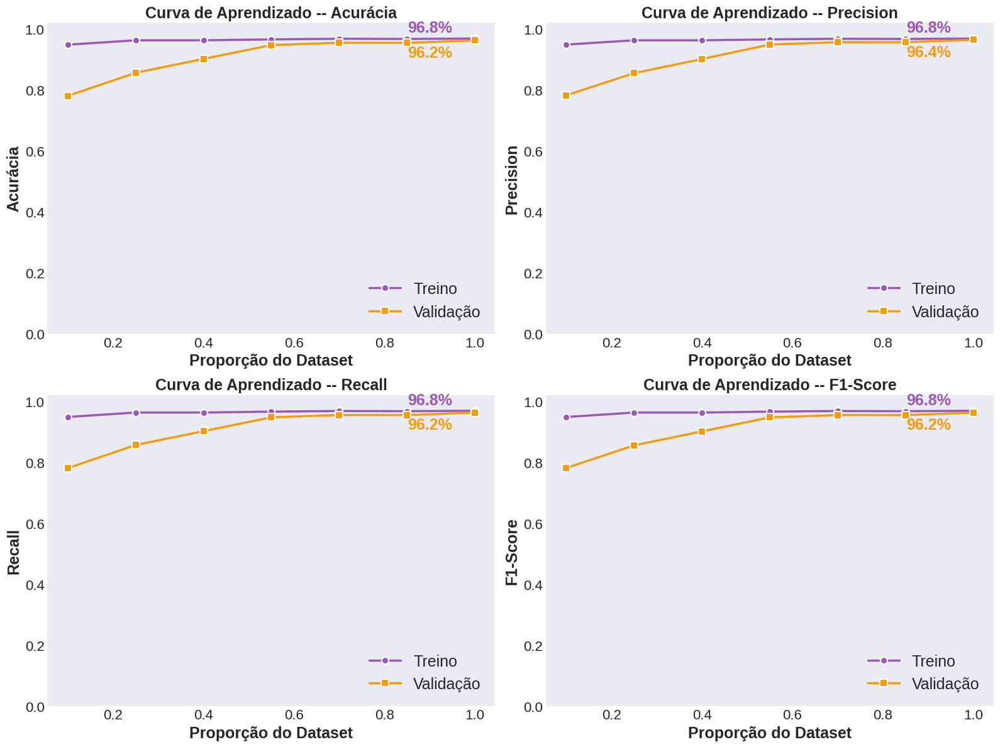

In [ ]:
print("\n" + "="*70)
print("3️⃣  XGBOOST (GRADIENT BOOSTING) - VERSÃO OTIMIZADA")
print("="*70)

start_time = time.time()

print("\n🔄 Treinando XGBoost...")
xgb_model.fit(
    X_train_features,
    y_train_indices,
    eval_set=[(X_val_features, y_val_indices)],
    verbose=False  # ← Sem verbose
)

# Predições
print("\n🔍 Gerando predições...")
xgb_train_pred = xgb_model.predict(X_train_features)
xgb_val_pred = xgb_model.predict(X_val_features)
xgb_test_pred = xgb_model.predict(X_test_features)

# Métricas - TREINO
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE TREINO")
print("="*70)

xgb_train_acc = accuracy_score(y_train_indices, xgb_train_pred)
xgb_train_precision = precision_score(y_train_indices, xgb_train_pred, average='weighted')
xgb_train_recall = recall_score(y_train_indices, xgb_train_pred, average='weighted')
xgb_train_f1 = f1_score(y_train_indices, xgb_train_pred, average='weighted')

print(f"   Acurácia Treino:   {xgb_train_acc*100:.2f}%")
print(f"   Precision Treino:  {xgb_train_precision*100:.2f}%")
print(f"   Recall Treino:     {xgb_train_recall*100:.2f}%")
print(f"   F1-Score Treino:   {xgb_train_f1*100:.2f}%")

# Métricas - VALIDAÇÃO
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE VALIDAÇÃO")
print("="*70)

xgb_val_acc = accuracy_score(y_val_indices, xgb_val_pred)
xgb_val_precision = precision_score(y_val_indices, xgb_val_pred, average='weighted')
xgb_val_recall = recall_score(y_val_indices, xgb_val_pred, average='weighted')
xgb_val_f1 = f1_score(y_val_indices, xgb_val_pred, average='weighted')

print(f"   Acurácia Validação:   {xgb_val_acc*100:.2f}%")
print(f"   Precision Validação:  {xgb_val_precision*100:.2f}%")
print(f"   Recall Validação:     {xgb_val_recall*100:.2f}%")
print(f"   F1-Score Validação:   {xgb_val_f1*100:.2f}%")

# Métricas - TESTE
print("\n" + "="*70)
print("📊 MÉTRICAS - CONJUNTO DE TESTE")
print("="*70)

xgb_test_acc = accuracy_score(y_test_indices, xgb_test_pred)
xgb_test_precision = precision_score(y_test_indices, xgb_test_pred, average='weighted')
xgb_test_recall = recall_score(y_test_indices, xgb_test_pred, average='weighted')
xgb_test_f1 = f1_score(y_test_indices, xgb_test_pred, average='weighted')

print(f"   Acurácia Teste:   {xgb_test_acc*100:.2f}%")
print(f"   Precision Teste:  {xgb_test_precision*100:.2f}%")
print(f"   Recall Teste:     {xgb_test_recall*100:.2f}%")
print(f"   F1-Score Teste:   {xgb_test_f1*100:.2f}%")

# Tempo de treinamento
training_time = time.time() - start_time

print(f"\n⏱️  Tempo de Treinamento: {training_time:.2f}s")

# Relatório de classificação detalhado
print("\n" + "="*70)
print("📋 RELATÓRIO DE CLASSIFICAÇÃO DETALHADO - CONJUNTO DE TESTE")
print("="*70)

class_names = ['FAIR', 'GOOD', 'POOR']
print(classification_report(y_test_indices, xgb_test_pred,
                           target_names=class_names, digits=4))

# ============================================================================
# SALVAR RESULTADOS
# ============================================================================

print("\n" + "="*70)
print("💾 SALVANDO RESULTADOS")
print("="*70 + "\n")

classical_models['XGBoost'] = xgb_model

# Definir diretório
DRIVE_DIR = '/content/Drive/MyDrive/Colab Notebooks/TCC2'
SAVE_DIR = os.path.join(DRIVE_DIR, 'XGBoost_saved')
os.makedirs(SAVE_DIR, exist_ok=True)

joblib.dump(
    scaler_features,
    os.path.join(
        SAVE_DIR,
        "hog_scaler.joblib"
    )
)

joblib.dump(
    pca,
    os.path.join(
        SAVE_DIR,
        "pca.joblib"
    )
)

# Criar dicionário com resultados
xgb_results = {
    'Modelo': 'XGBoost',
    'Train_Accuracy': xgb_train_acc,
    'Train_Precision': xgb_train_precision,
    'Train_Recall': xgb_train_recall,
    'Train_F1': xgb_train_f1,
    'Val_Accuracy': xgb_val_acc,
    'Val_Precision': xgb_val_precision,
    'Val_Recall': xgb_val_recall,
    'Val_F1': xgb_val_f1,
    'Test_Accuracy': xgb_test_acc,
    'Test_Precision': xgb_test_precision,
    'Test_Recall': xgb_test_recall,
    'Test_F1': xgb_test_f1,
    'Training_Time': training_time
}


# Salvar em CSV
csv_path = os.path.join(SAVE_DIR, 'xgb_metrics.csv')
df_svm = pd.DataFrame([xgb_results])
df_svm.to_csv(csv_path, index=False)
print(f"✅ CSV salvo: {csv_path}")

# Salvar em JSON
json_path = os.path.join(SAVE_DIR, 'xgb_metrics.json')
with open(json_path, 'w') as f:
    json.dump(xgb_results, f, indent=4)
print(f"✅ JSON salvo: {json_path}")

# Salvar em Pickle
pickle_path = os.path.join(SAVE_DIR, 'xgb_metrics.pkl')
with open(pickle_path, 'wb') as f:
    pickle.dump(xgb_results, f)
print(f"✅ Pickle salvo: {pickle_path}")

# Salvar modelo treinado
model_joblib_path = os.path.join(SAVE_DIR, 'xgb_model.joblib')
joblib.dump(xgb_model, model_joblib_path)
print(f"✅ Modelo (Joblib) salvo: {model_joblib_path}")

# Salvar modelo em Pickle também
model_pickle_path = os.path.join(SAVE_DIR, 'xgb_model.pkl')
with open(model_pickle_path, 'wb') as f:
    pickle.dump(xgb_model, f)
print(f"✅ Modelo (Pickle) salvo: {model_pickle_path}")

np.save(os.path.join(SAVE_DIR, "X_test_features.npy"), X_test_features)
np.save(os.path.join(SAVE_DIR, "y_test_indices.npy"), y_test_indices)

# Salvar metadados
metadata = {
    'data_salvamento': pd.Timestamp.now().isoformat(),
    'modelo': 'XGBoost',
    'configuracao': {
        'n_estimators': 100,
        'max_depth': 6,
        'learning_rate': 0.1,
        'objective': 'multi:softmax'
    },
    'metricas': list(xgb_results.keys()),
    'diretorio': SAVE_DIR
}

metadata_path = os.path.join(SAVE_DIR, 'metadata.json')
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=4)
print(f"✅ Metadados salvos: {metadata_path}")

print(f"\n📁 Diretório de salvamento: {SAVE_DIR}\n")

print("\n" + "="*70)
print("✅ XGBOOST - TREINAMENTO E SALVAMENTO CONCLUÍDO")
print("="*70)

# ============================================================================
# CURVAS DE APRENDIZADO - XGBOOST COM VALIDAÇÃO FIXA
# ============================================================================

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("\n" + "="*70)
print("📈 GERANDO CURVA DE APRENDIZADO - XGBOOST")
print("="*70)

print("\n🔎 Estratégia:")
print("   - Treina com proporções crescentes do conjunto de treino")
print("   - Seleciona subconjuntos estratificados")
print("   - Avalia sempre no mesmo conjunto de validação fixo")
print("   - Usa os hiperparâmetros do xgb_model final")
print("   - Não utiliza cross-validation interna")
print("   - O último ponto usa diretamente o modelo final já treinado\n")

curva_start = time.time()

train_sizes = np.linspace(0.1, 1.0, 7)

train_mean = {
    'accuracy': [],
    'precision': [],
    'recall': [],
    'f1': []
}

val_mean = {
    'accuracy': [],
    'precision': [],
    'recall': [],
    'f1': []
}

# ============================================================================
# Função de predição estável para XGBoost
# Especialmente útil quando booster='dart' ou early_stopping é usado
# ============================================================================

def predict_xgb_stable(model, X):
    try:
        if hasattr(model, "best_iteration") and model.best_iteration is not None:
            n_trees = model.best_iteration + 1
        else:
            n_trees = model.get_booster().num_boosted_rounds()

        return model.predict(
            X,
            iteration_range=(0, n_trees)
        )

    except Exception:
        return model.predict(X)


# ============================================================================
# Métricas finais do modelo já treinado
# Isso garante que o último ponto da curva seja igual ao resultado final
# ============================================================================

xgb_train_pred_final = predict_xgb_stable(
    xgb_model,
    X_train_features
)

xgb_val_pred_final = predict_xgb_stable(
    xgb_model,
    X_val_features
)

xgb_train_acc_final = accuracy_score(
    y_train_indices,
    xgb_train_pred_final
)

xgb_train_precision_final = precision_score(
    y_train_indices,
    xgb_train_pred_final,
    average='weighted',
    zero_division=0
)

xgb_train_recall_final = recall_score(
    y_train_indices,
    xgb_train_pred_final,
    average='weighted',
    zero_division=0
)

xgb_train_f1_final = f1_score(
    y_train_indices,
    xgb_train_pred_final,
    average='weighted',
    zero_division=0
)

xgb_val_acc_final = accuracy_score(
    y_val_indices,
    xgb_val_pred_final
)

xgb_val_precision_final = precision_score(
    y_val_indices,
    xgb_val_pred_final,
    average='weighted',
    zero_division=0
)

xgb_val_recall_final = recall_score(
    y_val_indices,
    xgb_val_pred_final,
    average='weighted',
    zero_division=0
)

xgb_val_f1_final = f1_score(
    y_val_indices,
    xgb_val_pred_final,
    average='weighted',
    zero_division=0
)


# ============================================================================
# Capturar hiperparâmetros do modelo final
# ============================================================================

xgb_params_curve = xgb_model.get_params()

xgb_params_curve["random_state"] = 42
xgb_params_curve["seed"] = 42
xgb_params_curve["n_jobs"] = -1
xgb_params_curve["verbosity"] = 0
xgb_params_curve["num_class"] = NUM_CLASSES

# Garante objetivo multiclasse
if xgb_params_curve.get("objective", None) is None:
    xgb_params_curve["objective"] = "multi:softprob"

# ============================================================================
# Loop das proporções de treinamento
# ============================================================================

for i, train_size in enumerate(train_sizes):

    print(
        f"  [{i+1}/{len(train_sizes)}] "
        f"Calculando para {train_size*100:.0f}% do treino...",
        end=" "
    )

    # ========================================================================
    # Último ponto: usar diretamente o modelo final já treinado
    # ========================================================================

    if train_size == 1.0:

        train_mean['accuracy'].append(xgb_train_acc_final)
        train_mean['precision'].append(xgb_train_precision_final)
        train_mean['recall'].append(xgb_train_recall_final)
        train_mean['f1'].append(xgb_train_f1_final)

        val_mean['accuracy'].append(xgb_val_acc_final)
        val_mean['precision'].append(xgb_val_precision_final)
        val_mean['recall'].append(xgb_val_recall_final)
        val_mean['f1'].append(xgb_val_f1_final)

        print("✓")
        continue

    # ========================================================================
    # Subconjunto estratificado para os demais pontos
    # ========================================================================

    sss = StratifiedShuffleSplit(
        n_splits=1,
        train_size=train_size,
        random_state=42
    )

    subset_idx, _ = next(
        sss.split(X_train_features, y_train_indices)
    )

    X_subset = X_train_features[subset_idx]
    y_subset = y_train_indices[subset_idx]

    # ========================================================================
    # Criar novo XGBoost com os mesmos parâmetros do modelo final
    # ========================================================================

    xgb_curve = xgb.XGBClassifier(
        **xgb_params_curve
    )

    # ========================================================================
    # Treinamento sem cross-validation
    # ========================================================================

    xgb_curve.fit(
        X_subset,
        y_subset,
        eval_set=[(X_val_features, y_val_indices)],
        verbose=False
    )

    # ========================================================================
    # Predições
    # ========================================================================

    y_train_pred = predict_xgb_stable(
        xgb_curve,
        X_subset
    )

    y_val_pred = predict_xgb_stable(
        xgb_curve,
        X_val_features
    )

    # ========================================================================
    # Métricas - Treino
    # ========================================================================

    train_mean['accuracy'].append(
        accuracy_score(y_subset, y_train_pred)
    )

    train_mean['precision'].append(
        precision_score(
            y_subset,
            y_train_pred,
            average='weighted',
            zero_division=0
        )
    )

    train_mean['recall'].append(
        recall_score(
            y_subset,
            y_train_pred,
            average='weighted',
            zero_division=0
        )
    )

    train_mean['f1'].append(
        f1_score(
            y_subset,
            y_train_pred,
            average='weighted',
            zero_division=0
        )
    )

    # ========================================================================
    # Métricas - Validação fixa
    # ========================================================================

    val_mean['accuracy'].append(
        accuracy_score(y_val_indices, y_val_pred)
    )

    val_mean['precision'].append(
        precision_score(
            y_val_indices,
            y_val_pred,
            average='weighted',
            zero_division=0
        )
    )

    val_mean['recall'].append(
        recall_score(
            y_val_indices,
            y_val_pred,
            average='weighted',
            zero_division=0
        )
    )

    val_mean['f1'].append(
        f1_score(
            y_val_indices,
            y_val_pred,
            average='weighted',
            zero_division=0
        )
    )

    print("✓")

curva_time = time.time() - curva_start

print(f"\n✅ Curva de aprendizado calculada em {curva_time:.1f}s")

# ============================================================================
# Converter para arrays
# ============================================================================

for metric in train_mean.keys():
    train_mean[metric] = np.array(train_mean[metric])
    val_mean[metric] = np.array(val_mean[metric])

# Std zerado apenas para manter compatibilidade com seu código de plot
train_std = {
    metric: np.zeros_like(train_mean[metric])
    for metric in train_mean.keys()
}

val_std = {
    metric: np.zeros_like(val_mean[metric])
    for metric in val_mean.keys()
}

# ============================================================================
# VISUALIZAÇÃO - 4 GRÁFICOS (Acurácia, Precision, Recall, F1)
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

color_train = '#9b59b6'  # Roxo
color_val = '#f39c12'    # Dourado/Laranja

metrics_info = [
    (axes[0, 0], 'accuracy', 'Acurácia'),
    (axes[0, 1], 'precision', 'Precision'),
    (axes[1, 0], 'recall', 'Recall'),
    (axes[1, 1], 'f1', 'F1-Score')
]

for ax, metric, title in metrics_info:
    # Plotar curvas
    ax.plot(train_sizes, train_mean[metric], 'o-', color=color_train, linewidth=2.5,
            markersize=8, label='Treino', markeredgewidth=1.5, markeredgecolor='white')
    ax.fill_between(train_sizes,
                    train_mean[metric] - train_std[metric],
                    train_mean[metric] + train_std[metric],
                    alpha=0.15, color=color_train)

    ax.plot(train_sizes, val_mean[metric], 's-', color=color_val, linewidth=2.5,
            markersize=8, label='Validação', markeredgewidth=1.5, markeredgecolor='white')
    ax.fill_between(train_sizes,
                    val_mean[metric] - val_std[metric],
                    val_mean[metric] + val_std[metric],
                    alpha=0.15, color=color_val)

    # Formatação
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_xlabel('Proporção do Dataset', fontweight='bold', fontsize=18)
    ax.set_ylabel(title, fontweight='bold', fontsize=18)
    ax.set_title(f'Curva de Aprendizado -- {title}', fontweight='bold', fontsize=18)
    ax.set_ylim([0, 1.02])
    ax.legend(loc='lower right', fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=16)

    # Valores finais
    ax.text(0.95, train_mean[metric][-1] + 0.01, f'{train_mean[metric][-1]*100:.1f}%',
            ha='right', va='bottom', fontsize=18, fontweight='bold', color=color_train)
    ax.text(0.95, val_mean[metric][-1] - 0.015, f'{val_mean[metric][-1]*100:.1f}%',
            ha='right', va='top', fontsize=18, fontweight='bold', color=color_val)


plt.tight_layout()

print(f"""
📊 RESUMO:
   ✅ Modelo treinado
   ✅ Curvas de aprendizado geradas
   ✅ Tudo salvo no Google Drive

📁 Localização:
   {SAVE_DIR}
""")

## 15. Gráficos comparativos


MÉTRICAS CONSOLIDADAS PARA PLOT
           Modelo   Accuracy  Precision     Recall         F1
0   Random Forest  89.895470  89.879783  89.895470  89.880954
1             SVM  95.121951  95.297240  95.121951  95.106761
2         XGBoost  90.243902  90.994076  90.243902  90.073519
3     InceptionV3  97.560976  97.584993  97.560976  97.565416
4     DenseNet121  94.076655  94.584272  94.076655  94.043365
5     MobileNetV2  97.210000  97.270000  97.210000  97.210000
6        ResNet50  96.860000  96.880000  96.860000  96.870000
7  EfficientNetB0  74.220000  76.760000  74.220000  72.780000


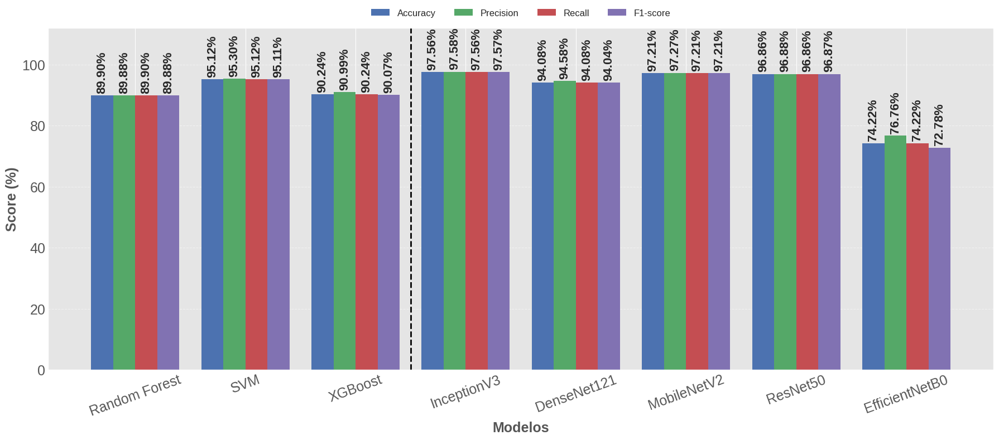


✅ Gráfico salvo em: /content/Drive/MyDrive/Colab Notebooks/TCC2/results/comparison_all_metrics.png


In [ ]:
PROJECT_PATH = "/content/Drive/MyDrive/Colab Notebooks/TCC2/"

# Caminhos
RF_PATH = os.path.join(PROJECT_PATH, "random_forest_saved")
SVM_PATH = os.path.join(PROJECT_PATH, "SVM_saved")
XGB_PATH = os.path.join(PROJECT_PATH, "XGBoost_saved")
CNN_PATH = os.path.join(PROJECT_PATH, "results")

OUTPUT_PATH = os.path.join(PROJECT_PATH, "results")
os.makedirs(OUTPUT_PATH, exist_ok=True)

# =====================================================
# Funções auxiliares
# =====================================================

def parse_metric(value):
    """
    Converte métricas salvas como:
    - 0.92
    - "0.92"
    - "0,92"
    - "92.5"
    - "92,5"
    para float.
    """

    if pd.isna(value):
        return np.nan

    value = str(value).strip()
    value = value.replace("%", "")
    value = value.replace(",", ".")

    return float(value)


def normalize_metric(value):
    """
    Se a métrica estiver entre 0 e 1, converte para percentual.
    Se já estiver em percentual, mantém.
    """

    value = parse_metric(value)

    if value <= 1:
        return value * 100

    return value


# =====================================================
# Função para ler métricas dos modelos clássicos
# =====================================================

def read_classic_metrics(csv_file, model_name):

    df = pd.read_csv(csv_file)

    # Caso o CSV possua duas colunas: Métrica | Valor
    if df.shape[1] == 2:

        metrics = dict(zip(df.iloc[:, 0], df.iloc[:, 1]))

        return {
            "Modelo": model_name,
            "Accuracy": metrics.get("Test_Accuracy", metrics.get("Accuracy")),
            "Precision": metrics.get("Test_Precision", metrics.get("Precision")),
            "Recall": metrics.get("Test_Recall", metrics.get("Recall")),
            "F1": metrics.get("Test_F1", metrics.get("F1-Score", metrics.get("F1")))
        }

    # Caso já esteja em formato tabular
    else:

        row = df.iloc[0]

        return {
            "Modelo": model_name,
            "Accuracy": row["Test_Accuracy"],
            "Precision": row["Test_Precision"],
            "Recall": row["Test_Recall"],
            "F1": row["Test_F1"]
        }


# =====================================================
# Modelos clássicos
# =====================================================

results = []

results.append(
    read_classic_metrics(
        os.path.join(RF_PATH, "random_forest_metrics.csv"),
        "Random Forest"
    )
)

results.append(
    read_classic_metrics(
        os.path.join(SVM_PATH, "svm_metrics.csv"),
        "SVM"
    )
)

results.append(
    read_classic_metrics(
        os.path.join(XGB_PATH, "xgb_metrics.csv"),
        "XGBoost"
    )
)

# =====================================================
# CNNs
# =====================================================

cnn = pd.read_csv(
    os.path.join(CNN_PATH, "models_comparison.csv"),
    dtype=str
)

for _, row in cnn.iterrows():

    results.append({
        "Modelo": row["Modelo"],
        "Accuracy": row["Accuracy"],
        "Precision": row["Precision"],
        "Recall": row["Recall"],
        "F1": row["F1-Score"]
    })


# =====================================================
# DataFrame final
# =====================================================

metrics_df = pd.DataFrame(results)

# Converter todas as métricas para percentual corretamente
for col in ["Accuracy", "Precision", "Recall", "F1"]:
    metrics_df[col] = metrics_df[col].apply(normalize_metric)

print("\n" + "="*70)
print("MÉTRICAS CONSOLIDADAS PARA PLOT")
print("="*70)
print(metrics_df)
print("="*70)

# =====================================================
# Plot
# =====================================================

plt.style.use("ggplot")

fig, ax = plt.subplots(figsize=(18, 8))

x = np.arange(len(metrics_df))
width = 0.20

colors = {
    "Accuracy": "#4C72B0",
    "Precision": "#55A868",
    "Recall": "#C44E52",
    "F1": "#8172B2"
}

bars_acc = ax.bar(
    x - 1.5 * width,
    metrics_df["Accuracy"],
    width,
    label="Accuracy",
    color=colors["Accuracy"]
)

bars_pre = ax.bar(
    x - 0.5 * width,
    metrics_df["Precision"],
    width,
    label="Precision",
    color=colors["Precision"]
)

bars_rec = ax.bar(
    x + 0.5 * width,
    metrics_df["Recall"],
    width,
    label="Recall",
    color=colors["Recall"]
)

bars_f1 = ax.bar(
    x + 1.5 * width,
    metrics_df["F1"],
    width,
    label="F1-score",
    color=colors["F1"]
)

# =====================================================
# Rótulos das barras
# =====================================================

for bars in [bars_acc, bars_pre, bars_rec, bars_f1]:

    labels = ax.bar_label(
        bars,
        labels=[f"{bar.get_height():.2f}%" for bar in bars],
        padding=3,
        fontsize=16,
        fontweight="bold"
    )

    for label in labels:
        label.set_rotation(90)
        label.set_va("bottom")
        label.set_ha("center")

# =====================================================
# Linha separando modelos clássicos e CNNs
# =====================================================

ax.axvline(
    x=2.5,
    color="black",
    linestyle="--",
    linewidth=2
)

# =====================================================
# Configurações dos eixos
# =====================================================

ax.set_ylim(0, 112)

ax.set_ylabel(
    "Score (%)",
    fontsize=18,
    fontweight="bold"
)

ax.set_xlabel(
    "Modelos",
    fontsize=18,
    fontweight="bold"
)

ax.set_xticks(x)

ax.set_xticklabels(
    metrics_df["Modelo"],
    rotation=20,
    fontsize=18
)

ax.tick_params(axis="y", labelsize=18)

# =====================================================
# Legenda
# =====================================================

ax.legend(
    fontsize=12,
    ncol=4,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.08)
)

# =====================================================
# Grade
# =====================================================

ax.grid(
    axis="y",
    linestyle="--",
    alpha=0.5
)

ax.set_axisbelow(True)

plt.tight_layout()

# =====================================================
# Salvar figura
# =====================================================

graph_path = os.path.join(
    OUTPUT_PATH,
    "comparison_all_metrics.png"
)

plt.savefig(
    graph_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(f"\n✅ Gráfico salvo em: {graph_path}")

Projeto: /content/Drive/MyDrive/Colab Notebooks/TCC2
Teste ORIGINAL: /content/Drive/MyDrive/Colab Notebooks/TCC2/FotosTCC/test
Imagens: 287
Classes: ['fair', 'good', 'poor']
Imagem final: 224x224
Repetições: 3
Warm-up: 5 imagens
TensorFlow: 2.20.0
CPU/ambiente: x86_64

RANDOM FOREST
Modelo: random_forest_model.joblib
Scaler: hog_scaler.joblib
PCA: pca.joblib
HOG: 6084 features
Após PCA: 415 features
Variância explicada PCA: 85.02%
✅ Pipeline dimensional validado.
FPS: 10.82
Latência média: 92.43 ms
Latência P95: 143.97 ms
Tempo modelo: 44.090 ms
Tempo HOG: 10.713 ms
Tempo PCA: 5.021 ms
Tamanho pipeline: 11.90 MB
Acurácia de sanidade: 84.67%

SVM
Modelo: svm_model.joblib
Scaler: hog_scaler.joblib
PCA: pca.joblib
HOG: 6084 features
Após PCA: 641 features
Variância explicada PCA: 90.00%
✅ Pipeline dimensional validado.
FPS: 21.23
Latência média: 47.11 ms
Latência P95: 84.16 ms
Tempo modelo: 2.093 ms
Tempo HOG: 10.231 ms
Tempo PCA: 6.587 ms
Tamanho pipeline: 28.02 MB
Acurácia de sanidade: 

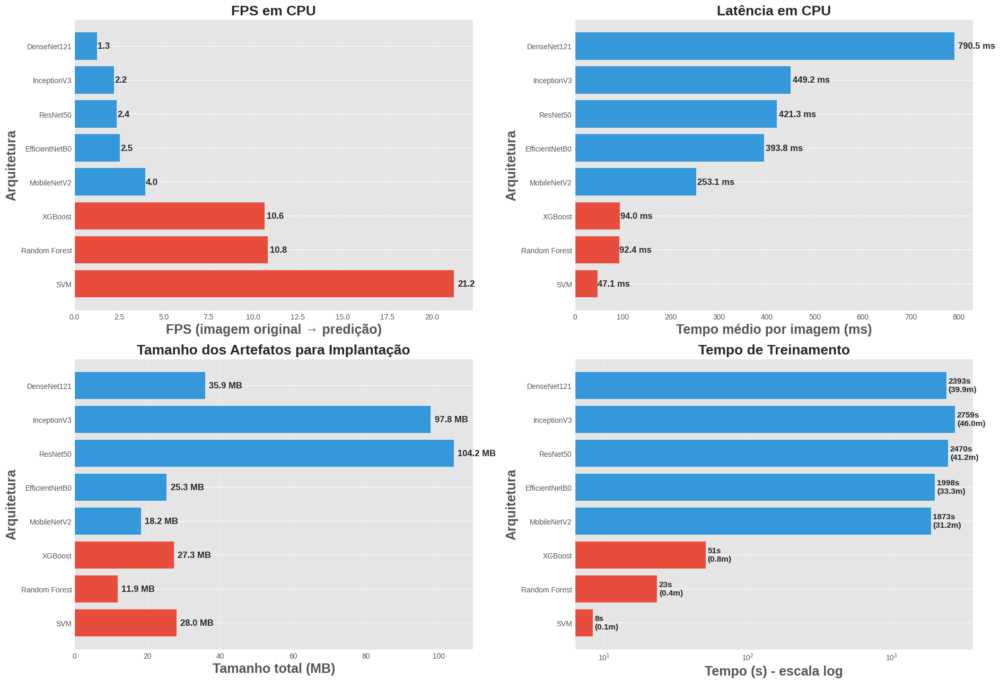


📊 Gráfico principal salvo em:
/content/Drive/MyDrive/Colab Notebooks/TCC2/results/embedded_cpu_end_to_end_visualization.png


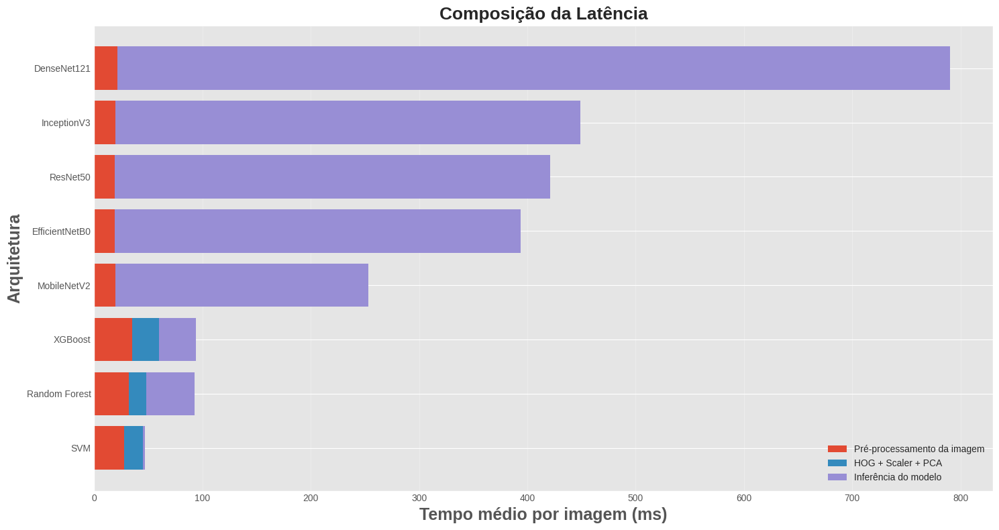


📊 Breakdown de latência salvo em:
/content/Drive/MyDrive/Colab Notebooks/TCC2/results/embedded_cpu_end_to_end_breakdown.png

BENCHMARK CONCLUÍDO


In [ ]:
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

# Tentar garantir execução apenas em CPU.
# Se o TensorFlow já tiver sido inicializado em outra célula,
# o tf.device("/CPU:0") usado abaixo continua forçando a inferência em CPU.
try:
    tf.config.set_visible_devices([], "GPU")
except Exception:
    pass


# ============================================================
# 1. REFERENCIA GOOGLE DRIVE
# ============================================================

DRIVE_ROOT = "/content/Drive"

# ============================================================
# 2. CAMINHOS
# ============================================================

PROJECT_PATH = Path("/content/Drive/MyDrive/Colab Notebooks/TCC2")

RAW_TEST_PATH = PROJECT_PATH / "FotosTCC" / "test"
DATASET_FINAL_PATH = PROJECT_PATH / "dataset_final"
DATASET_INFO_PATH = DATASET_FINAL_PATH / "dataset_info.json"

RF_PATH = PROJECT_PATH / "random_forest_saved"
SVM_PATH = PROJECT_PATH / "SVM_saved"
XGB_PATH = PROJECT_PATH / "XGBoost_saved"

MODELS_PATH = PROJECT_PATH / "models"
RESULTS_PATH = PROJECT_PATH / "results"
RESULTS_PATH.mkdir(parents=True, exist_ok=True)

if not PROJECT_PATH.exists():
    raise FileNotFoundError(f"Projeto não encontrado: {PROJECT_PATH}")

if not RAW_TEST_PATH.exists():
    raise FileNotFoundError(
        f"Conjunto de TESTE ORIGINAL não encontrado:\n{RAW_TEST_PATH}\n\n"
        "Não deve ser usada a pasta dataset_final/test, "
        "pois ela já contém imagens pré-processadas."
    )


# ============================================================
# 3. CONFIGURAÇÃO
# ============================================================

# 3 passagens dão uma média mais estável.
# Para teste rápido, pode usar 1.
N_REPEATS = 3

# Warm-up não entra nas métricas.
N_WARMUP_IMAGES = 5

# Seed usada apenas para manter comportamento reproduzível
SEED = 42
np.random.seed(SEED)

IMAGE_EXTENSIONS = {
    ".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"
}


# ============================================================
# 4. CARREGAR CONFIGURAÇÕES DO DATASET
# ============================================================

dataset_info = {}

if DATASET_INFO_PATH.exists():
    with open(DATASET_INFO_PATH, "r", encoding="utf-8") as f:
        dataset_info = json.load(f)

# Classes
CLASSES = dataset_info.get("classes", ["fair", "good", "poor"])
CLASS_TO_INDEX = {name: idx for idx, name in enumerate(CLASSES)}

# Tamanho de imagem
size_text = str(dataset_info.get("tamanho_imagem", "224x224")).lower()

try:
    IMG_SIZE = int(size_text.split("x")[0])
except Exception:
    IMG_SIZE = 224

# Parâmetros que foram registrados no dataset_info.json
prep_meta = dataset_info.get("preprocessamento", {})

noise_meta = prep_meta.get("reducao_ruido", {})
crop_meta = prep_meta.get("auto_crop", {})
clahe_meta = prep_meta.get("ajuste_iluminacao", {})

APLICAR_REDUCAO_RUIDO = bool(noise_meta.get("aplicado", True))
FORCA_REDUCAO_RUIDO = int(noise_meta.get("forca", 7))

APLICAR_AUTO_CROP = bool(crop_meta.get("aplicado", True))
MARGEM_CROP = int(crop_meta.get("margem", 5))

APLICAR_CLAHE = bool(clahe_meta.get("aplicado", True))
CLAHE_CLIP_LIMIT = float(clahe_meta.get("clip_limit", 2.0))
CLAHE_GRID_SIZE = int(clahe_meta.get("grid_size", 8))

# Estes valores não foram parametrizados no JSON original,
# mas são exatamente os usados pela classe ImagePreprocessor do notebook.
BILATERAL_SIGMA_COLOR = 75
BILATERAL_SIGMA_SPACE = 75

# IMPORTANTE:
# processar() usa auto_crop_smart(), cujo critério real é std < 20.
# O THRESHOLD_BORDA=15 do notebook pertence ao método auto_crop()
# e NÃO é usado pelo auto_crop_smart().
AUTO_CROP_STD_THRESHOLD = 20


# ============================================================
# 5. PRÉ-PROCESSADOR IDÊNTICO AO NOTEBOOK
# ============================================================

class ImagePreprocessorEmbedded:
    """
    Reproduz o pipeline efetivamente utilizado na geração do dataset_final:

    carregar
      -> filtro bilateral
      -> auto_crop_smart
      -> CLAHE
      -> resize mantendo proporção + padding preto
    """

    def __init__(
        self,
        img_size=224,
        aplicar_reducao_ruido=True,
        forca_ruido=7,
        aplicar_auto_crop=True,
        margem_crop=5,
        aplicar_clahe=True,
        clahe_clip=2.0,
        clahe_grid=8,
        auto_crop_std_threshold=20,
    ):
        self.img_size = int(img_size)

        self.aplicar_reducao_ruido = bool(aplicar_reducao_ruido)
        self.forca_ruido = int(forca_ruido)

        self.aplicar_auto_crop = bool(aplicar_auto_crop)
        self.margem_crop = int(margem_crop)
        self.auto_crop_std_threshold = float(auto_crop_std_threshold)

        self.aplicar_clahe = bool(aplicar_clahe)
        self.clahe_clip = float(clahe_clip)
        self.clahe_grid = int(clahe_grid)

        if self.aplicar_clahe:
            self.clahe = cv2.createCLAHE(
                clipLimit=self.clahe_clip,
                tileGridSize=(self.clahe_grid, self.clahe_grid)
            )

    def carregar_imagem(self, img_path):
        img = cv2.imread(str(img_path))

        if img is None:
            pil_img = Image.open(img_path).convert("RGB")
            img = cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)

        return img

    def reduzir_ruido(self, img):
        return cv2.bilateralFilter(
            img,
            d=self.forca_ruido,
            sigmaColor=BILATERAL_SIGMA_COLOR,
            sigmaSpace=BILATERAL_SIGMA_SPACE
        )

    def auto_crop_smart(self, img):
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        h, w = gray.shape

        def is_border_uniform(strip):
            return np.std(strip) < self.auto_crop_std_threshold

        top, bottom, left, right = 0, h, 0, w

        for i in range(min(h // 4, 50)):
            if is_border_uniform(gray[i, :]):
                top = i + 1
            else:
                break

        for i in range(h - 1, max(h * 3 // 4, h - 50), -1):
            if is_border_uniform(gray[i, :]):
                bottom = i
            else:
                break

        for i in range(min(w // 4, 50)):
            if is_border_uniform(gray[:, i]):
                left = i + 1
            else:
                break

        for i in range(w - 1, max(w * 3 // 4, w - 50), -1):
            if is_border_uniform(gray[:, i]):
                right = i
            else:
                break

        top = max(0, top - self.margem_crop)
        bottom = min(h, bottom + self.margem_crop)
        left = max(0, left - self.margem_crop)
        right = min(w, right + self.margem_crop)

        if (right - left) < w * 0.5 or (bottom - top) < h * 0.5:
            return img

        return img[top:bottom, left:right]

    def ajustar_iluminacao_clahe(self, img):
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)

        l_clahe = self.clahe.apply(l)

        lab_clahe = cv2.merge([l_clahe, a, b])
        return cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

    def redimensionar_com_padding(self, img):
        h, w = img.shape[:2]

        scale = min(self.img_size / w, self.img_size / h)

        new_w = int(w * scale)
        new_h = int(h * scale)

        img_resized = cv2.resize(
            img,
            (new_w, new_h),
            interpolation=cv2.INTER_LANCZOS4
        )

        img_padded = np.zeros(
            (self.img_size, self.img_size, 3),
            dtype=np.uint8
        )

        x_offset = (self.img_size - new_w) // 2
        y_offset = (self.img_size - new_h) // 2

        img_padded[
            y_offset:y_offset + new_h,
            x_offset:x_offset + new_w
        ] = img_resized

        return img_padded

    def processar_com_tempos(self, img_path):
        """
        Retorna imagem BGR 224x224 e tempo de cada etapa em ms.
        """

        tempos = {}

        t0 = time.perf_counter()

        # Leitura
        s = time.perf_counter()
        img = self.carregar_imagem(img_path)
        tempos["Tempo_leitura_ms"] = (time.perf_counter() - s) * 1000

        # Filtro bilateral
        s = time.perf_counter()
        if self.aplicar_reducao_ruido:
            img = self.reduzir_ruido(img)
        tempos["Tempo_ruido_ms"] = (time.perf_counter() - s) * 1000

        # Auto-crop smart
        s = time.perf_counter()
        if self.aplicar_auto_crop:
            img = self.auto_crop_smart(img)
        tempos["Tempo_crop_ms"] = (time.perf_counter() - s) * 1000

        # CLAHE
        s = time.perf_counter()
        if self.aplicar_clahe:
            img = self.ajustar_iluminacao_clahe(img)
        tempos["Tempo_clahe_ms"] = (time.perf_counter() - s) * 1000

        # Resize + padding
        s = time.perf_counter()
        img = self.redimensionar_com_padding(img)
        tempos["Tempo_resize_padding_ms"] = (time.perf_counter() - s) * 1000

        tempos["Tempo_preprocessamento_imagem_ms"] = (
            time.perf_counter() - t0
        ) * 1000

        return img, tempos


preprocessor = ImagePreprocessorEmbedded(
    img_size=IMG_SIZE,
    aplicar_reducao_ruido=APLICAR_REDUCAO_RUIDO,
    forca_ruido=FORCA_REDUCAO_RUIDO,
    aplicar_auto_crop=APLICAR_AUTO_CROP,
    margem_crop=MARGEM_CROP,
    aplicar_clahe=APLICAR_CLAHE,
    clahe_clip=CLAHE_CLIP_LIMIT,
    clahe_grid=CLAHE_GRID_SIZE,
    auto_crop_std_threshold=AUTO_CROP_STD_THRESHOLD,
)


# ============================================================
# 6. COLETAR IMAGENS ORIGINAIS DO TESTE
# ============================================================

samples = []

for class_name in CLASSES:
    class_folder = RAW_TEST_PATH / class_name

    if not class_folder.exists():
        raise FileNotFoundError(
            f"Pasta da classe não encontrada: {class_folder}"
        )

    class_files = sorted([
        p for p in class_folder.rglob("*")
        if p.is_file() and p.suffix.lower() in IMAGE_EXTENSIONS
    ])

    for p in class_files:
        samples.append({
            "path": p,
            "class_name": class_name,
            "y_true": CLASS_TO_INDEX[class_name],
        })

if not samples:
    raise RuntimeError(f"Nenhuma imagem encontrada em {RAW_TEST_PATH}")


print(f"Projeto: {PROJECT_PATH}")
print(f"Teste ORIGINAL: {RAW_TEST_PATH}")
print(f"Imagens: {len(samples)}")
print(f"Classes: {CLASSES}")
print(f"Imagem final: {IMG_SIZE}x{IMG_SIZE}")
print(f"Repetições: {N_REPEATS}")
print(f"Warm-up: {min(N_WARMUP_IMAGES, len(samples))} imagens")
print(f"TensorFlow: {tf.__version__}")
print(f"CPU/ambiente: {platform.processor() or platform.machine()}")
print("=" * 80)


# ============================================================
# 7. FUNÇÕES AUXILIARES
# ============================================================

def get_file_size_mb(path):
    path = Path(path)

    if path.exists() and path.is_file():
        return path.stat().st_size / (1024 ** 2)

    return np.nan


def read_training_time(csv_path):
    """
    Lê Training_Time ou Tempo_treino_s.
    """
    if csv_path is None:
        return np.nan

    csv_path = Path(csv_path)

    if not csv_path.exists():
        return np.nan

    try:
        df = pd.read_csv(csv_path, dtype=str, skipinitialspace=True)

        if df.empty:
            return np.nan

        for col in [
            "Training_Time",
            "Tempo_treino_s",
            "training_time",
            "tempo_treino_s",
        ]:
            if col in df.columns:
                value = str(df.iloc[0][col]).strip()
                value = value.replace('"', "").replace("'", "")
                value = value.replace(",", ".")
                return float(value)

        if df.shape[1] == 2:
            mapping = dict(zip(df.iloc[:, 0], df.iloc[:, 1]))

            for key in [
                "Training_Time",
                "Tempo_treino_s",
                "training_time",
                "tempo_treino_s",
            ]:
                if key in mapping:
                    value = str(mapping[key]).strip().replace(",", ".")
                    return float(value)

    except Exception as e:
        print(f"⚠️ Tempo de treinamento não lido em {csv_path.name}: {e}")

    return np.nan


def read_cnn_training_time(model_name):
    comparison_path = RESULTS_PATH / "models_comparison.csv"

    if not comparison_path.exists():
        return np.nan

    try:
        df = pd.read_csv(
            comparison_path,
            dtype=str,
            skipinitialspace=True
        )

        if "Modelo" not in df.columns or "Training_Time" not in df.columns:
            return np.nan

        row = df[
            df["Modelo"].astype(str).str.strip() == model_name
        ]

        if row.empty:
            return np.nan

        value = str(row.iloc[0]["Training_Time"]).strip()
        value = value.replace(",", ".")
        return float(value)

    except Exception as e:
        print(f"⚠️ Tempo CNN não lido para {model_name}: {e}")
        return np.nan


def mean_or_nan(values):
    return float(np.mean(values)) if len(values) else np.nan


def median_or_nan(values):
    return float(np.median(values)) if len(values) else np.nan


def p95_or_nan(values):
    return float(np.percentile(values, 95)) if len(values) else np.nan


def validate_file(path, description):
    path = Path(path)

    if not path.exists():
        raise FileNotFoundError(
            f"\n❌ {description} não encontrado:\n{path}"
        )

    return path


# ============================================================
# 8. HOG - EXATAMENTE COMO NO NOTEBOOK
# ============================================================

def image_bgr_to_normalized_rgb(img_bgr):
    """
    Reproduz a entrada que o ImageDataGenerator fornecia:
    RGB float32 em [0,1].
    """
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb.astype(np.float32) / 255.0


def extract_hog_single(img_rgb_normalized):
    """
    HOG usado nos 3 modelos clássicos.
    """
    gray = rgb2gray(img_rgb_normalized)

    features = hog(
        gray,
        orientations=9,
        pixels_per_cell=(16, 16),
        cells_per_block=(2, 2),
        block_norm="L2-Hys",
        visualize=False
    )

    return np.asarray(features, dtype=np.float64).reshape(1, -1)


# ============================================================
# 9. CONFIGURAÇÃO DOS MODELOS CLÁSSICOS
# ============================================================

CLASSIC_MODELS = [
    {
        "Arquitetura": "Random Forest",
        "folder": RF_PATH,
        "model_path": RF_PATH / "random_forest_model.joblib",
        "scaler_path": RF_PATH / "hog_scaler.joblib",
        "pca_path": RF_PATH / "pca.joblib",
        "metrics_path": RF_PATH / "random_forest_metrics.csv",
    },
    {
        "Arquitetura": "SVM",
        "folder": SVM_PATH,
        "model_path": SVM_PATH / "svm_model.joblib",
        # Apenas o scaler HOG.
        # NÃO existe/não é necessário um segundo scaler após o PCA.
        "scaler_path": SVM_PATH / "hog_scaler.joblib",
        "pca_path": SVM_PATH / "pca.joblib",
        "metrics_path": SVM_PATH / "svm_metrics.csv",
    },
    {
        "Arquitetura": "XGBoost",
        "folder": XGB_PATH,
        "model_path": XGB_PATH / "xgb_model.joblib",
        "scaler_path": XGB_PATH / "hog_scaler.joblib",
        "pca_path": XGB_PATH / "pca.joblib",
        "metrics_path": XGB_PATH / "xgb_metrics.csv",
    },
]


# ============================================================
# 10. COMPLEXIDADE E TAMANHO DOS CLÁSSICOS
# ============================================================

def classic_complexity(model, model_name):
    """
    Métricas estruturais diferentes por arquitetura.
    Não representam a mesma grandeza matemática que count_params das CNNs.
    """

    if model_name == "Random Forest":
        nodes = sum(est.tree_.node_count for est in model.estimators_)
        return nodes / 1e6, "nós das árvores"

    if model_name == "SVM":
        value = model.support_vectors_.shape[0] * model.support_vectors_.shape[1]
        return value / 1e6, "vetores de suporte × features"

    if model_name == "XGBoost":
        try:
            tree_df = model.get_booster().trees_to_dataframe()
            return len(tree_df) / 1e6, "linhas/nós das árvores"
        except Exception:
            return np.nan, "estrutura das árvores"

    return np.nan, "n/a"


# ============================================================
# 11. MODELO CLÁSSICO
# ============================================================

def benchmark_classic(info):
    nome = info["Arquitetura"]

    model_path = validate_file(info["model_path"], f"Modelo {nome}")
    scaler_path = validate_file(info["scaler_path"], f"Scaler HOG {nome}")
    pca_path = validate_file(info["pca_path"], f"PCA {nome}")

    print("\n" + "=" * 80)
    print(f"{nome.upper()}")
    print("=" * 80)

    model = joblib.load(model_path)
    scaler = joblib.load(scaler_path)
    pca = joblib.load(pca_path)

    # --------------------------------------------------------
    # Validação dimensional antes do benchmark
    # --------------------------------------------------------
    img_check, _ = preprocessor.processar_com_tempos(samples[0]["path"])
    rgb_check = image_bgr_to_normalized_rgb(img_check)
    hog_check = extract_hog_single(rgb_check)

    if hasattr(scaler, "n_features_in_"):
        if hog_check.shape[1] != scaler.n_features_in_:
            raise ValueError(
                f"\n❌ HOG incompatível no {nome}:\n"
                f"HOG atual = {hog_check.shape[1]} features\n"
                f"Scaler espera = {scaler.n_features_in_}\n"
            )

    scaled_check = scaler.transform(hog_check)
    pca_check = pca.transform(scaled_check)

    expected_model_features = getattr(model, "n_features_in_", None)

    if expected_model_features is not None:
        if pca_check.shape[1] != expected_model_features:
            raise ValueError(
                f"\n❌ PCA incompatível no {nome}:\n"
                f"PCA carregado gera = {pca_check.shape[1]} features\n"
                f"Modelo espera = {expected_model_features}\n"
            )

    explained = np.nan

    if hasattr(pca, "explained_variance_ratio_"):
        explained = float(np.sum(pca.explained_variance_ratio_) * 100)

    print(f"Modelo: {model_path.name}")
    print(f"Scaler: {scaler_path.name}")
    print(f"PCA: {pca_path.name}")
    print(f"HOG: {hog_check.shape[1]} features")
    print(f"Após PCA: {pca_check.shape[1]} features")

    if not np.isnan(explained):
        print(f"Variância explicada PCA: {explained:.2f}%")

    print("✅ Pipeline dimensional validado.")

    # --------------------------------------------------------
    # Warm-up
    # --------------------------------------------------------
    for sample in samples[:min(N_WARMUP_IMAGES, len(samples))]:
        img, _ = preprocessor.processar_com_tempos(sample["path"])
        rgb = image_bgr_to_normalized_rgb(img)
        x = extract_hog_single(rgb)
        x = scaler.transform(x)
        x = pca.transform(x)
        _ = model.predict(x)

    # --------------------------------------------------------
    # Benchmark
    # --------------------------------------------------------
    detailed_rows = []
    predictions_first_pass = []

    for rep in range(1, N_REPEATS + 1):

        for sample in samples:

            total_start = time.perf_counter()

            # Pré-processamento da imagem original
            img, stage_times = preprocessor.processar_com_tempos(sample["path"])

            # BGR -> RGB + normalização /255
            s = time.perf_counter()
            rgb = image_bgr_to_normalized_rgb(img)
            tempo_norm = (time.perf_counter() - s) * 1000

            # Grayscale + HOG
            s = time.perf_counter()
            x = extract_hog_single(rgb)
            tempo_hog = (time.perf_counter() - s) * 1000

            # Scaler HOG
            s = time.perf_counter()
            x = scaler.transform(x)
            tempo_scaler = (time.perf_counter() - s) * 1000

            # PCA específico do modelo
            s = time.perf_counter()
            x = pca.transform(x)
            tempo_pca = (time.perf_counter() - s) * 1000

            # Classificador
            s = time.perf_counter()
            pred = model.predict(x)
            tempo_modelo = (time.perf_counter() - s) * 1000

            total_ms = (time.perf_counter() - total_start) * 1000

            pred_idx = int(np.asarray(pred).ravel()[0])

            if rep == 1:
                predictions_first_pass.append(pred_idx)

            row = {
                "Arquitetura": nome,
                "Tipo": "Clássico",
                "Repeticao": rep,
                "Arquivo": str(sample["path"]),
                "Classe_real": sample["class_name"],
                "y_true": sample["y_true"],
                "y_pred": pred_idx,
                **stage_times,
                "Tempo_rgb_normalizacao_ms": tempo_norm,
                "Tempo_hog_ms": tempo_hog,
                "Tempo_scaler_ms": tempo_scaler,
                "Tempo_pca_ms": tempo_pca,
                "Tempo_modelo_ms": tempo_modelo,
                "Tempo_total_ms": total_ms,
            }

            detailed_rows.append(row)

    df_detail = pd.DataFrame(detailed_rows)

    latencies = df_detail["Tempo_total_ms"].to_numpy(dtype=float)

    y_true = np.array([s["y_true"] for s in samples], dtype=int)
    y_pred = np.array(predictions_first_pass, dtype=int)

    accuracy_sanity = float(np.mean(y_true == y_pred))

    complexity_m, complexity_type = classic_complexity(model, nome)

    model_size_mb = get_file_size_mb(model_path)
    scaler_size_mb = get_file_size_mb(scaler_path)
    pca_size_mb = get_file_size_mb(pca_path)

    deployment_size_mb = model_size_mb + scaler_size_mb + pca_size_mb

    training_time = read_training_time(info["metrics_path"])

    summary = {
        "Arquitetura": nome,
        "Tipo": "Clássico",

        "FPS": 1000.0 / np.mean(latencies),
        "Latencia_media_ms": float(np.mean(latencies)),
        "Latencia_mediana_ms": float(np.median(latencies)),
        "Latencia_p95_ms": float(np.percentile(latencies, 95)),

        "Tempo_leitura_ms": df_detail["Tempo_leitura_ms"].mean(),
        "Tempo_ruido_ms": df_detail["Tempo_ruido_ms"].mean(),
        "Tempo_crop_ms": df_detail["Tempo_crop_ms"].mean(),
        "Tempo_clahe_ms": df_detail["Tempo_clahe_ms"].mean(),
        "Tempo_resize_padding_ms": df_detail["Tempo_resize_padding_ms"].mean(),
        "Tempo_preprocessamento_imagem_ms":
            df_detail["Tempo_preprocessamento_imagem_ms"].mean(),

        "Tempo_rgb_normalizacao_ms":
            df_detail["Tempo_rgb_normalizacao_ms"].mean(),

        "Tempo_hog_ms": df_detail["Tempo_hog_ms"].mean(),
        "Tempo_scaler_ms": df_detail["Tempo_scaler_ms"].mean(),
        "Tempo_pca_ms": df_detail["Tempo_pca_ms"].mean(),
        "Tempo_modelo_ms": df_detail["Tempo_modelo_ms"].mean(),

        "PCA_componentes": int(pca_check.shape[1]),
        "PCA_variancia_explicada_pct": explained,

        "Tamanho_modelo_MB": model_size_mb,
        "Tamanho_scaler_MB": scaler_size_mb,
        "Tamanho_pca_MB": pca_size_mb,
        "Tamanho_pipeline_implantacao_MB": deployment_size_mb,

        "Complexidade_estrutural_M": complexity_m,
        "Complexidade_definicao": complexity_type,

        "Parametros_M": np.nan,

        "Tempo_treino_s": training_time,
        "Tempo_treino_min":
            training_time / 60 if not np.isnan(training_time) else np.nan,

        # Diagnóstico para confirmar que o pipeline bruto -> modelo está coerente.
        # Não substitui as métricas preditivas oficiais já calculadas no TCC.
        "Acuracia_sanidade_end_to_end": accuracy_sanity,
    }

    print(f"FPS: {summary['FPS']:.2f}")
    print(f"Latência média: {summary['Latencia_media_ms']:.2f} ms")
    print(f"Latência P95: {summary['Latencia_p95_ms']:.2f} ms")
    print(f"Tempo modelo: {summary['Tempo_modelo_ms']:.3f} ms")
    print(f"Tempo HOG: {summary['Tempo_hog_ms']:.3f} ms")
    print(f"Tempo PCA: {summary['Tempo_pca_ms']:.3f} ms")
    print(f"Tamanho pipeline: {summary['Tamanho_pipeline_implantacao_MB']:.2f} MB")
    print(f"Acurácia de sanidade: {accuracy_sanity * 100:.2f}%")

    return summary, df_detail


# ============================================================
# 12. CONFIGURAÇÃO DAS CNNs
# ============================================================

CNN_NAMES = [
    "MobileNetV2",
    "ResNet50",
    "EfficientNetB0",
    "InceptionV3",
    "DenseNet121",
]


def find_cnn_model(model_name):
    folder = MODELS_PATH / model_name

    candidates = [
        folder / f"{model_name}_final.keras",
        folder / f"{model_name}.keras",
        folder / f"{model_name}_final.h5",
        folder / f"{model_name}.h5",
    ]

    for p in candidates:
        if p.exists():
            return p

    if folder.exists():
        keras_files = sorted(folder.glob("*.keras"))

        if keras_files:
            return keras_files[0]

        h5_files = sorted(folder.glob("*.h5"))

        if h5_files:
            return h5_files[0]

    return None


# ============================================================
# 13. CNN
# ============================================================

def benchmark_cnn(model_name):
    model_path = find_cnn_model(model_name)

    if model_path is None:
        raise FileNotFoundError(
            f"Modelo final da CNN não encontrado: {model_name}"
        )

    print("\n" + "=" * 80)
    print(f"{model_name.upper()}")
    print("=" * 80)

    with tf.device("/CPU:0"):
        model = keras.models.load_model(
            model_path,
            compile=False
        )

    input_shape = model.input_shape

    if isinstance(input_shape, list):
        input_shape = input_shape[0]

    expected_h = input_shape[1]
    expected_w = input_shape[2]
    expected_c = input_shape[3]

    if expected_h not in (None, IMG_SIZE) or expected_w not in (None, IMG_SIZE):
        raise ValueError(
            f"{model_name} espera entrada {input_shape}, "
            f"mas o pipeline gera {IMG_SIZE}x{IMG_SIZE}x3."
        )

    if expected_c not in (None, 3):
        raise ValueError(
            f"{model_name} espera {expected_c} canais."
        )

    print(f"Modelo: {model_path}")
    print(f"Entrada: {input_shape}")
    print(
        "Normalização externa: /255 "
        "(igual ao val_test_datagen do treinamento/teste)"
    )
    print(
        "preprocess_input específico: já incorporado dentro do .keras; "
        "NÃO será aplicado novamente fora do modelo."
    )

    # --------------------------------------------------------
    # Warm-up
    # --------------------------------------------------------
    for sample in samples[:min(N_WARMUP_IMAGES, len(samples))]:
        img, _ = preprocessor.processar_com_tempos(sample["path"])
        rgb = image_bgr_to_normalized_rgb(img)
        x = np.expand_dims(rgb, axis=0)

        with tf.device("/CPU:0"):
            _ = model(x, training=False).numpy()

    # --------------------------------------------------------
    # Benchmark
    # --------------------------------------------------------
    detailed_rows = []
    predictions_first_pass = []

    for rep in range(1, N_REPEATS + 1):

        for sample in samples:

            total_start = time.perf_counter()

            # Imagem original -> pré-processamento comum
            img, stage_times = preprocessor.processar_com_tempos(sample["path"])

            # BGR -> RGB + float32 + /255 + batch=1
            s = time.perf_counter()
            rgb = image_bgr_to_normalized_rgb(img)
            x = np.expand_dims(rgb, axis=0)
            tempo_norm = (time.perf_counter() - s) * 1000

            # CNN em CPU
            s = time.perf_counter()

            with tf.device("/CPU:0"):
                probs = model(x, training=False).numpy()

            tempo_modelo = (time.perf_counter() - s) * 1000
            total_ms = (time.perf_counter() - total_start) * 1000

            pred_idx = int(np.argmax(probs, axis=1)[0])

            if rep == 1:
                predictions_first_pass.append(pred_idx)

            row = {
                "Arquitetura": model_name,
                "Tipo": "CNN",
                "Repeticao": rep,
                "Arquivo": str(sample["path"]),
                "Classe_real": sample["class_name"],
                "y_true": sample["y_true"],
                "y_pred": pred_idx,
                **stage_times,
                "Tempo_rgb_normalizacao_ms": tempo_norm,
                "Tempo_hog_ms": 0.0,
                "Tempo_scaler_ms": 0.0,
                "Tempo_pca_ms": 0.0,
                "Tempo_modelo_ms": tempo_modelo,
                "Tempo_total_ms": total_ms,
            }

            detailed_rows.append(row)

    df_detail = pd.DataFrame(detailed_rows)

    latencies = df_detail["Tempo_total_ms"].to_numpy(dtype=float)

    y_true = np.array([s["y_true"] for s in samples], dtype=int)
    y_pred = np.array(predictions_first_pass, dtype=int)

    accuracy_sanity = float(np.mean(y_true == y_pred))

    model_size_mb = get_file_size_mb(model_path)
    params_m = model.count_params() / 1e6
    training_time = read_cnn_training_time(model_name)

    summary = {
        "Arquitetura": model_name,
        "Tipo": "CNN",

        "FPS": 1000.0 / np.mean(latencies),
        "Latencia_media_ms": float(np.mean(latencies)),
        "Latencia_mediana_ms": float(np.median(latencies)),
        "Latencia_p95_ms": float(np.percentile(latencies, 95)),

        "Tempo_leitura_ms": df_detail["Tempo_leitura_ms"].mean(),
        "Tempo_ruido_ms": df_detail["Tempo_ruido_ms"].mean(),
        "Tempo_crop_ms": df_detail["Tempo_crop_ms"].mean(),
        "Tempo_clahe_ms": df_detail["Tempo_clahe_ms"].mean(),
        "Tempo_resize_padding_ms": df_detail["Tempo_resize_padding_ms"].mean(),
        "Tempo_preprocessamento_imagem_ms":
            df_detail["Tempo_preprocessamento_imagem_ms"].mean(),

        "Tempo_rgb_normalizacao_ms":
            df_detail["Tempo_rgb_normalizacao_ms"].mean(),

        "Tempo_hog_ms": 0.0,
        "Tempo_scaler_ms": 0.0,
        "Tempo_pca_ms": 0.0,
        "Tempo_modelo_ms": df_detail["Tempo_modelo_ms"].mean(),

        "PCA_componentes": np.nan,
        "PCA_variancia_explicada_pct": np.nan,

        "Tamanho_modelo_MB": model_size_mb,
        "Tamanho_scaler_MB": 0.0,
        "Tamanho_pca_MB": 0.0,

        # Para CNN, o preprocess_input está dentro do arquivo .keras.
        # O pré-processamento OpenCV é código e não é contado como artefato treinado.
        "Tamanho_pipeline_implantacao_MB": model_size_mb,

        "Complexidade_estrutural_M": params_m,
        "Complexidade_definicao": "parâmetros da rede",
        "Parametros_M": params_m,

        "Tempo_treino_s": training_time,
        "Tempo_treino_min":
            training_time / 60 if not np.isnan(training_time) else np.nan,

        "Acuracia_sanidade_end_to_end": accuracy_sanity,
    }

    print(f"FPS: {summary['FPS']:.2f}")
    print(f"Latência média: {summary['Latencia_media_ms']:.2f} ms")
    print(f"Latência P95: {summary['Latencia_p95_ms']:.2f} ms")
    print(f"Tempo CNN: {summary['Tempo_modelo_ms']:.2f} ms")
    print(f"Tamanho: {model_size_mb:.2f} MB")
    print(f"Parâmetros: {params_m:.3f} M")
    print(f"Acurácia de sanidade: {accuracy_sanity * 100:.2f}%")

    del model
    tf.keras.backend.clear_session()

    return summary, df_detail


# ============================================================
# 14. EXECUTAR TODOS OS MODELOS
# ============================================================

summary_rows = []
detail_frames = []

for info in CLASSIC_MODELS:
    summary, detail = benchmark_classic(info)
    summary_rows.append(summary)
    detail_frames.append(detail)

for model_name in CNN_NAMES:
    summary, detail = benchmark_cnn(model_name)
    summary_rows.append(summary)
    detail_frames.append(detail)


# ============================================================
# 15. DATAFRAMES FINAIS
# ============================================================

df_summary = pd.DataFrame(summary_rows)

df_summary = df_summary.sort_values(
    "FPS",
    ascending=False
).reset_index(drop=True)

df_detail = pd.concat(
    detail_frames,
    ignore_index=True
)


# ============================================================
# 16. SALVAR CSVs
# ============================================================

summary_csv = RESULTS_PATH / "embedded_cpu_end_to_end_summary.csv"
detail_csv = RESULTS_PATH / "embedded_cpu_end_to_end_detailed.csv"

df_summary.to_csv(
    summary_csv,
    index=False
)

df_detail.to_csv(
    detail_csv,
    index=False
)

print("\n" + "=" * 100)
print("RESULTADOS")
print("=" * 100)

display_columns = [
    "Arquitetura",
    "Tipo",
    "FPS",
    "Latencia_media_ms",
    "Latencia_p95_ms",
    "Tempo_preprocessamento_imagem_ms",
    "Tempo_hog_ms",
    "Tempo_pca_ms",
    "Tempo_modelo_ms",
    "Tamanho_pipeline_implantacao_MB",
    "Parametros_M",
    "Acuracia_sanidade_end_to_end",
]

print(
    df_summary[display_columns].to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}"
    )
)

print("\n💾 Resumo salvo em:")
print(summary_csv)

print("\n💾 Medições detalhadas salvas em:")
print(detail_csv)


# ============================================================
# 17. GRÁFICOS PRINCIPAIS
# ============================================================

# Mantemos vermelho para clássicos e azul para CNNs,
# como no gráfico anterior do notebook.
colors_map = {
    "Clássico": "#e74c3c",
    "CNN": "#3498db",
}

colors = [
    colors_map[t]
    for t in df_summary["Tipo"]
]

fig, axes = plt.subplots(
    2,
    2,
    figsize=(19, 13)
)

# ------------------------------------------------------------
# 1) FPS
# ------------------------------------------------------------

ax = axes[0, 0]

bars = ax.barh(
    df_summary["Arquitetura"],
    df_summary["FPS"],
    color=colors
)

ax.set_title(
    "FPS em CPU",
    fontsize=19,
    fontweight="bold"
)

ax.set_xlabel(
    "FPS (imagem original → predição)",
    fontsize=18,
    fontweight="bold"
)

ax.set_ylabel(
    "Arquitetura",
    fontsize=18,
    fontweight="bold"
)

ax.grid(
    axis="x",
    alpha=0.3
)

for bar in bars:
    value = bar.get_width()

    ax.text(
        value * 1.01,
        bar.get_y() + bar.get_height() / 2,
        f"{value:.1f}",
        va="center",
        fontsize=12,
        fontweight="bold"
    )


# ------------------------------------------------------------
# 2) LATÊNCIA
# ------------------------------------------------------------

ax = axes[0, 1]

bars = ax.barh(
    df_summary["Arquitetura"],
    df_summary["Latencia_media_ms"],
    color=colors
)

ax.set_title(
    "Latência em CPU",
    fontsize=19,
    fontweight="bold"
)

ax.set_xlabel(
    "Tempo médio por imagem (ms)",
    fontsize=18,
    fontweight="bold"
)

ax.set_ylabel(
    "Arquitetura",
    fontsize=18,
    fontweight="bold"
)

ax.grid(
    axis="x",
    alpha=0.3
)

for bar in bars:
    value = bar.get_width()

    ax.text(
        value * 1.01,
        bar.get_y() + bar.get_height() / 2,
        f"{value:.1f} ms",
        va="center",
        fontsize=12,
        fontweight="bold"
    )


# ------------------------------------------------------------
# 3) TAMANHO DO PIPELINE PARA IMPLANTAÇÃO
# ------------------------------------------------------------

ax = axes[1, 0]

bars = ax.barh(
    df_summary["Arquitetura"],
    df_summary["Tamanho_pipeline_implantacao_MB"],
    color=colors
)

ax.set_title(
    "Tamanho dos Artefatos para Implantação",
    fontsize=19,
    fontweight="bold"
)

ax.set_xlabel(
    "Tamanho total (MB)",
    fontsize=18,
    fontweight="bold"
)

ax.set_ylabel(
    "Arquitetura",
    fontsize=18,
    fontweight="bold"
)

ax.grid(
    axis="x",
    alpha=0.3
)

for bar in bars:
    value = bar.get_width()

    ax.text(
        value + max(df_summary["Tamanho_pipeline_implantacao_MB"]) * 0.01,
        bar.get_y() + bar.get_height() / 2,
        f"{value:.1f} MB",
        va="center",
        fontsize=12,
        fontweight="bold"
    )


# ------------------------------------------------------------
# 4) TEMPO DE TREINAMENTO
# ------------------------------------------------------------

ax = axes[1, 1]

valid_training = df_summary["Tempo_treino_s"].copy()

bars = ax.barh(
    df_summary["Arquitetura"],
    valid_training,
    color=colors
)

ax.set_title(
    "Tempo de Treinamento",
    fontsize=19,
    fontweight="bold"
)

ax.set_xlabel(
    "Tempo (s) - escala log",
    fontsize=18,
    fontweight="bold"
)

ax.set_ylabel(
    "Arquitetura",
    fontsize=18,
    fontweight="bold"
)

ax.set_xscale("log")
ax.grid(
    axis="x",
    alpha=0.3
)

for i, bar in enumerate(bars):
    value = bar.get_width()

    if np.isnan(value) or value <= 0:
        continue

    minutes = value / 60

    ax.text(
        value * 1.03,
        bar.get_y() + bar.get_height() / 2,
        f"{value:.0f}s\n({minutes:.1f}m)",
        va="center",
        fontsize=11,
        fontweight="bold"
    )


plt.tight_layout()

graph_path = RESULTS_PATH / "embedded_cpu_end_to_end_visualization.png"

plt.savefig(
    graph_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("\n📊 Gráfico principal salvo em:")
print(graph_path)


# ============================================================
# 18. GRÁFICO EXTRA - ONDE O TEMPO É GASTO
# ============================================================

stage_plot = df_summary.copy()

# Pré-processamento de imagem comum
stage_plot["Imagem_preproc_ms"] = (
    stage_plot["Tempo_preprocessamento_imagem_ms"]
    + stage_plot["Tempo_rgb_normalizacao_ms"]
)

# Features clássicas
stage_plot["Features_classicas_ms"] = (
    stage_plot["Tempo_hog_ms"]
    + stage_plot["Tempo_scaler_ms"]
    + stage_plot["Tempo_pca_ms"]
)

# Modelo
stage_plot["Modelo_ms"] = stage_plot["Tempo_modelo_ms"]

fig, ax = plt.subplots(
    figsize=(15, 8)
)

left = np.zeros(len(stage_plot))

for column, label in [
    ("Imagem_preproc_ms", "Pré-processamento da imagem"),
    ("Features_classicas_ms", "HOG + Scaler + PCA"),
    ("Modelo_ms", "Inferência do modelo"),
]:
    values = stage_plot[column].fillna(0).to_numpy()

    ax.barh(
        stage_plot["Arquitetura"],
        values,
        left=left,
        label=label
    )

    left += values

ax.set_title(
    "Composição da Latência",
    fontsize=19,
    fontweight="bold"
)

ax.set_xlabel(
    "Tempo médio por imagem (ms)",
    fontsize=18,
    fontweight="bold"
)

ax.set_ylabel(
    "Arquitetura",
    fontsize=18,
    fontweight="bold"
)

ax.grid(
    axis="x",
    alpha=0.3
)

ax.legend()

plt.tight_layout()

breakdown_path = RESULTS_PATH / "embedded_cpu_end_to_end_breakdown.png"

plt.savefig(
    breakdown_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("\n📊 Breakdown de latência salvo em:")
print(breakdown_path)


# ============================================================
# 20. RESUMO FINAL
# ============================================================

print("\n" + "=" * 100)
print("BENCHMARK CONCLUÍDO")
print("=" * 100)